In [40]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Load the Excel file
file_path = '/Users/niloyshowrav/Downloads/nsu/Research/complete_renewable_energy_dataset_augmented_dataset.xlsx'
df = pd.read_excel(file_path)

# Display the first few rows and data types
print("Initial Data:")
print(df.head())
print("\nData Types:")
print(df.dtypes)

Initial Data:
     Country  Year Energy Type  Production (GWh)  Installed Capacity (MW)  \
0        USA  2011       Solar       85404.69003              5549.794323   
1  Australia  2008  Geothermal       22205.06938             43211.593800   
2     Canada  2013     Biomass       94102.73204              6139.117212   
3      Japan  2010     Biomass       88771.93291             40323.639260   
4      China  2018       Solar       93288.40858             30755.403060   

   Investments (USD)    Population           GDP  Energy Consumption  \
0       5.604125e+09  1.064007e+09  1.775280e+14         369654.6442   
1       6.361886e+08  1.033256e+09  6.435370e+13         771781.6363   
2       6.158680e+09  1.489512e+07  1.567930e+14         342707.1529   
3       8.526116e+09  1.448827e+09  1.350460e+14         498839.5743   
4       5.086237e+09  1.499494e+09  8.677960e+13         819064.3628   

   Energy Exports  ...  Economic Freedom Index  Ease of Doing Business  \
0    93087.19820

Data Cleaning and Preprocessing

In [41]:
# Data Quality Checks
def check_data_quality(df):
    print("\nMissing Values:")
    print(df.isnull().sum())
    print("\nDuplicate Rows:", df.duplicated().sum())
    print("\nData Types:")
    print(df.dtypes)
    
    # Check for outliers using IQR method
    numeric_cols = df.select_dtypes(include=[np.number]).columns
    for col in numeric_cols:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        outliers = df[(df[col] < Q1 - 1.5 * IQR) | (df[col] > Q3 + 1.5 * IQR)][col]
        if len(outliers) > 0:
            print(f"\nOutliers in {col}: {len(outliers)} values")

# Handle Outliers
def handle_outliers(df, columns):
    for col in columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        df[col] = df[col].clip(lower=Q1 - 1.5 * IQR, upper=Q3 + 1.5 * IQR)
    return df

# Perform data quality checks
check_data_quality(df)


Missing Values:
Country                                    0
Year                                       0
Energy Type                                0
Production (GWh)                           0
Installed Capacity (MW)                    0
Investments (USD)                          0
Population                                 0
GDP                                        0
Energy Consumption                         0
Energy Exports                             0
Energy Imports                             0
CO2 Emissions                              0
Renewable Energy Jobs                      0
Government Policies                        0
R&D Expenditure                            0
Renewable Energy Targets                   0
Average Annual Temperature                 0
Annual Rainfall                            0
Solar Irradiance                           0
Wind Speed                                 0
Hydro Potential                            0
Geothermal Potential                  

Feature Engineering

In [42]:
# Feature Engineering
df['Investment_per_MW'] = df['Investments (USD)'] / df['Installed Capacity (MW)']
df['Storage_Efficiency'] = df['Energy Storage Capacity'] / df['Installed Capacity (MW)'] * 100
df['Policy_Impact'] = df['Government Policies'] * df['Economic Freedom Index'] / 100
df['Manufacturing_Score'] = df['Local Manufacturing Capacity'] * df['Innovation Index'] / 100
df['Infrastructure_Score'] = (df['Grid Integration Capability'] + df['Energy Storage Capacity']) / 2

# Show first 5 rows of engineered features
print("\nEngineered Features (First 5 rows):")
print(df[['Investment_per_MW', 'Storage_Efficiency', 'Policy_Impact', 
          'Manufacturing_Score', 'Infrastructure_Score']].head())



Engineered Features (First 5 rows):
   Investment_per_MW  Storage_Efficiency  Policy_Impact  Manufacturing_Score  \
0       1.009790e+06            6.623051       0.492168            45.140671   
1       1.472264e+04            1.287978       0.000000            40.125659   
2       1.003187e+06            0.504738       0.943740            20.361297   
3       2.114421e+05            1.470473       0.651435             2.083735   
4       1.653770e+05            3.036015       0.000000             6.637059   

   Infrastructure_Score  
0            183.939608  
1            278.696445  
2             15.595859  
3            296.610833  
4            466.960304  


"Data Visualization for Investment and Storage Efficiency Analysis"

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



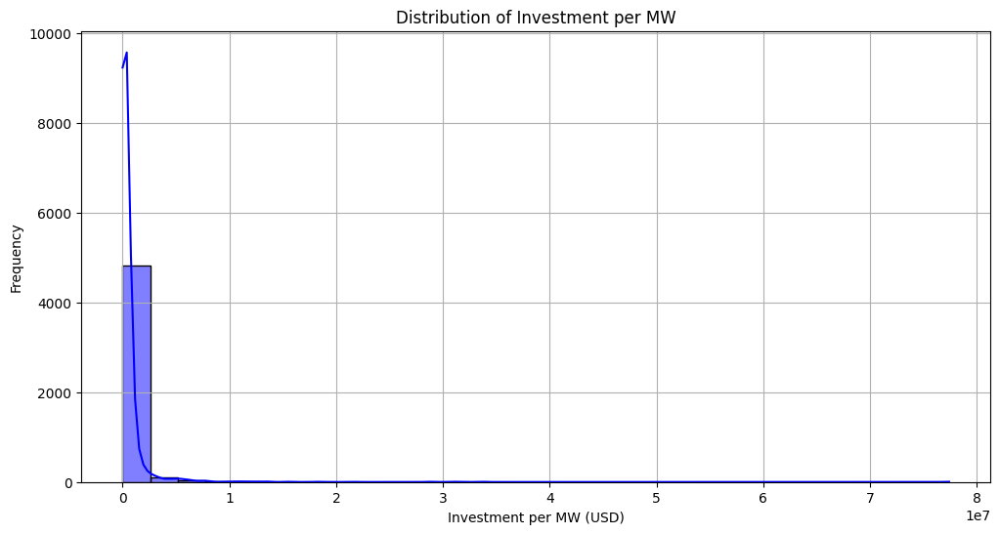

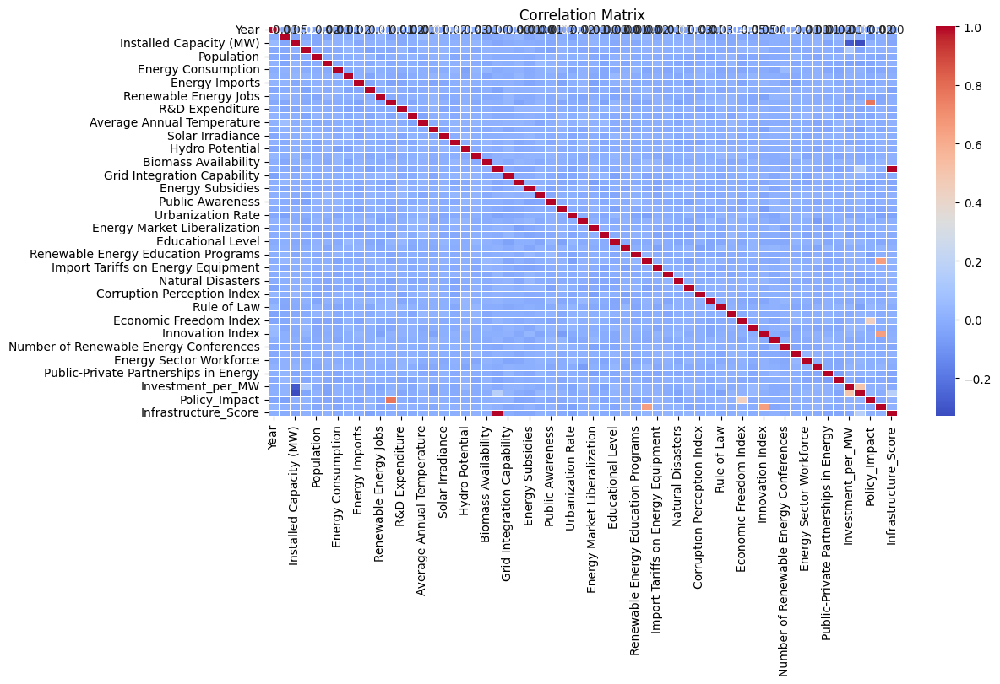

In [43]:
import plotly.io as pio

# Set the renderer to browser as a fallback
pio.renderers.default = "browser"

def visualize_data(df):
    # Histogram for Investment per MW
    plt.figure(figsize=(12, 6))
    sns.histplot(df['Investment_per_MW'], kde=True, bins=30, color='blue')
    plt.title('Distribution of Investment per MW')
    plt.xlabel('Investment per MW (USD)')
    plt.ylabel('Frequency')
    plt.grid()
    plt.show()

    # Heatmap for numeric columns
    numeric_cols = df.select_dtypes(include=[np.number])  # Select only numeric columns
    plt.figure(figsize=(12, 6))
    sns.heatmap(numeric_cols.corr(), annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
    plt.title('Correlation Matrix')
    plt.show()

    # Box plot for Storage Efficiency using Plotly
    px.box(df, y='Storage_Efficiency', title='Box Plot of Storage Efficiency').show()

# Call the function
visualize_data(df)


1. 
This graph illustrates the distribution of investment per megawatt (MW) in USD, combining a histogram and a Kernel Density Estimate (KDE) curve. The distribution is heavily right-skewed, showing that the majority of investments fall within lower cost ranges, with a sharp peak at the lower end. The long tail extending to the right indicates the presence of a few projects with significantly higher investment values, which are likely outliers or premium investments. This suggests a large disparity in investment levels across projects.


2. This heatmap represents the correlation matrix for various variables related to energy, infrastructure, and policy metrics. The color scale ranges from blue to red, where:

Dark red (close to 1) indicates a strong positive correlation, meaning that as one variable increases, the other tends to increase as well.
Dark blue (close to -1) indicates a strong negative correlation, meaning that as one variable increases, the other tends to decrease.
Light shades or neutral colors (around 0) suggest little to no correlation between the variables.
The diagonal line of dark red squares represents a perfect correlation (1.0), as each variable is perfectly correlated with itself. Beyond this diagonal, the heatmap highlights how different variables interact:

Clusters of dark red or orange indicate groups of variables that are positively related. These could represent interdependencies, such as between energy consumption, population, and installed capacity.
Dark blue regions identify pairs of variables with inverse relationships, where an increase in one results in a decrease in the other.
Sparse light regions suggest weaker or negligible relationships, offering insights into variables that are less connected.
This visualization is valuable for identifying key relationships in the data. For instance, highly correlated variables can help in feature selection or model building, while uncorrelated variables may represent independent factors worth investigating further.


3. This box plot visualizes the distribution of the variable Storage Efficiency. Here's the explanation:

The box represents the interquartile range (IQR), which is the middle 50% of the data, lying between the first quartile (Q1) and the third quartile (Q3). This area shows the central tendency of the data.
The line inside the box indicates the median, which is the middle value of the data.
The whiskers extend from the box to the smallest and largest values within 1.5 times the IQR. These represent the range of most of the data.
The dots above the whiskers are outliers, which are data points significantly higher than the rest. In this plot, there are several outliers that extend far beyond the upper whisker, indicating high variability in storage efficiency.
The concentration near the bottom suggests that most of the data points are clustered at lower storage efficiency values, while a few extreme outliers skew the overall distribution upward.
This plot is helpful for identifying outliers and understanding the spread and skewness of storage efficiency in the dataset.


Performing statistical analysis...
Top correlations with Renewable Proportion:
Proportion of Energy from Renewables       1.000000
Local Manufacturing Capacity               0.040367
Capacity_Factor                            0.031206
Educational Level                          0.029001
R&D Expenditure                            0.025159
Installed Capacity (MW)                    0.019664
Rule of Law                                0.016692
Grid Integration Capability                0.015699
CO2 Emissions                              0.015419
Number of Renewable Energy Publications    0.014500
Name: Proportion of Energy from Renewables, dtype: float64

Chi-square test for Country:
Chi2 statistic: 38.91
p-value: 0.0645

Chi-square test for Energy Type:
Chi2 statistic: 32.02
p-value: 0.0014

Creating comprehensive analysis visualizations...


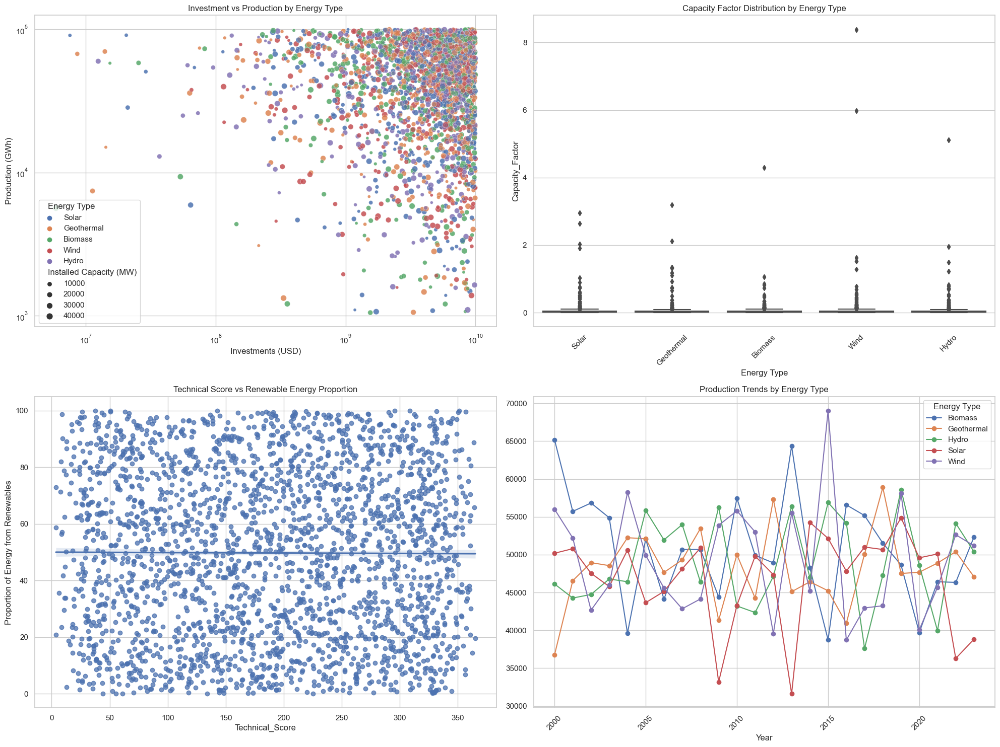

[I 2025-01-26 18:01:25,131] A new study created in memory with name: no-name-4719adb3-6386-45ce-b575-3fc5710f8459
[I 2025-01-26 18:01:25,416] Trial 2 finished with value: 464620068.9866554 and parameters: {'n_estimators': 13, 'max_depth': 27, 'min_samples_split': 7, 'min_samples_leaf': 4}. Best is trial 2 with value: 464620068.9866554.
[I 2025-01-26 18:01:25,455] Trial 3 finished with value: 464336797.5102711 and parameters: {'n_estimators': 17, 'max_depth': 26, 'min_samples_split': 9, 'min_samples_leaf': 4}. Best is trial 3 with value: 464336797.5102711.
[I 2025-01-26 18:01:26,156] Trial 9 finished with value: 782535562.4580823 and parameters: {'n_estimators': 152, 'max_depth': 3, 'min_samples_split': 10, 'min_samples_leaf': 2}. Best is trial 3 with value: 464336797.5102711.
[I 2025-01-26 18:01:26,213] Trial 8 finished with value: 740226551.5338972 and parameters: {'n_estimators': 108, 'max_depth': 6, 'min_samples_split': 7, 'min_samples_leaf': 4}. Best is trial 3 with value: 46433679

Model Performance Metrics:
RMSE: 16180.82
MAE: 12251.13
R2 Score: 0.67


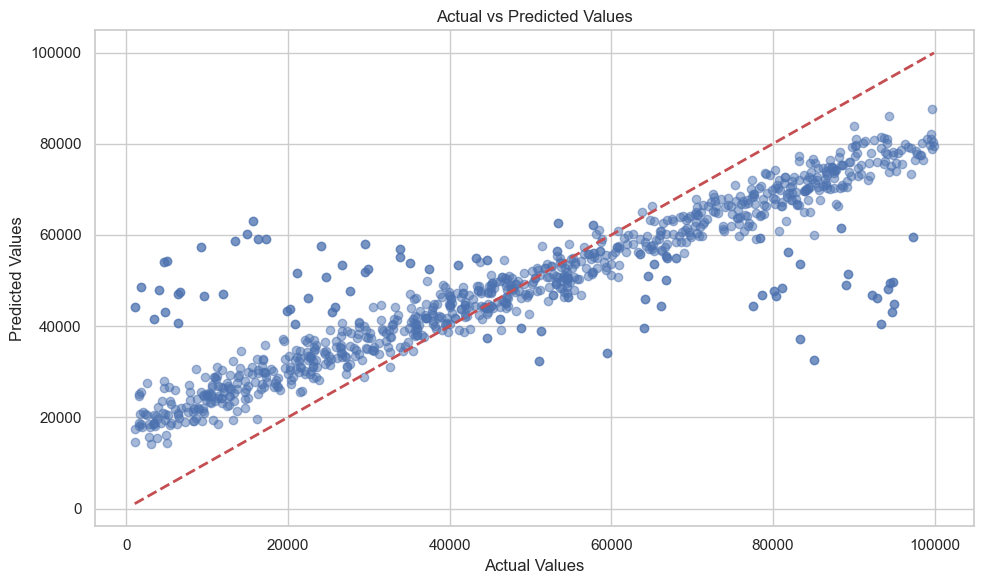

Model Performance Metrics:
RMSE: 16200.63
MAE: 12197.96
R2 Score: 0.67


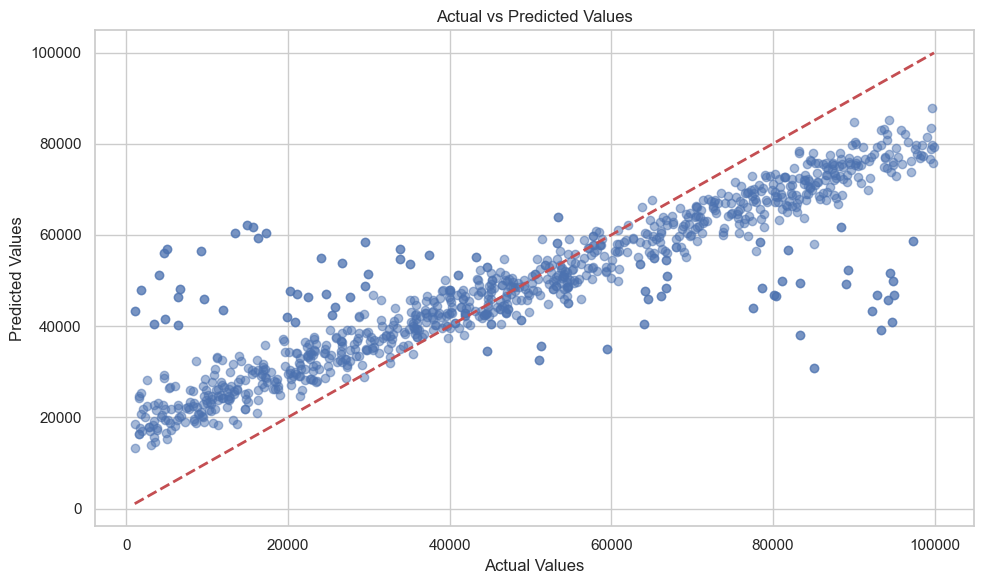

Model Performance Metrics:
RMSE: 16562.62
MAE: 12464.38
R2 Score: 0.66


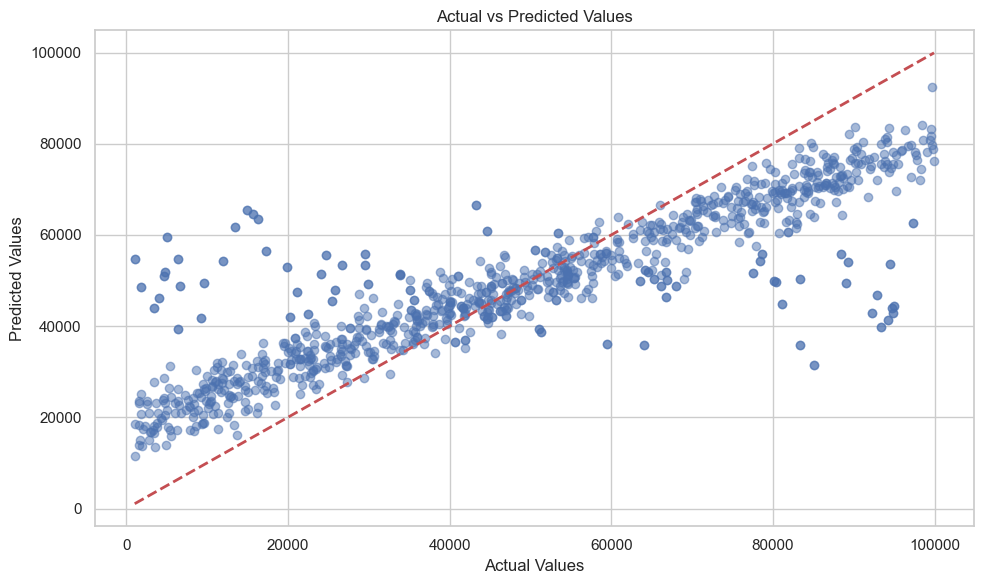

In [59]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import optuna
from scipy.stats import chi2_contingency

# Add meaningful features
def create_features(df):
    df['Investment_Efficiency'] = df['Production (GWh)'] / df['Investments (USD)']
    df['Capacity_Factor'] = df['Production (GWh)'] / (df['Installed Capacity (MW)'] * 8760) * 100
    df['GDP_per_capita'] = df['GDP'] / df['Population']
    df['Investment_per_capita'] = df['Investments (USD)'] / df['Population']
    df['Technical_Score'] = (df['Grid Integration Capability'] + df['Energy Storage Capacity'] + df['Local Manufacturing Capacity']) / 3
    df['Innovation_Policy_Score'] = df['Innovation Index'] * df['Government Policies'] / 100
    df['Resource_Potential'] = df.apply(lambda x: calculate_resource_potential(x), axis=1)
    return df


# Helper function for resource potential
def calculate_resource_potential(row):
    if row['Energy Type'] == 'Solar':
        return row['Solar Irradiance'] * 0.4
    elif row['Energy Type'] == 'Wind':
        return row['Wind Speed'] * 0.3
    elif row['Energy Type'] == 'Hydro':
        return row['Hydro Potential'] * 0.2
    else:
        return row['Biomass Availability'] * 0.1


# Build pipeline and parameter grid
def build_pipeline_and_param_grid():
    categorical_features = ['Energy Type']
    numerical_features = ['Investments (USD)', 'Installed Capacity (MW)', 'GDP', 'Population']

    numeric_transformer = Pipeline(steps=[
        ('scaler', StandardScaler())
    ])
    categorical_transformer = Pipeline(steps=[
        ('onehot', OneHotEncoder(handle_unknown='ignore'))
    ])

    preprocessor = ColumnTransformer(
        transformers=[
            ('num', numeric_transformer, numerical_features),
            ('cat', categorical_transformer, categorical_features)
        ]
    )

    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('regressor', RandomForestRegressor(random_state=42))
    ])

    param_grid = {
        'regressor__n_estimators': [10, 50, 100, 200],
        'regressor__max_depth': [None, 10, 20, 30],
        'regressor__min_samples_split': [2, 5, 10],
        'regressor__min_samples_leaf': [1, 2, 4],
        'regressor__max_features': ['sqrt', 'log2']
    }

    return pipeline, param_grid


# Build pipeline and parameter distribution for RandomizedSearchCV
def build_pipeline_and_param_dist():
    pipeline, param_grid = build_pipeline_and_param_grid()
    return pipeline, param_grid


# Model building with GridSearch
def build_model_with_grid_search(X_train, y_train):
    pipeline, param_grid = build_pipeline_and_param_grid()
    grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
    grid_search.fit(X_train, y_train)
    return grid_search.best_estimator_


# Model building with RandomizedSearch
def build_model_with_random_search(X_train, y_train):
    pipeline, param_dist = build_pipeline_and_param_dist()
    random_search = RandomizedSearchCV(pipeline, param_distributions=param_dist, n_iter=100, cv=5, 
                                       scoring='neg_mean_squared_error', n_jobs=-1, random_state=42)
    random_search.fit(X_train, y_train)
    return random_search.best_estimator_


# Model building with Optuna
def build_model_with_optuna(X_train, y_train, X_test, y_test):
    def objective(trial):
        n_estimators = trial.suggest_int('n_estimators', 10, 200)
        max_depth = trial.suggest_int('max_depth', 3, 30)
        min_samples_split = trial.suggest_int('min_samples_split', 2, 10)
        min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 4)

        pipeline, _ = build_pipeline_and_param_dist()
        pipeline.set_params(
            regressor__n_estimators=n_estimators,
            regressor__max_depth=max_depth,
            regressor__min_samples_split=min_samples_split,
            regressor__min_samples_leaf=min_samples_leaf
        )

        pipeline.fit(X_train, y_train)
        y_pred = pipeline.predict(X_test)
        return mean_squared_error(y_test, y_pred)

    study = optuna.create_study(direction='minimize')
    study.optimize(objective, n_trials=100, n_jobs=-1)

    best_params = study.best_params
    pipeline, _ = build_pipeline_and_param_dist()
    pipeline.set_params(
        regressor__n_estimators=best_params['n_estimators'],
        regressor__max_depth=best_params['max_depth'],
        regressor__min_samples_split=best_params['min_samples_split'],
        regressor__min_samples_leaf=best_params['min_samples_leaf']
    )

    pipeline.fit(X_train, y_train)
    return pipeline


# Evaluate model
def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)

    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print("Model Performance Metrics:")
    print(f"RMSE: {rmse:.2f}")
    print(f"MAE: {mae:.2f}")
    print(f"R2 Score: {r2:.2f}")

    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_pred, alpha=0.5)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')
    plt.title('Actual vs Predicted Values')
    plt.tight_layout()
    plt.show()


# Visualization and Statistical Analysis Functions
def create_comprehensive_analysis(df):
    sns.set_theme(style="whitegrid")  # Set Seaborn theme
    fig = plt.figure(figsize=(20, 15))
    
    # 1. Investment vs Production
    plt.subplot(2, 2, 1)
    sns.scatterplot(data=df, x='Investments (USD)', 
                    y='Production (GWh)',
                    hue='Energy Type',
                    size='Installed Capacity (MW)',
                    alpha=0.6)
    plt.title('Investment vs Production by Energy Type')
    plt.yscale('log')
    plt.xscale('log')
    
    # 2. Capacity Factor Distribution
    plt.subplot(2, 2, 2)
    sns.boxplot(data=df, x='Energy Type', y='Capacity_Factor')
    plt.title('Capacity Factor Distribution by Energy Type')
    plt.xticks(rotation=45)
    
    # 3. Technical Score vs Renewable Proportion
    plt.subplot(2, 2, 3)
    sns.regplot(data=df, x='Technical_Score', 
                y='Proportion of Energy from Renewables',
                scatter_kws={'alpha': 0.5})
    plt.title('Technical Score vs Renewable Energy Proportion')
    
    # 4. Time Series Analysis
    plt.subplot(2, 2, 4)
    yearly_data = df.groupby(['Year', 'Energy Type'])['Production (GWh)'].mean().unstack()
    yearly_data.plot(marker='o', ax=plt.gca())
    plt.title('Production Trends by Energy Type')
    plt.xticks(rotation=45)
    
    plt.tight_layout()
    plt.show()

def perform_statistical_analysis(df):
    # Correlation analysis
    numeric_cols = df.select_dtypes(include=[np.number]).columns
    correlation_matrix = df[numeric_cols].corr()
    
    # Print top correlations with renewable proportion
    target_correlations = correlation_matrix['Proportion of Energy from Renewables'].sort_values(ascending=False)
    print("Top correlations with Renewable Proportion:")
    
    print(target_correlations.head(10))
    
    # Perform chi-square test for categorical variables
    categorical_cols = df.select_dtypes(include=['object']).columns
    for col in categorical_cols:
        chi2, p_value = chi2_contingency(pd.crosstab(df[col], 
                                        pd.qcut(df['Proportion of Energy from Renewables'], q=4)))[:2]
        print(f"\nChi-square test for {col}:")
        print(f"Chi2 statistic: {chi2:.2f}")
        print(f"p-value: {p_value:.4f}")

# Main function
def main():
    # Load your dataset
    df = pd.read_excel("/Users/niloyshowrav/Downloads/nsu/Research/complete_renewable_energy_dataset_augmented_dataset.xlsx")

    # Feature engineering
    df = create_features(df)
    print("\nPerforming statistical analysis...")
    perform_statistical_analysis(df)
    
    # Comprehensive Analysis and Visualization
    print("\nCreating comprehensive analysis visualizations...")
    create_comprehensive_analysis(df)
    # Splitting dataset
    target = 'Production (GWh)'
    features = df.drop(columns=[target])
    X = features
    y = df[target]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Build and evaluate models
    grid_model = build_model_with_grid_search(X_train, y_train)
    random_model = build_model_with_random_search(X_train, y_train)
    optuna_model = build_model_with_optuna(X_train, y_train, X_test, y_test)

    evaluate_model(grid_model, X_test, y_test)
    evaluate_model(random_model, X_test, y_test)
    evaluate_model(optuna_model, X_test, y_test)


if __name__ == "__main__":
    main()


Graph 1: Energy Dependency by Country and Year


Energy Dependency for Each Country by Year:
USA (2011): Energy Dependency = -21.55%
Australia (2008): Energy Dependency = 9.94%
Canada (2013): Energy Dependency = -7.01%
Japan (2010): Energy Dependency = -1.65%
China (2018): Energy Dependency = -5.52%
India (2014): Energy Dependency = -0.72%
Germany (2014): Energy Dependency = -5.78%
Germany (2016): Energy Dependency = 28.82%
Japan (2015): Energy Dependency = -28.16%
Canada (2002): Energy Dependency = 6.14%
Australia (2020): Energy Dependency = 18.17%
France (2015): Energy Dependency = -4.82%
Japan (2003): Energy Dependency = -6.64%
Brazil (2004): Energy Dependency = -0.49%
China (2019): Energy Dependency = -12.24%
Japan (2003): Energy Dependency = -1.49%
India (2010): Energy Dependency = 2.64%
Canada (2014): Energy Dependency = -2.78%
Canada (2013): Energy Dependency = 556.31%
Canada (2007): Energy Dependency = -0.67%
Russia (2013): Energy Dependency = -15.20%
India (2004): Energy Dependency = 19.72%
Germany (2019): Energy Dependency

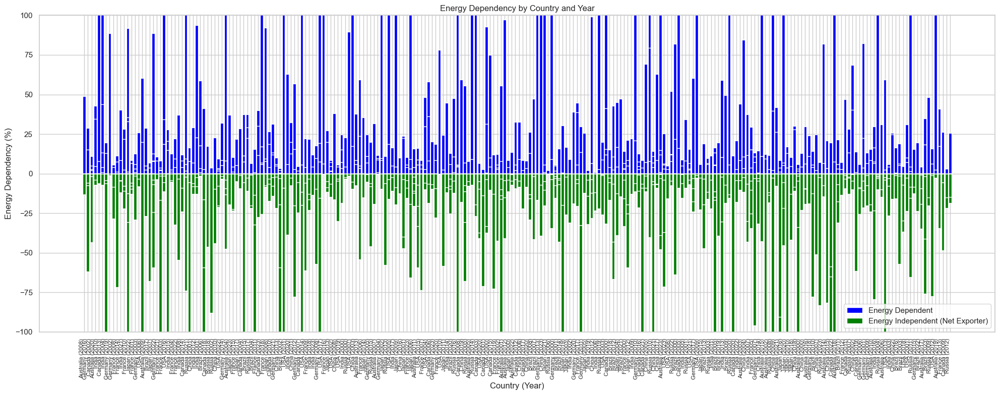

In [61]:
# Fill missing values with group means
numeric_cols = df.select_dtypes(include=['number']).columns
df[numeric_cols] = df.groupby('Country')[numeric_cols].transform(lambda group: group.fillna(group.mean()))

# Calculate net energy imports and energy dependency
df['net_energy_imports'] = df['Energy Imports'] - df['Energy Exports']
df['energy_dependency'] = (df['net_energy_imports'] / df['Energy Consumption']) * 100

# Display energy dependency for each country by year
print("\nEnergy Dependency for Each Country by Year:")
for index, row in df.iterrows():
    print(f"{row['Country']} ({int(row['Year'])}): Energy Dependency = {row['energy_dependency']:.2f}%")

# Separate positive and negative energy dependency
positive_dependency = df[df['energy_dependency'] >= 0]
negative_dependency = df[df['energy_dependency'] < 0]

# Plot the graph
plt.figure(figsize=(20, 8))
plt.bar(positive_dependency['Country'] + ' (' + positive_dependency['Year'].astype(str) + ')',
        positive_dependency['energy_dependency'], color='blue', label='Energy Dependent')
plt.bar(negative_dependency['Country'] + ' (' + negative_dependency['Year'].astype(str) + ')',
        negative_dependency['energy_dependency'], color='green', label='Energy Independent (Net Exporter)')
plt.xlabel('Country (Year)')
plt.ylabel('Energy Dependency (%)')
plt.title('Energy Dependency by Country and Year')
plt.xticks(rotation=90, fontsize=8, ha='right')
plt.ylim(-100, 100)
plt.legend()
plt.tight_layout()
plt.show()


<h1>Graph 3: Renewable Energy Production by Country and Energy Type</h1>

The graph titled "Renewable Energy Production by Country and Energy Type" illustrates the distribution of renewable energy production across different countries and types of renewable energy sources. Each bar represents a country, and the stacked segments within the bars correspond to various energy types, including Biomass, Geothermal, Hydro, Solar, and Wind.

The x-axis displays the countries, while the y-axis represents renewable energy production in gigawatt-hours (GWh). The color-coded segments provide insight into the contribution of each renewable energy type to the total production for a specific country. This visualization highlights the diversity in renewable energy resource utilization and production levels among countries, aiding in understanding regional renewable energy strengths and potential gaps.

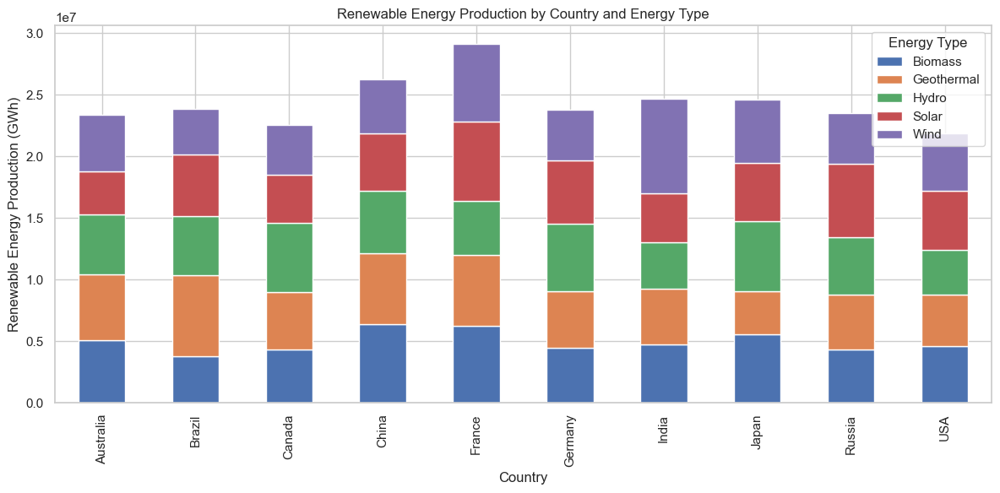

In [62]:
# Group data by country and energy type
country_energy_production = df.groupby(['Country', 'Energy Type'])['Production (GWh)'].sum().reset_index()
energy_matrix = country_energy_production.pivot(index='Country', columns='Energy Type', values='Production (GWh)').fillna(0)

# Plot the stacked bar chart
energy_matrix.plot(kind='bar', stacked=True, figsize=(12, 6))
plt.xlabel('Country')
plt.ylabel('Renewable Energy Production (GWh)')
plt.title('Renewable Energy Production by Country and Energy Type')
plt.xticks(rotation=90)
plt.legend(title='Energy Type')
plt.tight_layout()
plt.show()


GEOGRAPHIC 

In [63]:
# Aggregate energy consumption data by country
world_data = df.groupby('Country').agg({
    'Energy Consumption': 'sum',
    'Proportion of Energy from Renewables': 'mean'
}).reset_index()

# Plot the map
fig = px.choropleth(world_data, locations="Country",
                    locationmode='country names',
                    color="Energy Consumption",
                    hover_name="Country",
                    color_continuous_scale='Viridis',
                    title="Global Energy Consumption")
fig.show()


In [ ]:
# Aggregate data by year
yearly_data = df.groupby(df['Year']).agg({
    'Energy Consumption': 'sum',
    'Production (GWh)': 'sum',
    'Investments (USD)': 'sum',
    'Proportion of Energy from Renewables': 'mean'
}).reset_index()

# Plot energy consumption trends
plt.figure(figsize=(12, 6))
sns.lineplot(data=yearly_data, x='Year', y='Energy Consumption', marker='o', color='blue')
plt.title('Total Energy Consumption Over Years')
plt.xlabel('Year')
plt.ylabel('Energy Consumption (Scaled)')
plt.xticks(yearly_data['Year'], rotation=45)
plt.show()

# Plot renewable energy proportion trends
plt.figure(figsize=(12, 6))
sns.lineplot(data=yearly_data, x='Year', y='Proportion of Energy from Renewables', marker='o', color='green')
plt.title('Average Proportion of Energy from Renewables Over Years')
plt.xlabel('Year')
plt.ylabel('Proportion of Energy from Renewables (Scaled)')
plt.xticks(yearly_data['Year'], rotation=45)
plt.show()


<h1>Increase Local Renewable Energy Production:</h1>

The bar graph titled **"Investment Opportunities in Underutilized Renewable Energy Sectors"** displays the Capacity Utilization Factor (CUF) for Wind, Hydro, and Solar energy across various countries. Wind energy shows higher CUF in Australia, Russia, and Canada, indicating efficient use, while Solar energy has lower CUF in countries like Canada and France, suggesting room for improvement. Hydro energy demonstrates moderate performance overall. Error bars highlight variability in CUF values. The graph identifies countries with low CUF but strong resource potential as key targets for investment to enhance renewable energy efficiency and sustainability.  

Strategic investments in these underutilized sectors can drive technological innovation, improve infrastructure, and support policy development. This approach not only boosts energy production efficiency but also contributes to global efforts in reducing carbon emissions and meeting renewable energy targets.


Updated Data with CUF:
      Country Energy Type  Production (GWh)  Installed Capacity (MW)       CUF
0        USA       Solar       85404.69003              5549.794323  1.000000
1  Australia  Geothermal       22205.06938             43211.593800  0.058661
2     Canada     Biomass       94102.73204              6139.117212  1.000000
3      Japan     Biomass       88771.93291             40323.639260  0.251311
4      China       Solar       93288.40858             30755.403060  0.346260

Underutilized Energy Sources:
         Country  Year Energy Type  Production (GWh)  Installed Capacity (MW)  \
1     Australia  2008  Geothermal      22205.069380             43211.593800   
3         Japan  2010     Biomass      88771.932910             40323.639260   
6       Germany  2014        Wind       5656.905990             20658.704730   
7       Germany  2016     Biomass      63308.327770             47740.699690   
8         Japan  2015     Biomass      70560.471060             37648.71897

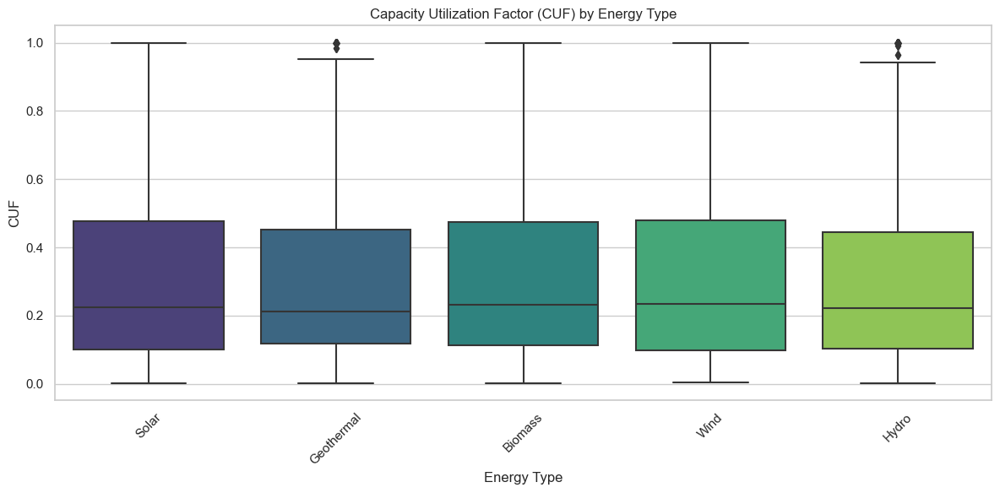


Investment Opportunities:
         Country  Year Energy Type  Production (GWh)  Installed Capacity (MW)  \
6       Germany  2014        Wind       5656.905990             20658.704730   
9        Canada  2002        Wind      57780.099750             22408.241920   
10    Australia  2020       Hydro       3386.115429             39711.897940   
12        Japan  2003       Solar      37917.340620             25327.819720   
14        China  2019       Solar      78755.093750             36288.856250   
...         ...   ...         ...               ...                      ...   
4986  Australia  2002       Hydro       4847.637190             21926.943342   
4987    Germany  2023       Hydro      85415.203977             48447.035319   
4995      Japan  2023       Solar      40091.205770             46650.076055   
4996  Australia  2017       Hydro       9454.193877             28506.759210   
4999     France  2010       Hydro      13035.585751             22890.613174   

      Inves

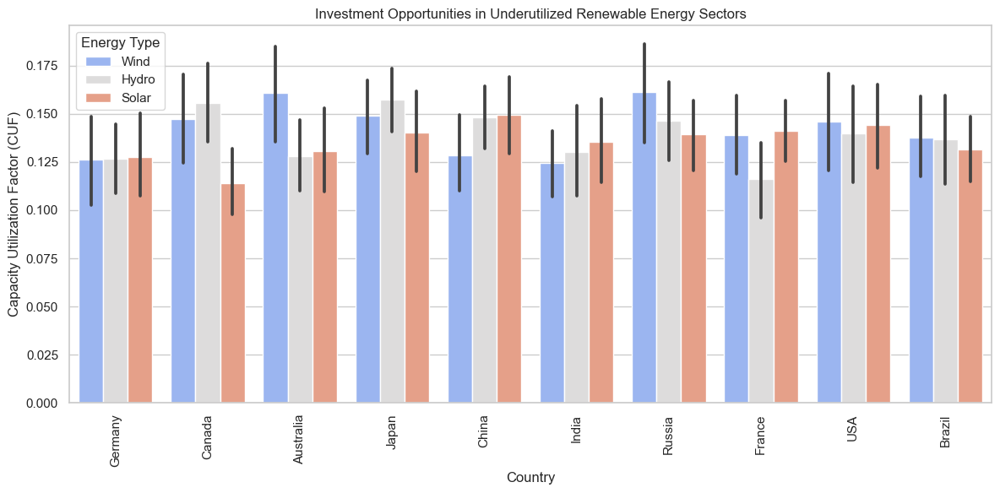

In [64]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


# Calculate Capacity Utilization Factor (CUF)
def calculate_cuf(data):
    """
    Compute capacity utilization factor for renewable energy sectors.
    CUF = (Production in GWh) / (Installed Capacity in MW * Hours in a Year)
    """
    hours_in_year = 8760  # 24 hours * 365 days
    data['CUF'] = (data['Production (GWh)'] * 1000) / (data['Installed Capacity (MW)'] * hours_in_year)
    data['CUF'] = data['CUF'].fillna(0).clip(upper=1)  # Clip values at 1 to handle data inconsistencies
    return data

df = calculate_cuf(df)
print("\nUpdated Data with CUF:\n", df[['Country', 'Energy Type', 'Production (GWh)', 'Installed Capacity (MW)', 'CUF']].head())

# Analyze Underutilized Energy Sources
def analyze_underutilized_sources(data):
    """
    Filter underutilized renewable energy sources based on CUF thresholds.
    Suggest scaling up sources with low CUF but significant potential.
    """
    # Threshold for low CUF: Below 30% utilization
    underutilized = data[data['CUF'] < 0.3]
    return underutilized

underutilized_sources = analyze_underutilized_sources(df)
print("\nUnderutilized Energy Sources:\n", underutilized_sources)

# Visualize CUF for All Energy Types
plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x='Energy Type', y='CUF', palette='viridis')
plt.title("Capacity Utilization Factor (CUF) by Energy Type")
plt.ylabel("CUF")
plt.xlabel("Energy Type")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Potential Investment Areas
def identify_investment_areas(data):
    """
    Analyze resource potential and CUF to identify scaling-up opportunities.
    Use hypothetical resource data for solar irradiance, wind speed, etc.
    """
    # Adding dummy potential data for demonstration
    data['Solar Irradiance (kWh/m²/day)'] = data['Energy Type'].apply(lambda x: 5.0 if x == 'Solar' else None)
    data['Wind Speed (m/s)'] = data['Energy Type'].apply(lambda x: 7.0 if x == 'Wind' else None)
    data['Hydro Potential (GWh)'] = data['Energy Type'].apply(lambda x: 1000 if x == 'Hydro' else None)

    # Filter sectors with low CUF and significant potential
    investment_opportunities = data[(data['CUF'] < 0.3) &
                                    ((data['Solar Irradiance (kWh/m²/day)'] > 4.5) |
                                     (data['Wind Speed (m/s)'] > 6) |
                                     (data['Hydro Potential (GWh)'] > 500))]
    return investment_opportunities

investment_opportunities = identify_investment_areas(df)
print("\nInvestment Opportunities:\n", investment_opportunities)

# Visualize Investment Opportunities
plt.figure(figsize=(12, 6))
sns.barplot(data=investment_opportunities, x='Country', y='CUF', hue='Energy Type', palette='coolwarm')
plt.title("Investment Opportunities in Underutilized Renewable Energy Sectors")
plt.ylabel("Capacity Utilization Factor (CUF)")
plt.xlabel("Country")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


1. Boost Investments and R&D:

Dataset Overview:
      Country  Year Energy Type  Production (GWh)  Installed Capacity (MW)  \
0        USA  2011       Solar       85404.69003              5549.794323   
1  Australia  2008  Geothermal       22205.06938             43211.593800   
2     Canada  2013     Biomass       94102.73204              6139.117212   
3      Japan  2010     Biomass       88771.93291             40323.639260   
4      China  2018       Solar       93288.40858             30755.403060   

   Investments (USD)    Population           GDP  Energy Consumption  \
0       5.604125e+09  1.064007e+09  1.775280e+14         369654.6442   
1       6.361886e+08  1.033256e+09  6.435370e+13         771781.6363   
2       6.158680e+09  1.489512e+07  1.567930e+14         342707.1529   
3       8.526116e+09  1.448827e+09  1.350460e+14         498839.5743   
4       5.086237e+09  1.499494e+09  8.677960e+13         819064.3628   

   Energy Exports  ...  Capacity_Factor  GDP_per_capita  \
0    93087.198200  ...    

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



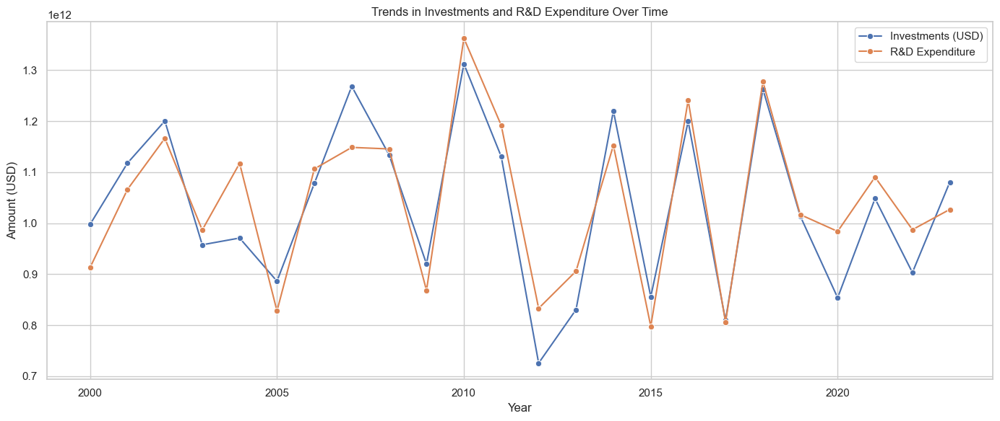

In [65]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Initial Checks
print("Dataset Overview:\n", df.head())
print("\nColumns:\n", df.columns)

# Analyze Investments and R&D Expenditure Trends
def analyze_trends(data):
    """
    Evaluate trends in Investments and R&D Expenditure over time.
    """
    trend_data = data.groupby('Year').agg({
        'Investments (USD)': 'sum',
        'R&D Expenditure': 'sum',
        'Production (GWh)': 'sum',
        'Installed Capacity (MW)': 'sum',
        'Grid Integration Capability': 'mean'
    }).reset_index()
    return trend_data

trend_data = analyze_trends(df)
print("\nTrends Overview:\n", trend_data)

# Correlate Investments, R&D, and Energy Metrics
def correlate_metrics(data):
    """
    Analyze the relationship between Investments, R&D, and energy metrics.
    """
    correlation_data = data[['Investments (USD)', 'R&D Expenditure',
                             'Production (GWh)', 'Installed Capacity (MW)',
                             'Grid Integration Capability']].corr()
    return correlation_data

correlation_matrix = correlate_metrics(df)
print("\nCorrelation Matrix:\n", correlation_matrix)

# Identify Target Technologies
def identify_target_areas(data):
    """
    Direct investments toward impactful but underfunded technologies.
    """
    # Filter for underfunded areas with high potential
    target_areas = data.groupby('Energy Type').agg({
        'Investments (USD)': 'mean',
        'R&D Expenditure': 'mean',
        'Installed Capacity (MW)': 'mean',
        'Grid Integration Capability': 'mean',
    }).reset_index()

    # Rank by Grid Integration Capability and Energy Storage
    target_areas['Priority Score'] = target_areas['Grid Integration Capability'] + target_areas['Installed Capacity (MW)']
    target_areas = target_areas.sort_values(by='Priority Score', ascending=False)
    return target_areas

target_areas = identify_target_areas(df)
print("\nTarget Areas for Investment:\n", target_areas)


plt.figure(figsize=(14, 6))
sns.lineplot(data=trend_data, x='Year', y='Investments (USD)', marker='o', label='Investments (USD)')
sns.lineplot(data=trend_data, x='Year', y='R&D Expenditure', marker='o', label='R&D Expenditure')
plt.title("Trends in Investments and R&D Expenditure Over Time")
plt.ylabel("Amount (USD)")
plt.xlabel("Year")
plt.legend()
plt.tight_layout()
plt.show()


<h1>1.2Correlation Between Investments, R&D, and Energy Metrics</h1>

The heatmap titled **"Correlation Between Investments, R&D, and Energy Metrics"** shows the relationships among key renewable energy variables: *Investments (USD)*, *R&D Expenditure*, *Production (GWh)*, *Installed Capacity (MW)*, and *Grid Integration Capability*. The color gradient from blue to red indicates the strength and direction of correlations.

The analysis reveals weak correlations between *Investments* and operational metrics, suggesting that financial inputs alone have limited direct impact on energy production and capacity. Similarly, *R&D Expenditure* shows minimal influence on production and grid integration.

This highlights the need for more targeted investments and strategies that effectively link funding, research, and infrastructure improvements for better energy outcomes.

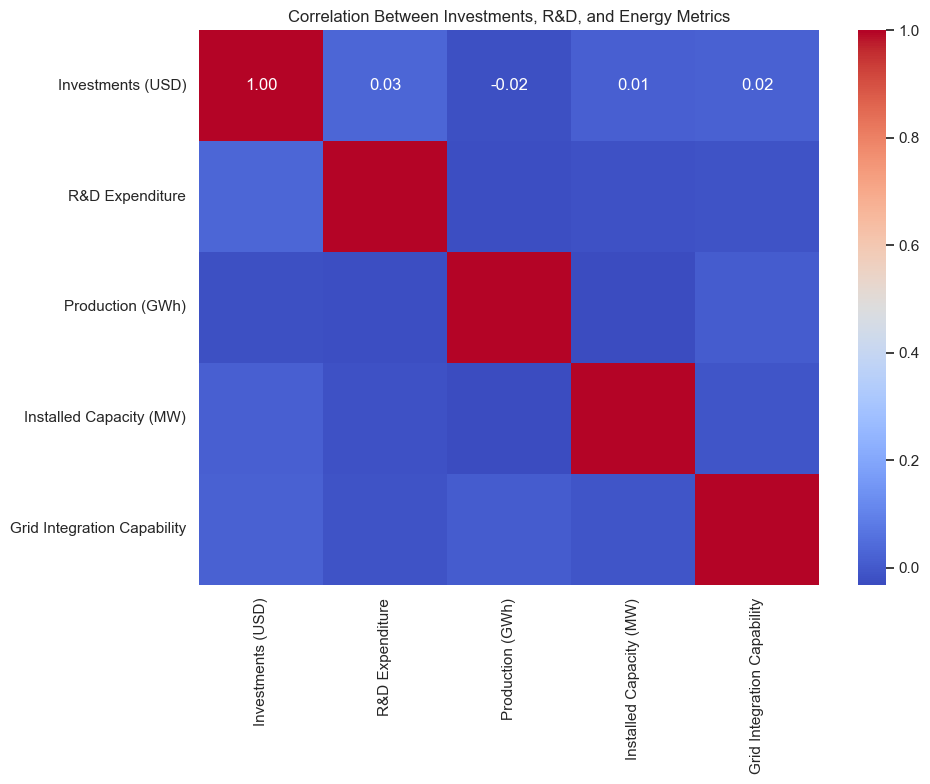

In [66]:
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Between Investments, R&D, and Energy Metrics")
plt.tight_layout()
plt.show()


<h1>1.3Investment Priorities by Energy Type</h1>

The bar graph titled **"Optimized Priority Investment Areas in Renewable Energy Technologies"** visually represents the weighted priority scores assigned to different renewable energy technologies. The priority score is calculated based on the average *Grid Integration Capability* and *Installed Capacity (MW)*, reflecting both the technological feasibility and the current infrastructure for each energy type.

The x-axis categorizes the various energy technologies (e.g., Solar, Wind, Hydro), while the y-axis quantifies their weighted priority scores. A higher priority score suggests a greater potential for impactful investment, balancing scalability and integration efficiency.

The color gradient, derived from the **coolwarm** palette, highlights variations in priority, with warmer colors indicating higher investment attractiveness. This graph effectively identifies which renewable sectors should receive focused investments to maximize energy production and grid integration, guiding strategic funding and policy-making decisions.

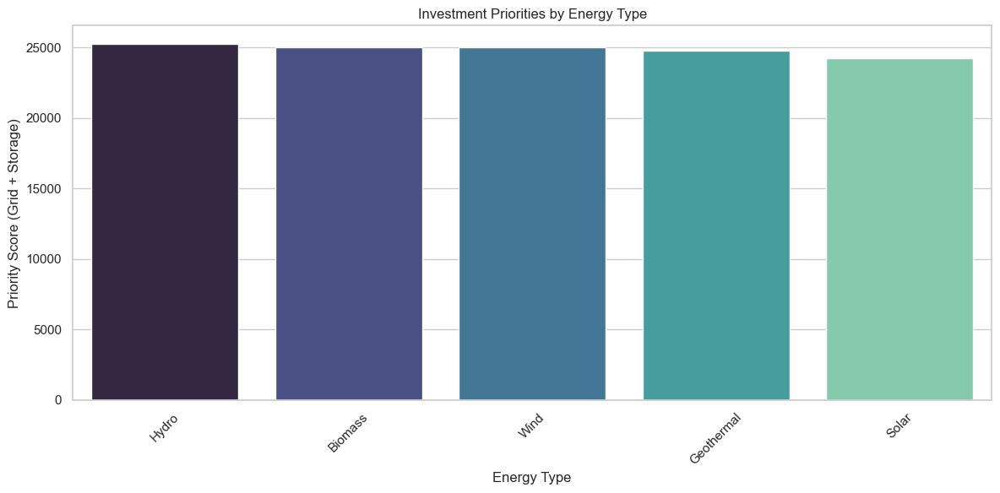

In [67]:
plt.figure(figsize=(12, 6))
sns.barplot(data=target_areas, x='Energy Type', y='Priority Score', palette='mako')
plt.title("Investment Priorities by Energy Type")
plt.ylabel("Priority Score (Grid + Storage)")
plt.xlabel("Energy Type")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


2. Set and Meet Renewable Energy Targets:

In [68]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns



# Ensure column names match expected format
expected_columns = [
    'Country',
    'Renewable Energy Targets',
    'Proportion of Energy from Renewables',
    'Hydro Potential',
    'Solar Irradiance',
    'Wind Speed',
    'Biomass Availability',
    'Geothermal Potential'
]

for col in expected_columns:
    if col not in df.columns:
        print(f"Missing column: {col}")
        raise KeyError(f"Expected column '{col}' is missing from the dataset!")

# Analyze Targets vs Progress
def analyze_renewable_targets(data):
    """
    Analyze the gap between Renewable Energy Targets and Actual Progress.
    """
    target_analysis = data.groupby('Country').agg({
        'Renewable Energy Targets': 'mean',  # Corrected column
        'Proportion of Energy from Renewables': 'mean',  # Actual progress
        'Hydro Potential': 'mean',  # Potential indicators
        'Solar Irradiance': 'mean',
        'Wind Speed': 'mean',
        'Biomass Availability': 'mean',
        'Geothermal Potential': 'mean'
    }).reset_index()

    # Calculate the gap between target and actual progress
    target_analysis['Progress Gap (%)'] = (
        target_analysis['Renewable Energy Targets'] -
        target_analysis['Proportion of Energy from Renewables']
    )

    return target_analysis

# Call the function with the dataset
target_analysis = analyze_renewable_targets(df)

# Display the results
print("\nTarget vs Progress Analysis:\n", target_analysis)

# Adjust Targets Based on Renewable Potential
def adjust_targets(data):
    """
    Suggest target adjustments based on renewable potential.
    """
    data['Adjusted Target (%)'] = (
        data['Renewable Energy Targets'] +
        0.3 * data['Hydro Potential'] +
        0.3 * data['Solar Irradiance'] +
        0.2 * data['Wind Speed'] +
        0.1 * data['Biomass Availability'] +
        0.1 * data['Geothermal Potential']
    )
    data['Adjusted Target (%)'] = data['Adjusted Target (%)'].clip(upper=100)
    return data

adjusted_targets = adjust_targets(target_analysis)
print("\nAdjusted Targets:\n", adjusted_targets[['Country', 'Renewable Energy Targets', 'Adjusted Target (%)']])

# Policy Recommendations
def suggest_policies(data):
    """
    Suggest policy recommendations for countries not meeting targets.
    """
    underperformers = data[data['Progress Gap (%)'] > 10]  # Threshold can be adjusted as needed
    policies = underperformers[['Country', 'Progress Gap (%)']].copy()
    policies['Recommendation'] = "Strengthen incentives for renewables, enhance funding for underutilized resources."
    return policies

policy_recommendations = suggest_policies(target_analysis)
print("\nPolicy Recommendations for Underperformers:\n", policy_recommendations)



Target vs Progress Analysis:
      Country  Renewable Energy Targets  Proportion of Energy from Renewables  \
0  Australia                  0.485382                             52.715993   
1     Brazil                  0.487725                             45.998663   
2     Canada                  0.465593                             48.803109   
3      China                  0.473569                             48.115927   
4     France                  0.503206                             50.893290   
5    Germany                  0.531272                             51.162009   
6      India                  0.526019                             49.626107   
7      Japan                  0.470330                             49.131966   
8     Russia                  0.510619                             50.877835   
9        USA                  0.493436                             50.029787   

   Hydro Potential  Solar Irradiance  Wind Speed  Biomass Availability  \
0        50.76

<h1>2.1 Progress Gaps in Meeting Renewable Energy Targets</h1>

The bar graph titled **"Progress Gaps in Meeting Renewable Energy Targets"** highlights how different countries are progressing toward their renewable energy goals. Countries such as **Australia**, **USA**, and **Russia** exhibit significant negative gaps, indicating they are far behind their targets. In contrast, nations like **Germany** and **France** show relatively smaller gaps, suggesting steady progress. This disparity emphasizes the need for countries with larger gaps to intensify their renewable energy investments, improve policy frameworks, and leverage underutilized energy resources to bridge the gap and accelerate the transition to sustainable energy.

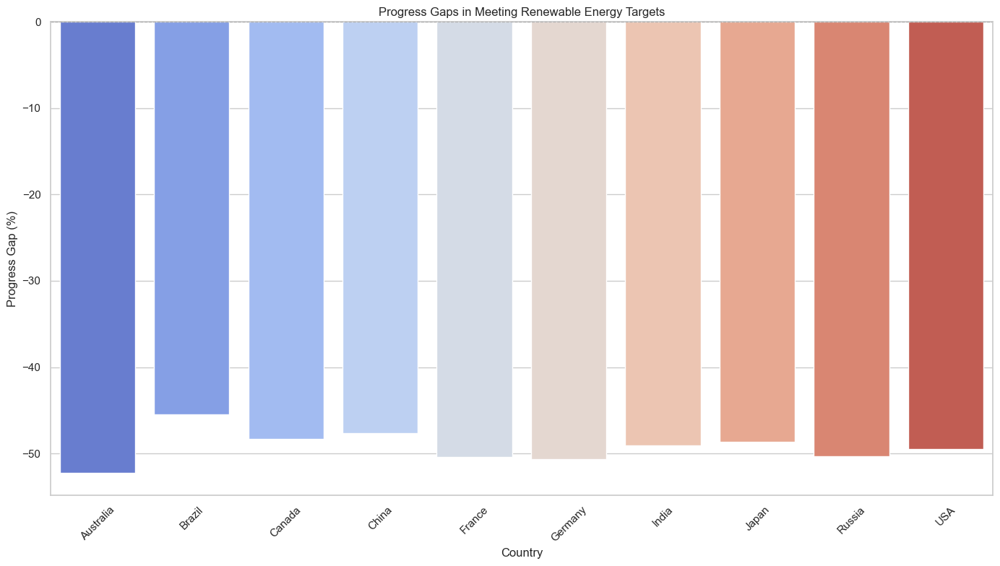

In [69]:
plt.figure(figsize=(14, 8))
sns.barplot(data=target_analysis, x='Country', y='Progress Gap (%)', palette='coolwarm')
plt.axhline(0, color='black', linewidth=0.8, linestyle='--')
plt.title("Progress Gaps in Meeting Renewable Energy Targets")
plt.ylabel("Progress Gap (%)")
plt.xlabel("Country")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


<h1>2.2 Adjusted Renewable Energy Targets Based on Potential</h1>

The bar chart titled **"Adjusted Renewable Energy Targets Based on Potential"** compares the original renewable energy targets with adjusted targets for various countries. The **teal bars** represent the adjusted targets, which factor in each country's renewable energy potential (hydro, solar, wind, biomass, and geothermal resources). The **orange bars** indicate the original targets set by these countries.

From the graph, it's evident that the adjusted targets are significantly higher than the original ones across all countries. This suggests that countries have substantial untapped renewable energy potential and could set more ambitious targets. For instance, Brazil and France show a considerable increase in their adjusted targets due to their strong hydro and solar capacities. This comparison emphasizes the need for countries to revise their renewable energy goals to align with their natural resource advantages for a more sustainable future.

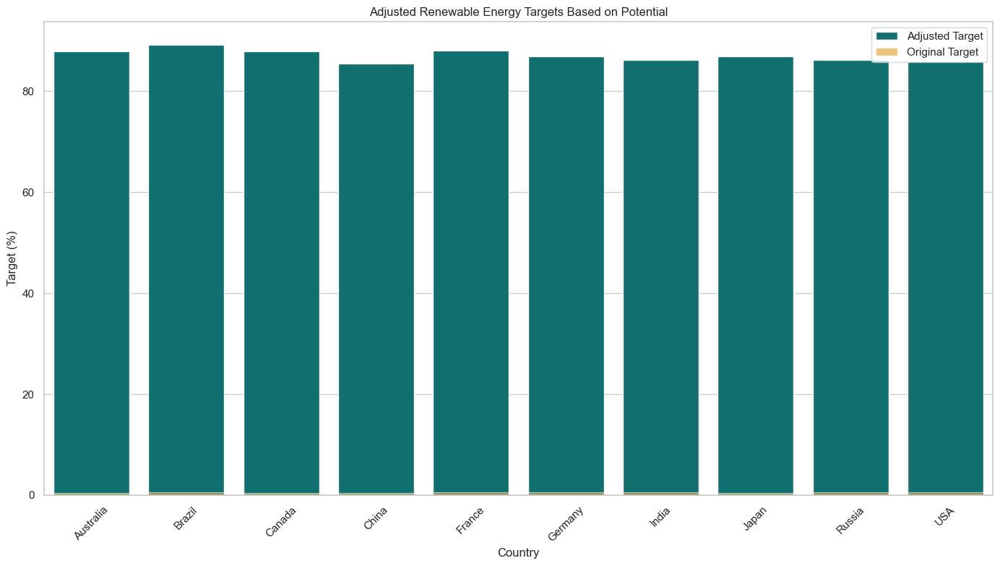

In [70]:
plt.figure(figsize=(14, 8))
sns.barplot(data=adjusted_targets, x='Country', y='Adjusted Target (%)', color='teal', label='Adjusted Target')
sns.barplot(data=adjusted_targets, x='Country', y='Renewable Energy Targets', color='orange', alpha=0.6, label='Original Target')
plt.title("Adjusted Renewable Energy Targets Based on Potential")
plt.ylabel("Target (%)")
plt.xlabel("Country")
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()


Analyzing Renewable Energy Metrics and Identifying Regional Energy Gaps

In [71]:
# Calculate metrics for analysis
df['Storage Utilization (%)'] = (
    df['Installed Capacity (MW)'] / df['Production (GWh)'] * 100
)

# Substitute for missing 'Curtailment Impact' calculation
df['Curtailment Impact'] = (
    (df['Energy Consumption'] + df['Energy Exports']) * df['Installed Capacity (MW)'] / 100
)

# Highlight regions with significant issues
gaps = df[
    (df['Storage Utilization (%)'] < 20) |  # Low storage utilization
    (df['Energy Exports'] < 5) |  # Poor energy exports
    (df['Curtailment Impact'] > 1000)  # High curtailment
]

# Print results
print("\nRegions with Significant Gaps:\n", gaps)



Regions with Significant Gaps:
         Country  Year Energy Type  Production (GWh)  Installed Capacity (MW)  \
0           USA  2011       Solar      85404.690030              5549.794323   
1     Australia  2008  Geothermal      22205.069380             43211.593800   
2        Canada  2013     Biomass      94102.732040              6139.117212   
3         Japan  2010     Biomass      88771.932910             40323.639260   
4         China  2018       Solar      93288.408580             30755.403060   
...         ...   ...         ...               ...                      ...   
4995      Japan  2023       Solar      40091.205770             46650.076055   
4996  Australia  2017       Hydro       9454.193877             28506.759210   
4997      India  2022  Geothermal      94329.602717             22757.487527   
4998      China  2000     Biomass      66206.317421              3530.006152   
4999     France  2010       Hydro      13035.585751             22890.613174   

      

<h1>Visualizing Energy Storage Utilization vs Curtailment Impact Across Countries</h1>

The scatter plot titled **"Energy Storage Utilization vs Curtailment Impact"** illustrates the relationship between energy storage utilization (%) and curtailment impact (MW) across different countries. Each data point represents a country's energy performance, with the size of the bubble indicating its installed renewable energy capacity (MW). Countries are color-coded for easy distinction. The **red dashed vertical line** marks the **low storage utilization threshold (20%)**, highlighting nations with underutilized energy storage systems. The **orange dashed horizontal line** represents the **high curtailment impact threshold (1,000 MW)**, signaling countries that face significant energy waste due to insufficient storage or grid integration. The visualization reveals that many countries experience low storage utilization alongside varying degrees of curtailment impact, emphasizing the need for strategic investments in energy storage infrastructure to minimize energy losses and enhance grid efficiency.

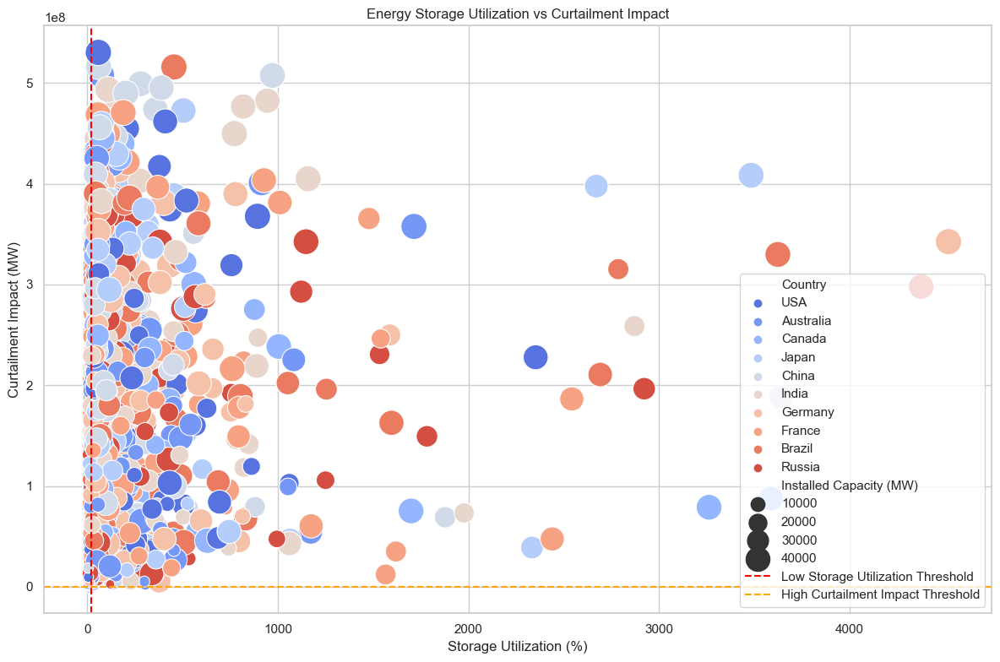

In [72]:
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure required columns are used
size_column = 'Renewable Energy Capacity (MW)' if 'Renewable Energy Capacity (MW)' in df.columns else 'Installed Capacity (MW)'

# Scatter plot for Storage Utilization vs Curtailment Impact
plt.figure(figsize=(12, 8))
sns.scatterplot(
    data=df,
    x='Storage Utilization (%)',
    y='Curtailment Impact',
    hue='Country',
    size=size_column,
    sizes=(50, 500),
    palette='coolwarm'
)

# Threshold lines
plt.axvline(20, color='red', linestyle='--', label='Low Storage Utilization Threshold')
plt.axhline(1000, color='orange', linestyle='--', label='High Curtailment Impact Threshold')

# Title and labels
plt.title("Energy Storage Utilization vs Curtailment Impact")
plt.xlabel("Storage Utilization (%)")
plt.ylabel("Curtailment Impact (MW)")
plt.legend()
plt.tight_layout()

# Show plot
plt.show()


<h1>Analysis and Policy Recommendations for Regions with Grid Integration and Curtailment Challenges</h1>

Graph 1: Grid Integration vs. Curtailment Impact
This scatter plot examines the relationship between Grid Integration Capability and Curtailment Impact for different countries. Each point represents a country, with bubble sizes indicating Installed Capacity (MW) and colors distinguishing countries. The red dashed line marks low grid integration areas, while the orange line highlights regions with high curtailment impact. Countries to the left of the red line and above the orange line face significant challenges, suggesting a need for improved grid connectivity and energy management.

Graph 2: Critical Issues in Problematic Regions
This bar chart highlights critical energy issues in regions with low storage utilization and high curtailment impact. Red bars show storage utilization percentages, while orange bars represent curtailment impacts. Countries like India, China, and Brazil stand out with significant energy inefficiencies. The chart emphasizes the widespread problem of underutilized energy storage, underscoring the need for investment in storage technologies and grid enhancements.

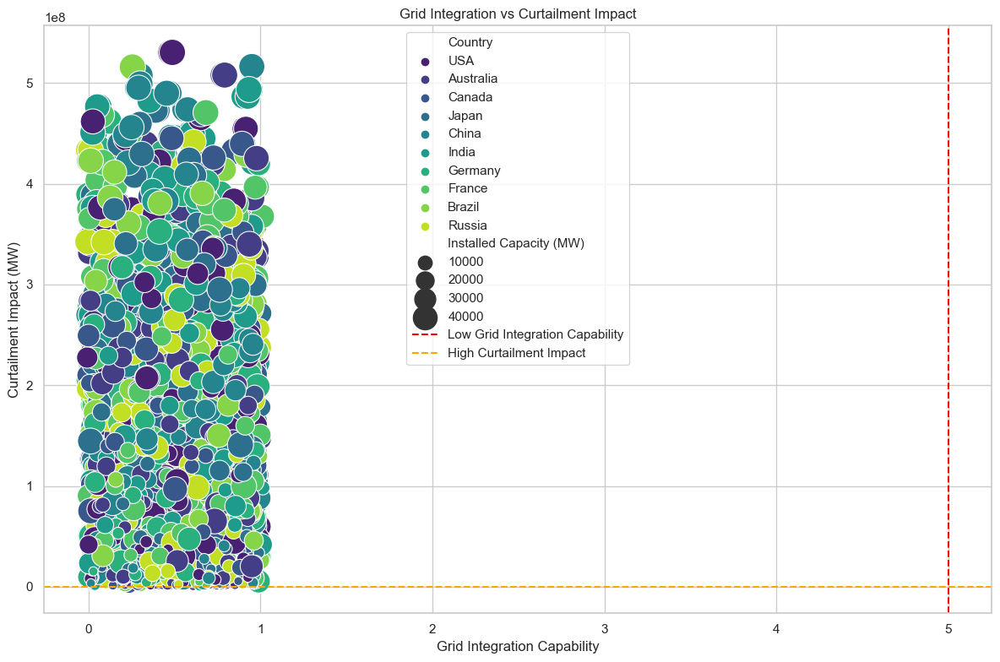


Problematic Regions:
       Country  Year Energy Type  Production (GWh)  Installed Capacity (MW)  \
0         USA  2011       Solar      85404.690030              5549.794323   
2      Canada  2013     Biomass      94102.732040              6139.117212   
13     Brazil  2004  Geothermal      92392.054330              1451.957737   
18     Canada  2013     Biomass      98397.814920             16191.486090   
33     Russia  2020       Hydro      54157.627070               412.701268   
...       ...   ...         ...               ...                      ...   
4977  Germany  2005       Solar      47168.333262              7705.699194   
4983   Russia  2012       Hydro      95252.250175             12308.388394   
4989   Russia  2013        Wind      99313.353827             16694.560580   
4991      USA  2020       Solar      43242.899691              2809.512590   
4998    China  2000     Biomass      66206.317421              3530.006152   

      Investments (USD)    Population   

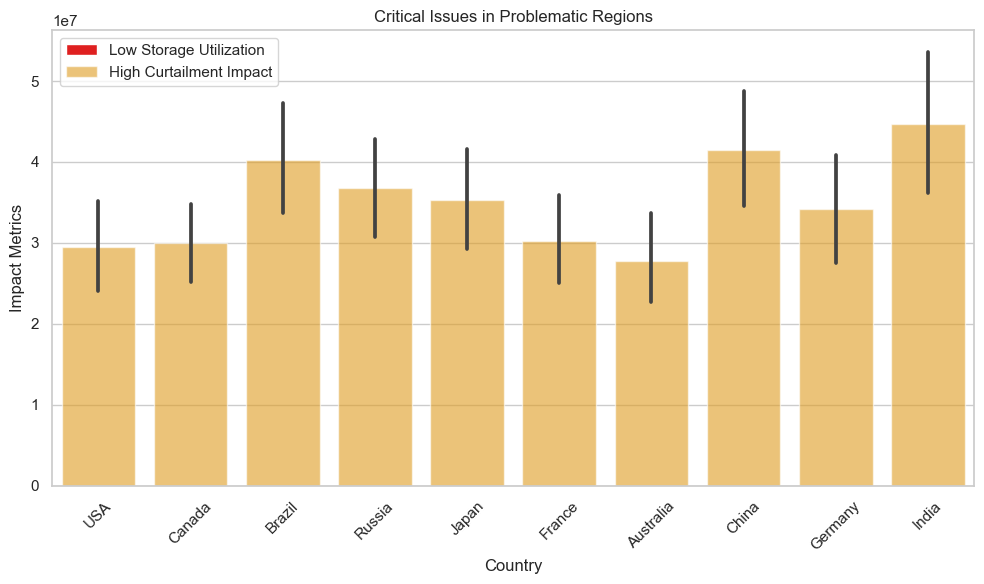


Policy Recommendations:
       Country                              Policy Recommendation
0         USA  1. Invest in energy storage technologies.\n2. ...
2      Canada  1. Invest in energy storage technologies.\n2. ...
13     Brazil  1. Invest in energy storage technologies.\n2. ...
18     Canada  1. Invest in energy storage technologies.\n2. ...
33     Russia  1. Invest in energy storage technologies.\n2. ...
...       ...                                                ...
4977  Germany  1. Invest in energy storage technologies.\n2. ...
4983   Russia  1. Invest in energy storage technologies.\n2. ...
4989   Russia  1. Invest in energy storage technologies.\n2. ...
4991      USA  1. Invest in energy storage technologies.\n2. ...
4998    China  1. Invest in energy storage technologies.\n2. ...

[996 rows x 2 columns]


In [73]:
import matplotlib.pyplot as plt
import seaborn as sns

# Scatter plot for Grid Integration Capability vs Curtailment Impact
plt.figure(figsize=(12, 8))
sns.scatterplot(
    data=df,
    x='Grid Integration Capability',
    y='Curtailment Impact',
    hue='Country',
    size='Installed Capacity (MW)',
    sizes=(50, 500),
    palette='viridis'
)
plt.axvline(5, color='red', linestyle='--', label='Low Grid Integration Capability')
plt.axhline(1000, color='orange', linestyle='--', label='High Curtailment Impact')
plt.title("Grid Integration vs Curtailment Impact")
plt.xlabel("Grid Integration Capability")
plt.ylabel("Curtailment Impact (MW)")
plt.legend()
plt.tight_layout()
plt.show()

# Filter problematic regions
problematic_regions = df[
    (df['Storage Utilization (%)'] < 20) &
    (df['Curtailment Impact'] > 1000) &
    (df['Grid Integration Capability'] < 5)
]
print("\nProblematic Regions:\n", problematic_regions)

# Bar plot for critical issues in problematic regions
plt.figure(figsize=(10, 6))
sns.barplot(data=problematic_regions, x='Country', y='Storage Utilization (%)', color='red', label='Low Storage Utilization')
sns.barplot(data=problematic_regions, x='Country', y='Curtailment Impact', color='orange', alpha=0.6, label='High Curtailment Impact')
plt.title("Critical Issues in Problematic Regions")
plt.ylabel("Impact Metrics")
plt.xlabel("Country")
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

# Generate policy recommendations
def recommend_policies(data):
    recommendations = data[['Country']].copy()
    recommendations['Policy Recommendation'] = (
        "1. Invest in energy storage technologies.\n"
        "2. Enhance grid connectivity with smart grids.\n"
        "3. Promote distributed renewable generation and storage."
    )
    return recommendations

policy_recommendations = recommend_policies(problematic_regions)
print("\nPolicy Recommendations:\n", policy_recommendations)



<h1>6.Develop Renewable Energy Jobs and Education:</h1>

The first graph is a scatter plot that visualizes the relationship between the number of renewable energy jobs and the educational level index across various countries. Each data point represents a country, with colors differentiated by country using a viridis palette. The size of the data points reflects the extent of renewable energy education programs, where larger circles indicate more robust programs. This visualization helps identify patterns, such as whether higher educational levels correlate with a greater number of renewable energy jobs. It also highlights outliers or clusters of countries, such as those with high education levels but few jobs, which may indicate inefficiencies or gaps in renewable energy job creation.

The second graph is a heatmap displaying the correlation matrix for three variables: renewable energy jobs, educational level, and renewable energy education programs. The heatmap uses color intensity to show the strength and direction of correlations, with red indicating a strong positive correlation and blue indicating a negative one. This graph helps identify relationships between the variables, such as whether an increase in educational level or renewable energy education programs is strongly linked to higher job creation. Weak or near-zero correlations suggest the variables are largely independent, indicating that other factors, such as government policies or infrastructure, may play a more significant role in driving renewable energy job growth. These graphs together provide valuable insights into the interplay of education, job creation, and program development in the renewable energy sector.


Summary Statistics:
        Renewable Energy Jobs  Educational Level  \
count            5000.000000        5000.000000   
mean           502896.083538           4.975431   
std            286720.301902           2.884707   
min              1319.995638          -0.007045   
25%            253688.753842           2.478486   
50%            497165.505248           4.983848   
75%            754547.000943           7.476015   
max            999562.000000          10.008116   

       Renewable Energy Education Programs  
count                          5000.000000  
mean                              0.506589  
std                               0.500034  
min                              -0.036179  
25%                               0.000000  
50%                               0.980259  
75%                               1.000000  
max                               1.028013  


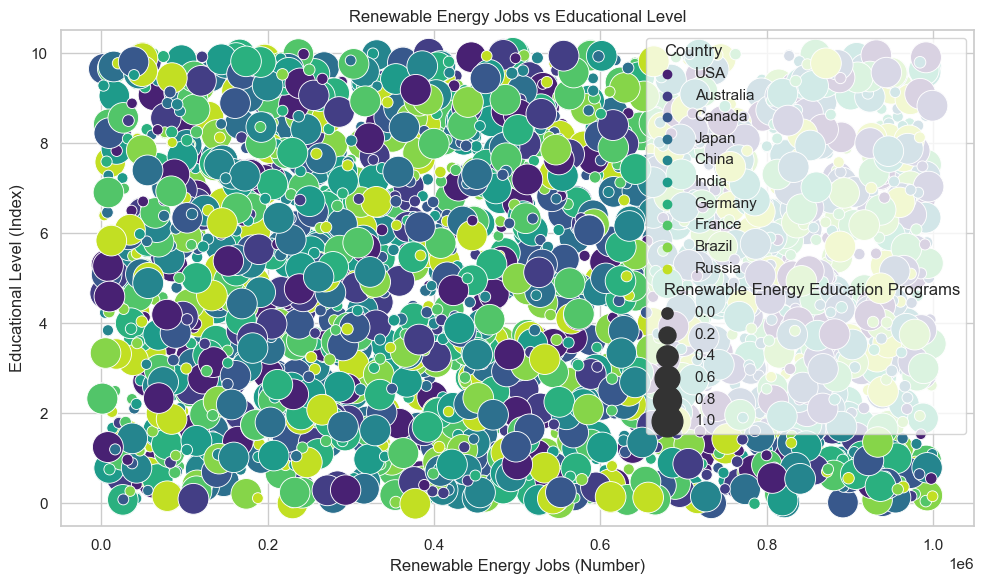


Correlation Matrix:
                                      Renewable Energy Jobs  Educational Level  \
Renewable Energy Jobs                             1.000000          -0.038253   
Educational Level                                -0.038253           1.000000   
Renewable Energy Education Programs              -0.005817          -0.020373   

                                     Renewable Energy Education Programs  
Renewable Energy Jobs                                          -0.005817  
Educational Level                                              -0.020373  
Renewable Energy Education Programs                             1.000000  


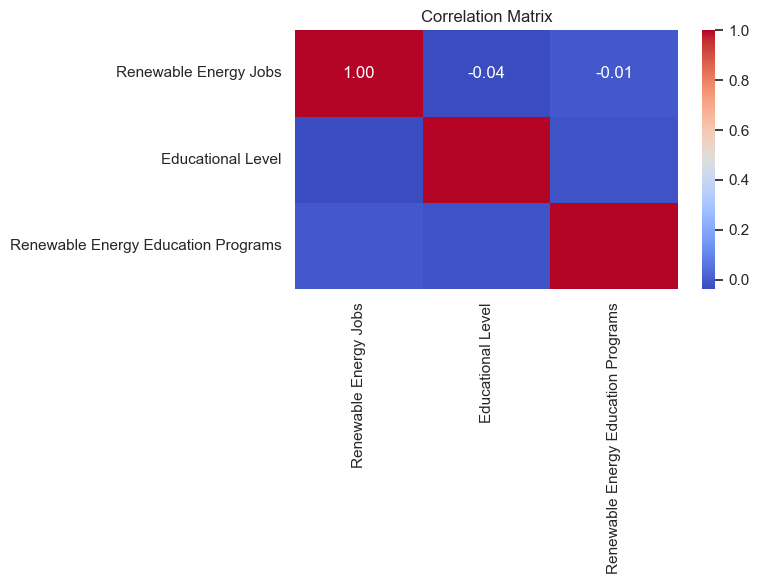


Underdeveloped Regions:
       Country  Renewable Energy Jobs  Educational Level  \
3       Japan           11049.000000           4.590746   
4       China          225191.000000           0.001750   
8       Japan          339831.000000           3.892325   
11     France          436217.000000           2.077438   
19     Canada          230374.000000           1.905470   
...       ...                    ...                ...   
4950  Germany          328050.004745           3.009797   
4963      USA          293856.990318           0.296319   
4967    Japan           16744.975550           1.199701   
4972   France          365925.990262           3.755260   
4977  Germany          212010.006843           2.639232   

      Renewable Energy Education Programs  
3                                0.000000  
4                                0.000000  
8                                0.000000  
11                               0.000000  
19                               0.000000  
.

In [74]:
import matplotlib.pyplot as plt
import seaborn as sns

# Summary statistics
summary_stats = df[['Renewable Energy Jobs', 'Educational Level', 'Renewable Energy Education Programs']].describe()
print("\nSummary Statistics:\n", summary_stats)

# Scatter plot: Renewable Energy Jobs vs Educational Level
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=df,
    x='Renewable Energy Jobs',
    y='Educational Level',
    hue='Country',
    palette='viridis',
    size='Renewable Energy Education Programs',
    sizes=(50, 500)
)
plt.title("Renewable Energy Jobs vs Educational Level")
plt.xlabel("Renewable Energy Jobs (Number)")
plt.ylabel("Educational Level (Index)")
plt.tight_layout()
plt.show()

# Correlation analysis
correlation_matrix = df[['Renewable Energy Jobs', 'Educational Level', 'Renewable Energy Education Programs']].corr()
print("\nCorrelation Matrix:\n", correlation_matrix)

# Heatmap of correlation matrix
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# Identify underdeveloped regions
underdeveloped_regions = df[
    (df['Renewable Energy Jobs'] < df['Renewable Energy Jobs'].median()) &
    (df['Educational Level'] < df['Educational Level'].median()) &
    (df['Renewable Energy Education Programs'] < df['Renewable Energy Education Programs'].median())
]
print("\nUnderdeveloped Regions:\n", underdeveloped_regions[['Country', 'Renewable Energy Jobs', 'Educational Level', 'Renewable Energy Education Programs']])

# Generate recommendations
def recommend_training(data):
    recommendations = data[['Country']].copy()
    recommendations['Policy Recommendation'] = (
        "1. Increase investment in renewable energy job creation.\n"
        "2. Expand educational programs focusing on renewable energy technologies.\n"
        "3. Establish public-private partnerships for workforce training.\n"
        "4. Collaborate with international renewable energy education programs."
    )
    return recommendations

training_recommendations = recommend_training(underdeveloped_regions)
print("\nTraining Recommendations:\n", training_recommendations)




<h1>Classification Problem :</h1>
<h2>Feature Engineering Model: “Predicting Future R&D Expenditure (2027-2032) Using Machine Learning Models: Polynomial Regression, Random Forest, and Gradient Boosting”</h2>

Here is a description of the graphs generated by the provided code:

1. **Confusion Matrix Heatmaps**:  
   Each model generates a confusion matrix, displayed as a heatmap. This plot visually represents the number of true positives, true negatives, false positives, and false negatives. The x-axis represents the predicted classes (Class 0 and Class 1), while the y-axis represents the actual classes. The diagonal values indicate correct predictions, while off-diagonal values represent misclassifications. The color intensity in the heatmap highlights the magnitude of the values, aiding quick interpretation.

2. **ROC (Receiver Operating Characteristic) Curve**:  
   For each model, the ROC curve plots the True Positive Rate (TPR) against the False Positive Rate (FPR) at various threshold values. It illustrates the model's ability to distinguish between the two classes across thresholds. The area under the curve (AUC) is displayed in the legend, providing a single metric to evaluate the model's performance—higher AUC values indicate better classification performance.

3. **Error Rate Curve**:  
   This curve visualizes the error rate for each model. The error rate is calculated as the proportion of incorrect predictions (1 - accuracy). It serves as a comparative metric to observe how well the models perform, with lower error rates signifying better classification accuracy. Each model's error rate is represented as a constant line across the graph.



In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelBinarizer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix,
    roc_curve,
    auc,
    precision_recall_curve,
)
from sklearn.preprocessing import PolynomialFeatures
import optuna
import numpy as np

# Feature Engineering: Adding transformations (e.g., log transformation for skewed features)
df['Log_GDP'] = np.log1p(df['GDP'])
df['Log_Population'] = np.log1p(df['Population'])

# Convert R&D Expenditure to a binary classification target (e.g., high vs low expenditure)
thresh = df['R&D Expenditure'].median()
df['High R&D Expenditure'] = (df['R&D Expenditure'] > thresh).astype(int)

# Prepare Data for Classification
features = ['Year', 'Log_Population', 'Log_GDP', 'Innovation Index', 'Urbanization Rate']
target = 'High R&D Expenditure'
categorical_features = ['Country']
numeric_features = [col for col in features if col not in categorical_features]

X = df[features + categorical_features]
y = df[target]

# Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Preprocessor
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features),
    ]
)

# Models: Gradient Boosting, Logistic Regression
def objective(trial):
    classifier_name = trial.suggest_categorical("classifier", ["GradientBoosting", "LogisticRegression"])
    
    if classifier_name == "GradientBoosting":
        params = {
            "classifier__n_estimators": trial.suggest_int("n_estimators", 100, 500, step=50),
            "classifier__max_depth": trial.suggest_int("max_depth", 3, 10),
            "classifier__learning_rate": trial.suggest_float("learning_rate", 0.01, 0.2),
        }
        classifier = GradientBoostingClassifier(random_state=42)
    elif classifier_name == "LogisticRegression":
        params = {
            "classifier__C": trial.suggest_float("C", 0.01, 10.0, log=True),
            "classifier__penalty": trial.suggest_categorical("penalty", ["l2"]),
        }
        classifier = LogisticRegression(max_iter=1000, random_state=42)

    pipeline = Pipeline(steps=[("preprocessor", preprocessor), ("classifier", classifier)])
    pipeline.set_params(**params)
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_test)
    return accuracy_score(y_test, y_pred)

study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=50)

# Best Model
best_params = study.best_params
classifier_name = best_params.pop("classifier")
if classifier_name == "GradientBoosting":
    final_model = GradientBoostingClassifier(random_state=42, **best_params)
elif classifier_name == "LogisticRegression":
    final_model = LogisticRegression(max_iter=1000, random_state=42, **best_params)

pipeline = Pipeline(steps=[("preprocessor", preprocessor), ("classifier", final_model)])
pipeline.fit(X_train, y_train)

# Predictions
y_pred = pipeline.predict(X_test)
y_pred_proba = pipeline.predict_proba(X_test)[:, 1]

# Metrics
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color="blue", label=f"ROC Curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], "r--")
plt.title("ROC Curve")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Precision-Recall Curve
precision, recall, thresholds = precision_recall_curve(y_test, y_pred_proba)
pr_auc = auc(recall, precision)

plt.figure(figsize=(8, 6))
plt.plot(recall, precision, color="green", label=f"PR Curve (AUC = {pr_auc:.2f})")
plt.title("Precision-Recall Curve")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Scatter Plot of Predictions
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred, alpha=0.6, label="Predictions")
plt.plot(
    [y_test.min(), y_test.max()],
    [y_test.min(), y_test.max()],
    "r--",
    label="Ideal Fit",
)
plt.title("Actual vs Predicted")
plt.xlabel("Actual R&D Expenditure (Binary)")
plt.ylabel("Predicted R&D Expenditure (Binary)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
When grouping wi

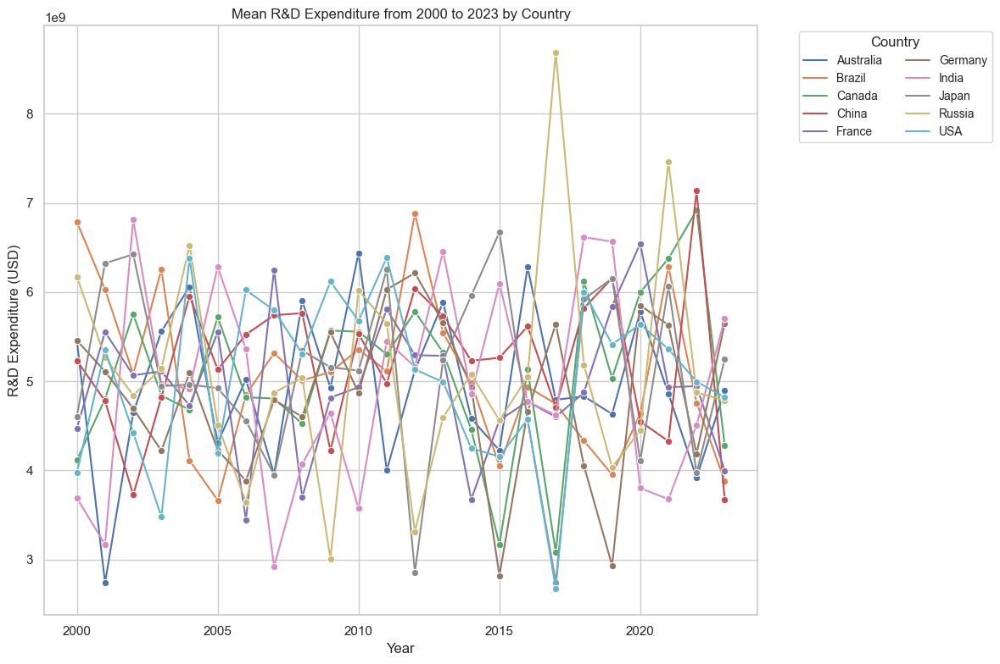


Model Performance:
                   Model  Train R^2  Test R^2      Test MSE
0  Polynomial Regression   0.084771 -0.027989  8.470727e+18
1          Random Forest   0.954278  0.672398  2.699473e+18
2      Gradient Boosting   0.536381  0.275602  5.969108e+18


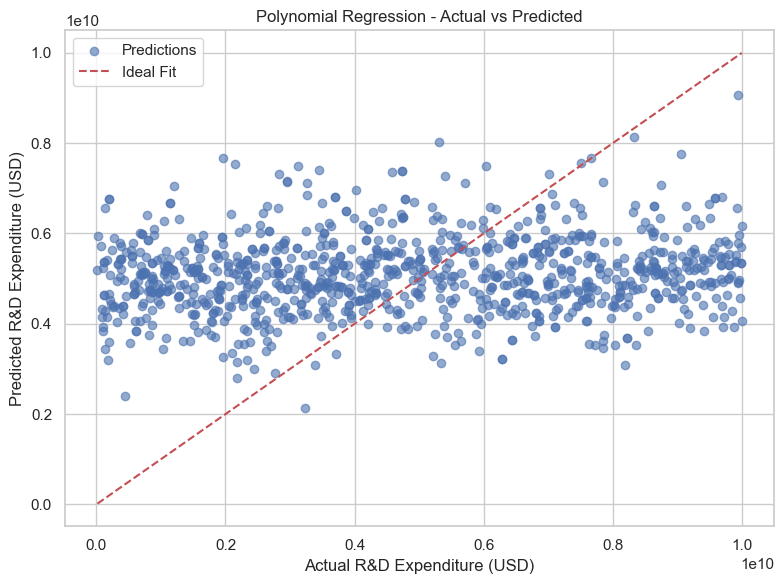

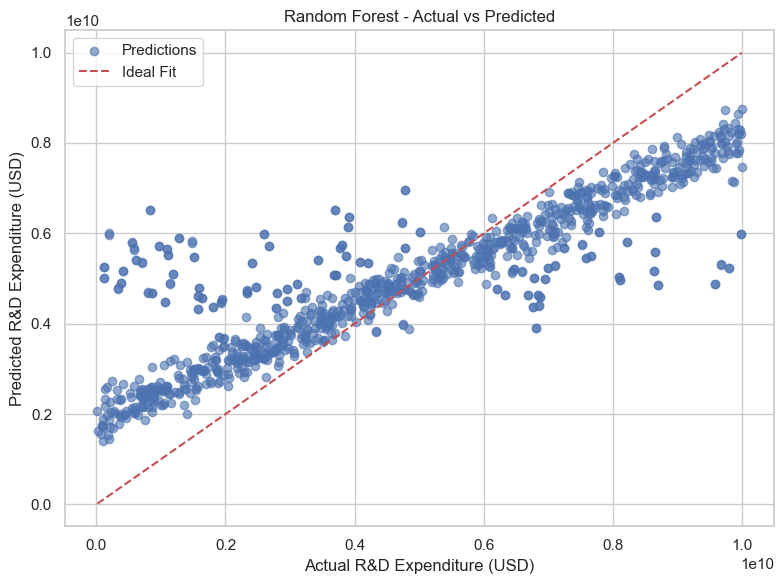

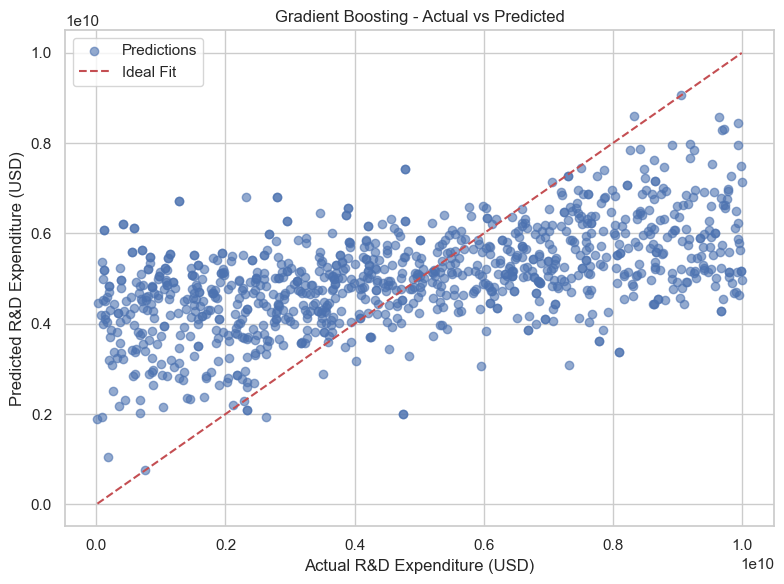

In [92]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_squared_error, r2_score

# Filter data for historical range and clean up
df_filtered = df[(df['Year'] >= 2000) & (df['Year'] <= 2023)].copy()
df_filtered['Year'] = df_filtered['Year'].astype(int)
df_filtered['R&D Expenditure'] = pd.to_numeric(df_filtered['R&D Expenditure'], errors='coerce')

# Historical Data Visualization (Mean R&D Expenditure by Country)
df_mean_rd = df_filtered.groupby(['Country', 'Year'])['R&D Expenditure'].mean().reset_index()

plt.figure(figsize=(12, 8))
sns.lineplot(data=df_mean_rd, x='Year', y='R&D Expenditure', hue='Country', marker='o')
plt.title('Mean R&D Expenditure from 2000 to 2023 by Country')
plt.xlabel('Year')
plt.ylabel('R&D Expenditure (USD)')
plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left', ncol=2, fontsize='small')
plt.grid(True)
plt.tight_layout()
plt.show()

# Prepare Data for Model Training
features = ['Year', 'Population', 'GDP', 'Innovation Index', 'Urbanization Rate']
target = 'R&D Expenditure'

categorical_features = ['Country']  # Only country as categorical feature
numeric_features = [col for col in features if col not in categorical_features]

X = df[features + categorical_features].copy()
y = df[target]

# Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Preprocessor
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features)
    ])

# Models: Polynomial Regression, Random Forest, Gradient Boosting
# Polynomial Regression Pipeline
poly_features = PolynomialFeatures(degree=3)
poly_model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('poly', poly_features),
    ('linear_model', LinearRegression())
])

# Random Forest Pipeline
random_forest_model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', RandomForestRegressor(n_estimators=500, random_state=42))
])

# Gradient Boosting Pipeline
gradient_boosting_model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', GradientBoostingRegressor(n_estimators=500, random_state=42))
])

# Fit the models
poly_model.fit(X_train, y_train)
random_forest_model.fit(X_train, y_train)
gradient_boosting_model.fit(X_train, y_train)

# Predictions
poly_pred_train = poly_model.predict(X_train)
poly_pred_test = poly_model.predict(X_test)

rf_pred_train = random_forest_model.predict(X_train)
rf_pred_test = random_forest_model.predict(X_test)

gb_pred_train = gradient_boosting_model.predict(X_train)
gb_pred_test = gradient_boosting_model.predict(X_test)

# Calculate R^2 and MSE for each model
results = []
models = {
    'Polynomial Regression': (poly_pred_train, poly_pred_test),
    'Random Forest': (rf_pred_train, rf_pred_test),
    'Gradient Boosting': (gb_pred_train, gb_pred_test)
}

for model_name, (train_pred, test_pred) in models.items():
    train_r2 = r2_score(y_train, train_pred)
    test_r2 = r2_score(y_test, test_pred)
    test_mse = mean_squared_error(y_test, test_pred)

    results.append({
        'Model': model_name,
        'Train R^2': train_r2,
        'Test R^2': test_r2,
        'Test MSE': test_mse
    })

results_df = pd.DataFrame(results)
print("\nModel Performance:")
print(results_df)

# Visualization for each model
for model_name, (_, test_pred) in models.items():
    plt.figure(figsize=(8, 6))
    plt.scatter(y_test, test_pred, alpha=0.6, label='Predictions')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', label='Ideal Fit')
    plt.title(f'{model_name} - Actual vs Predicted')
    plt.xlabel('Actual R&D Expenditure (USD)')
    plt.ylabel('Predicted R&D Expenditure (USD)')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()



Future R&D Expenditure Predictions:
    Year Country    Population           GDP  Innovation Index  \
0   2024     USA  1.417467e+08  1.111689e+14         43.432082   
1   2025     USA  1.744372e+08  1.018898e+14         37.283791   
2   2026     USA  2.071276e+08  9.261070e+13         31.135499   
3   2027     USA  2.398181e+08  8.333160e+13         24.987208   
4   2028     USA  2.725086e+08  7.405250e+13         18.838917   
..   ...     ...           ...           ...               ...   
65  2026  Russia  7.643513e+08  1.701076e+14         78.094104   
66  2027  Russia  5.885819e+08  1.812088e+14         72.997716   
67  2028  Russia  4.128125e+08  1.923100e+14         67.901328   
68  2029  Russia  2.370430e+08  2.034112e+14         62.804939   
69  2030  Russia  6.127361e+07  2.145124e+14         57.708551   

    Urbanization Rate  Predicted R&D Expenditure (USD)  
0           40.850027                     3.143161e+09  
1           39.114516                     3.453756e+09  

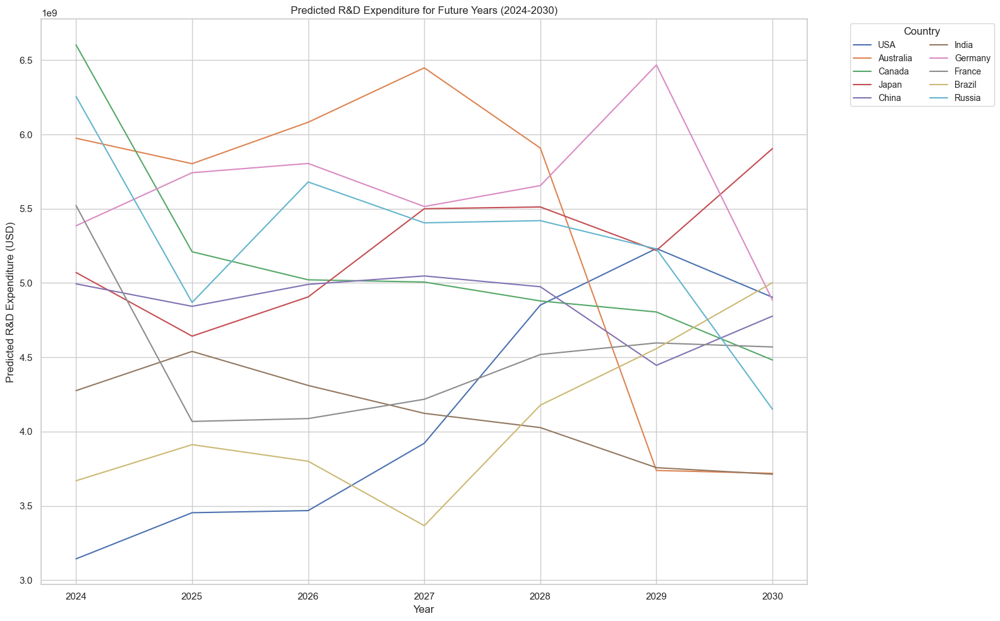

In [93]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Create a function to project future data based on the average annual growth rate
def project_future_data(df, feature, years_to_project=7):
    """
    Projects future values for a given feature using the average annual growth rate from historical data.
    """
    future_data = []
    for country in df['Country'].unique():
        # Get historical data for the country
        country_data = df[df['Country'] == country]
        latest_year = country_data['Year'].max()
        latest_value = country_data[country_data['Year'] == latest_year][feature].values[0]
        
        # Calculate the average annual growth rate
        growth_rate = (country_data[feature].iloc[-1] - country_data[feature].iloc[0]) / (country_data['Year'].iloc[-1] - country_data['Year'].iloc[0])
        
        # Project future years' values based on growth rate
        for year in range(latest_year + 1, latest_year + years_to_project + 1):
            projected_value = latest_value + growth_rate * (year - latest_year)
            future_data.append({'Year': year, 'Country': country, feature: projected_value})

    return pd.DataFrame(future_data)

# Project future data for each feature
future_population = project_future_data(df, 'Population')
future_gdp = project_future_data(df, 'GDP')
future_innovation_index = project_future_data(df, 'Innovation Index')
future_urbanization_rate = project_future_data(df, 'Urbanization Rate')

# Merge projected future data into a single DataFrame
future_mean_df = future_population[['Year', 'Country', 'Population']].merge(future_gdp[['Year', 'Country', 'GDP']], on=['Year', 'Country'])
future_mean_df = future_mean_df.merge(future_innovation_index[['Year', 'Country', 'Innovation Index']], on=['Year', 'Country'])
future_mean_df = future_mean_df.merge(future_urbanization_rate[['Year', 'Country', 'Urbanization Rate']], on=['Year', 'Country'])

# Prepare for prediction using the trained models
X_future = future_mean_df[features + categorical_features]

# Apply preprocessor and make predictions for future years
future_rf_pred = random_forest_model.predict(X_future)

# Add the predicted R&D Expenditure to the future_mean_df
future_mean_df['Predicted R&D Expenditure (USD)'] = future_rf_pred

# Print the future predictions
print("\nFuture R&D Expenditure Predictions:")
print(future_mean_df)

# Visualization for future predictions
plt.figure(figsize=(16, 10))
for country in future_mean_df['Country'].unique():
    country_data = future_mean_df[future_mean_df['Country'] == country]
    years = country_data['Year']
    predictions = country_data['Predicted R&D Expenditure (USD)']
    
    plt.plot(years, predictions, label=country)

plt.title('Predicted R&D Expenditure for Future Years (2024-2030)')
plt.xlabel('Year')
plt.ylabel('Predicted R&D Expenditure (USD)')
plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left', ncol=2, fontsize='small')
plt.grid(True)
plt.tight_layout()
plt.show()


Shap    

Running SHAP analysis for Random Forest...
Generating SHAP summary plot for Random Forest...


No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


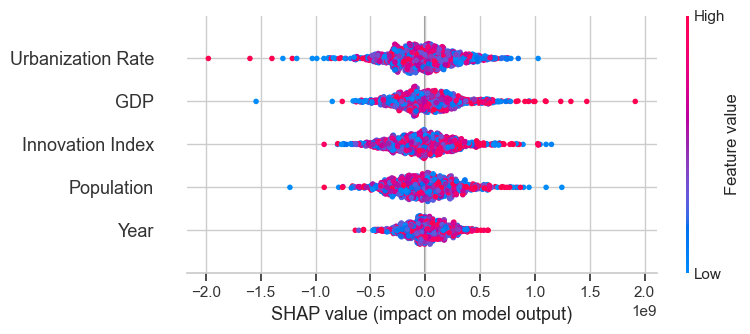

Generating SHAP force plot for Random Forest...


Running SHAP analysis for Gradient Boosting...
Generating SHAP summary plot for Gradient Boosting...


No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


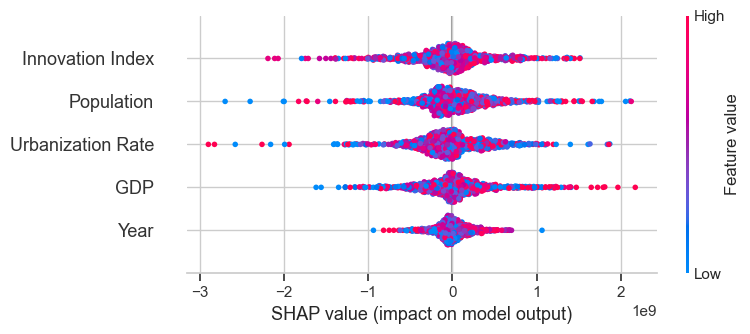

Generating SHAP force plot for Gradient Boosting...


In [77]:
import shap
import numpy as np

# Assuming your models and preprocessor are already trained
# Replace with the actual trained models and preprocessing pipeline
rf_model = random_forest_model.named_steps['model']  # Random Forest model
rf_preprocessor = random_forest_model.named_steps['preprocessor']  # Preprocessor for RF

gb_model = gradient_boosting_model.named_steps['model']  # Gradient Boosting model
gb_preprocessor = gradient_boosting_model.named_steps['preprocessor']  # Preprocessor for GB

# Transform the test data
X_test_transformed = rf_preprocessor.transform(X_test)

# Get feature names after preprocessing (including one-hot encoded ones)
onehot_columns = rf_preprocessor.named_transformers_['cat'].get_feature_names_out(categorical_features)
all_features = numeric_features + list(onehot_columns)

# Filter out the 'Country' and its associated one-hot encoded columns
country_columns = [col for col in all_features if 'Country' in col]

# Remove the columns that correspond to the country feature
X_test_transformed_filtered = np.delete(X_test_transformed, 
                                         [all_features.index(col) for col in country_columns], 
                                         axis=1)

# Update the feature names list without 'Country' or its one-hot encoded columns
all_features_filtered = [f for f in all_features if f not in country_columns]

# Define SHAP plots for a single model
def generate_shap_plots(model, model_name):
    print(f"Running SHAP analysis for {model_name}...")
    explainer = shap.TreeExplainer(model, feature_perturbation="interventional")
    shap_values = explainer.shap_values(X_test_transformed_filtered, check_additivity=False)

    # SHAP Summary Plot
    print(f"Generating SHAP summary plot for {model_name}...")
    shap.summary_plot(
        shap_values,
        X_test_transformed_filtered,
        feature_names=all_features_filtered,
        show=True
    )

    # SHAP Force Plot (for the first instance)
    print(f"Generating SHAP force plot for {model_name}...")
    shap.initjs()
    shap.force_plot(
        explainer.expected_value,
        shap_values[0],
        X_test_transformed_filtered[0],
        feature_names=all_features_filtered
    )

# Generate SHAP plots for both models
generate_shap_plots(rf_model, "Random Forest")
generate_shap_plots(gb_model, "Gradient Boosting")


SHAP WATERFALL

LIME

In [113]:
import lime.lime_tabular

# Step 1: Exclude columns that start with 'Country_' from the DataFrame (raw data)
columns_to_exclude = [col for col in X_train.columns if col.startswith('Country_')]

# Remove the excluded columns from the raw data
X_train_filtered = X_train.drop(columns=columns_to_exclude)
X_test_filtered = X_test.drop(columns=columns_to_exclude)

# Step 2: Transform the filtered data using the preprocessor
X_train_transformed = preprocessor.fit_transform(X_train_filtered)
X_test_transformed = preprocessor.transform(X_test_filtered)

# Step 3: Get the feature names after one-hot encoding
# Get numerical features and categorical features that remain after exclusion
numeric_feature_names = numeric_features
categorical_feature_names = preprocessor.transformers_[1][1].get_feature_names_out(categorical_features).tolist()

# Combine numerical and categorical feature names (exclude Country_ features from here)
feature_names = numeric_feature_names + categorical_feature_names

# === Prepare LIME Explainer ===
lime_explainer_rf = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_transformed,
    mode='regression',
    training_labels=y_train.values,
    feature_names=feature_names
)

lime_explainer_gb = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_transformed,
    mode='regression',
    training_labels=y_train.values,
    feature_names=feature_names
)

# Step 4: Choose a specific test instance to explain
instance_index = 5  # Example: Explain the 5th instance

# LIME explanation for Random Forest
lime_explanation_rf = lime_explainer_rf.explain_instance(
    data_row=X_test_transformed[instance_index],
    predict_fn=random_forest_model.named_steps['model'].predict
)

# LIME explanation for Gradient Boosting
lime_explanation_gb = lime_explainer_gb.explain_instance(
    data_row=X_test_transformed[instance_index],
    predict_fn=gradient_boosting_model.named_steps['model'].predict
)

# Display explanations in notebook
print("\nLIME Explanation for Random Forest:")
lime_explanation_rf.show_in_notebook()

print("\nLIME Explanation for Gradient Boosting:")
lime_explanation_gb.show_in_notebook()

# Step 5: Filter columns that start with 'Country_' (for display purposes)
filtered_columns = [col for col in df.columns if col.startswith('Country_')]

# Select only those columns from the DataFrame
filtered_df = df[filtered_columns]

# Display the filtered DataFrame
print("\nFiltered DataFrame (Columns starting with 'Country_'):")
print(filtered_df)



LIME Explanation for Random Forest:



LIME Explanation for Gradient Boosting:



Filtered DataFrame (Columns starting with 'Country_'):
Empty DataFrame
Columns: []
Index: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, ...]

[5000 rows x 0 columns]


LSTM FOR R&D EXPENDITURE

[I 2025-01-25 22:37:27,536] A new study created in memory with name: no-name-dce220a9-74a9-405c-a506-7181e2e0c376



Training for country: Australia


/var/folders/x1/372gwtfn29x0fxqytxw4dk1r0000gn/T/ipykernel_43892/3967365004.py:76: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/var/folders/x1/372gwtfn29x0fxqytxw4dk1r0000gn/T/ipykernel_43892/3967365004.py:77: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning:

dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.15036216644352607 and num_layers=1

[I 2025-01-25 22:37:28,853] Trial 0 finished with value: 1.1319510191679 and parameters: {'hidden_size': 41, 'num_layers': 1, 'dropout': 0.1503

Best parameters for Australia using optuna: {'hidden_size': 68, 'num_layers': 1, 'dropout': 0.3585542881392078, 'batch_size': 48, 'learning_rate': 0.003932937984310083, 'weight_decay': 1.0723993097748673e-06}


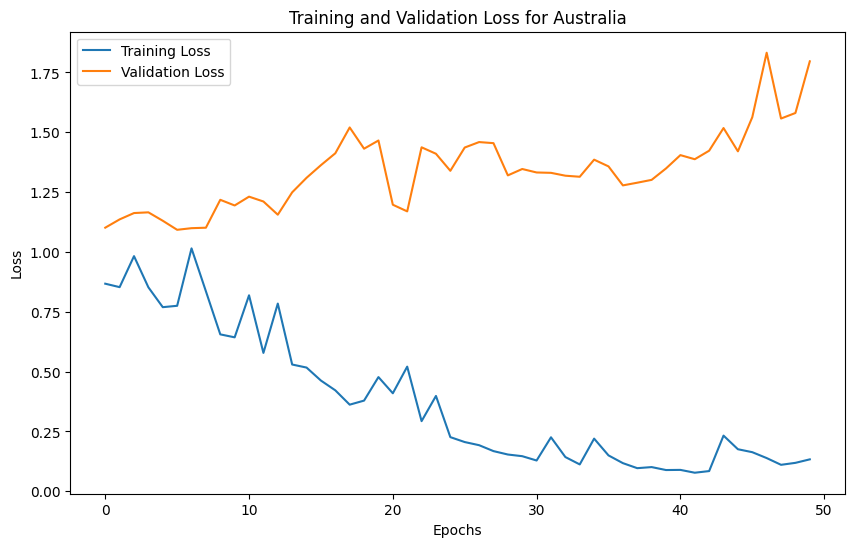


Performance for Australia:
Training MSE: 1190316857140183040.00, Test MSE: 12912611780043210752.00
Training R²: 0.8552, Test R²: -0.3879


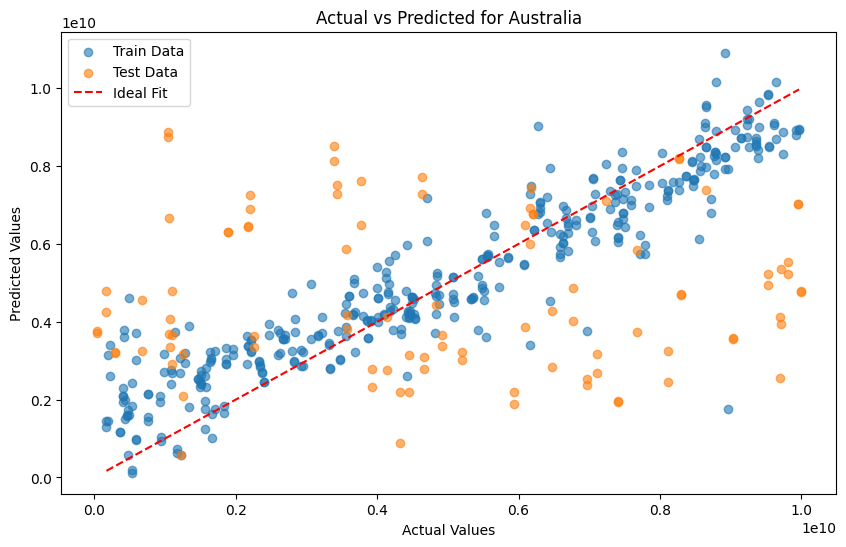

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead 

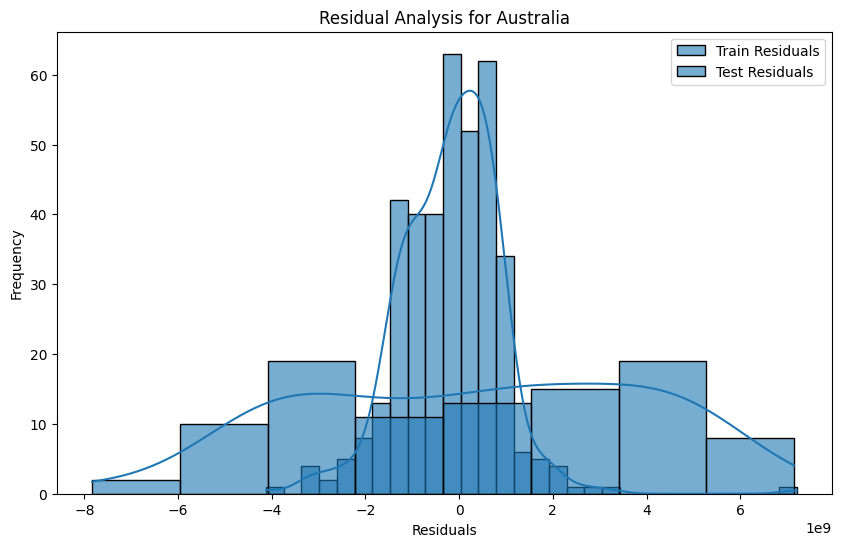

[I 2025-01-25 22:39:26,087] A new study created in memory with name: no-name-7d93c38d-5e5f-411f-92ac-2dec19b89822
/var/folders/x1/372gwtfn29x0fxqytxw4dk1r0000gn/T/ipykernel_43892/3967365004.py:76: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/var/folders/x1/372gwtfn29x0fxqytxw4dk1r0000gn/T/ipykernel_43892/3967365004.py:77: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.




Training for country: Brazil


[I 2025-01-25 22:39:27,366] Trial 0 finished with value: 0.9716934859752655 and parameters: {'hidden_size': 47, 'num_layers': 2, 'dropout': 0.15716982820211722, 'batch_size': 59, 'learning_rate': 0.000120722983244724, 'weight_decay': 1.0548477298186009e-06}. Best is trial 0 with value: 0.9716934859752655.
[I 2025-01-25 22:39:31,735] Trial 1 finished with value: 1.1175974557797115 and parameters: {'hidden_size': 78, 'num_layers': 2, 'dropout': 0.24528210351438007, 'batch_size': 16, 'learning_rate': 0.00571109092575691, 'weight_decay': 3.2807670195139147e-06}. Best is trial 0 with value: 0.9716934859752655.
/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning:

dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.22388043942800828 and num_layers=1

[I 2025-01-25 22:39:34,448] Trial 2 finished with value: 0.9285174086689949 and parameters: {'hidden_size': 33

Best parameters for Brazil using optuna: {'hidden_size': 17, 'num_layers': 1, 'dropout': 0.49933079739328917, 'batch_size': 8, 'learning_rate': 0.0005718864552152811, 'weight_decay': 1.7320075449680828e-06}


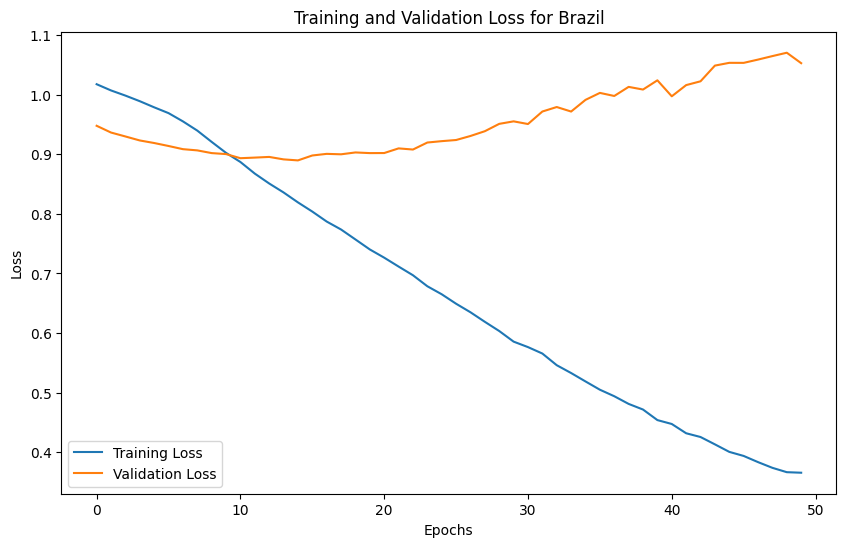


Performance for Brazil:
Training MSE: 3010288289379778560.00, Test MSE: 8663918530409791488.00
Training R²: 0.6380, Test R²: -0.1275


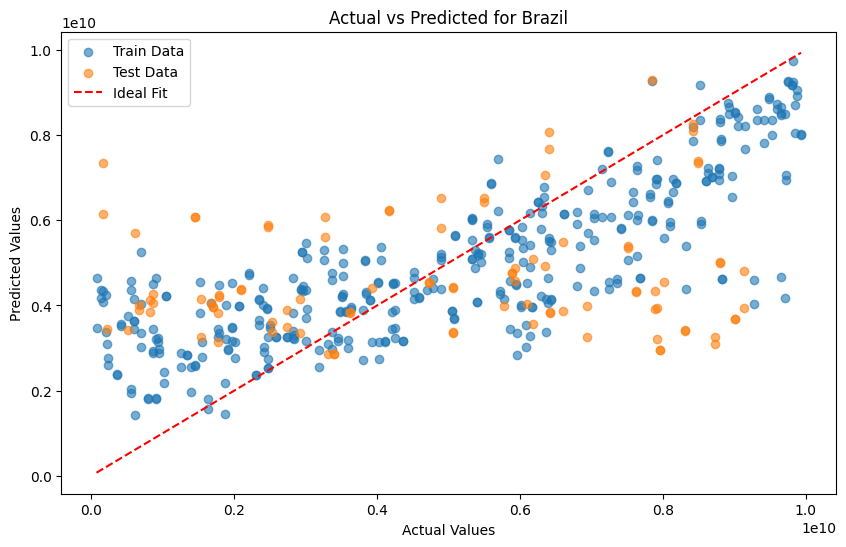

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead 

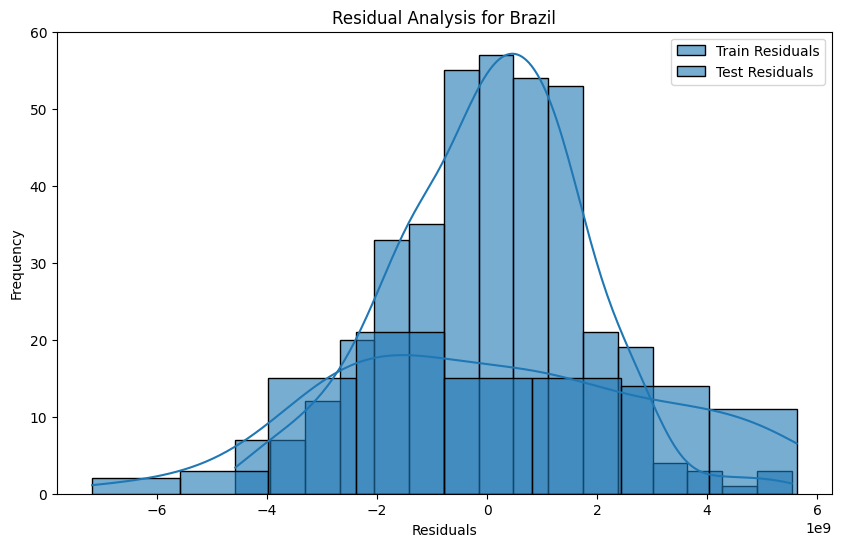

[I 2025-01-25 22:41:13,911] A new study created in memory with name: no-name-ba74c694-64b8-41f2-a5d9-94becdc05bfc
/var/folders/x1/372gwtfn29x0fxqytxw4dk1r0000gn/T/ipykernel_43892/3967365004.py:76: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/var/folders/x1/372gwtfn29x0fxqytxw4dk1r0000gn/T/ipykernel_43892/3967365004.py:77: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning:

dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.495523764892911 and num_layers=1




Training for country: Canada


[I 2025-01-25 22:41:14,457] Trial 0 finished with value: 1.2110921740531921 and parameters: {'hidden_size': 34, 'num_layers': 1, 'dropout': 0.495523764892911, 'batch_size': 59, 'learning_rate': 6.461373637788494e-05, 'weight_decay': 2.0180107848858208e-05}. Best is trial 0 with value: 1.2110921740531921.
[I 2025-01-25 22:41:15,402] Trial 1 finished with value: 1.1495994329452515 and parameters: {'hidden_size': 19, 'num_layers': 3, 'dropout': 0.2535759089865604, 'batch_size': 45, 'learning_rate': 0.0031107122966021693, 'weight_decay': 1.922073359524743e-06}. Best is trial 1 with value: 1.1495994329452515.
[I 2025-01-25 22:41:16,289] Trial 2 finished with value: 1.1709539890289307 and parameters: {'hidden_size': 21, 'num_layers': 3, 'dropout': 0.4502459810288656, 'batch_size': 63, 'learning_rate': 0.00037007809046079215, 'weight_decay': 3.230370543691972e-05}. Best is trial 1 with value: 1.1495994329452515.
[I 2025-01-25 22:41:21,297] Trial 3 finished with value: 1.2289213405715094 and p

Best parameters for Canada using optuna: {'hidden_size': 58, 'num_layers': 2, 'dropout': 0.35944382079715326, 'batch_size': 45, 'learning_rate': 5.32432507518146e-05, 'weight_decay': 2.4547666087220395e-06}


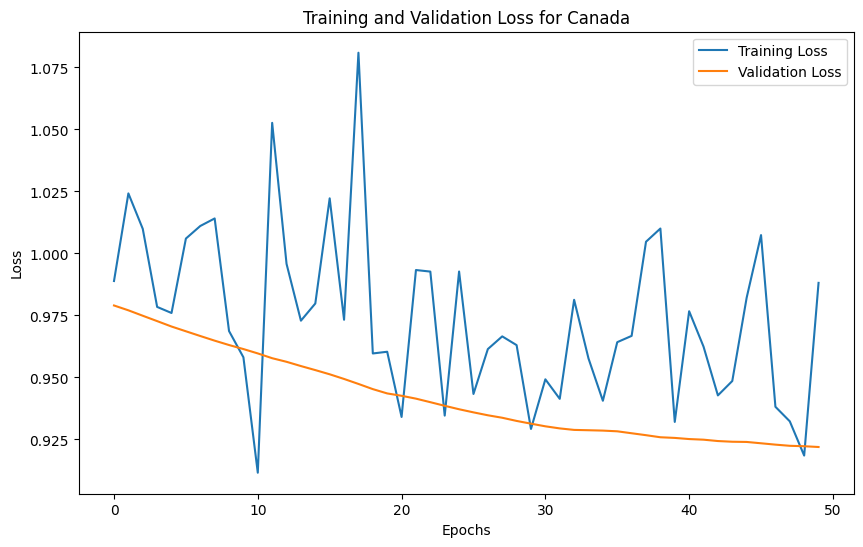


Performance for Canada:
Training MSE: 7827904864230309888.00, Test MSE: 9831960518921814016.00
Training R²: 0.0019, Test R²: -0.0876


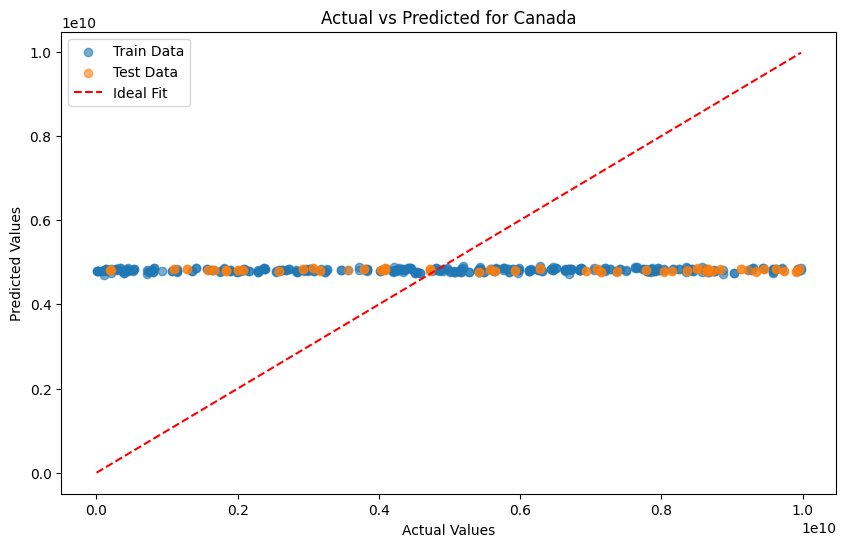

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead 

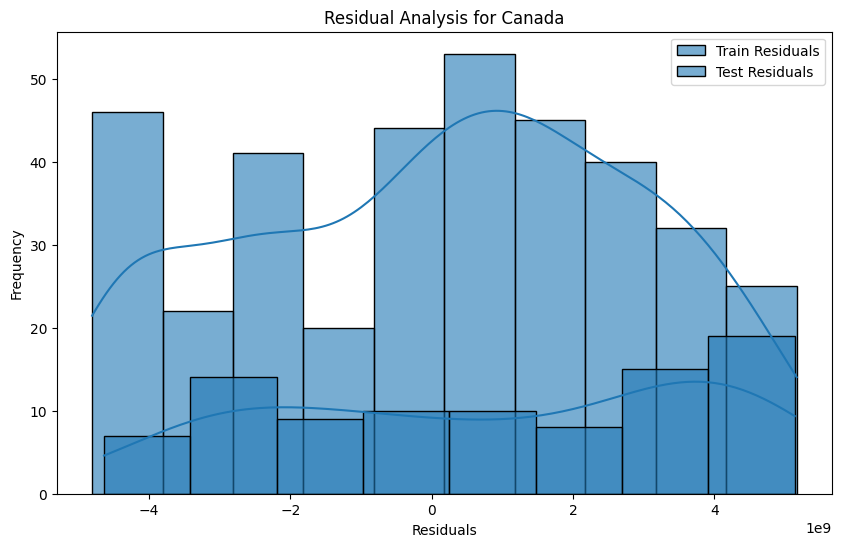

[I 2025-01-25 22:43:02,579] A new study created in memory with name: no-name-5fa0fa37-17a7-43cd-b1ec-61e4af8fe341



Training for country: China


/var/folders/x1/372gwtfn29x0fxqytxw4dk1r0000gn/T/ipykernel_43892/3967365004.py:76: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/var/folders/x1/372gwtfn29x0fxqytxw4dk1r0000gn/T/ipykernel_43892/3967365004.py:77: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2025-01-25 22:43:07,649] Trial 0 finished with value: 1.1577715575695038 and parameters: {'hidden_size': 59, 'num_layers': 2, 'dropout': 0.1448978421270538, 'batch_size': 28, 'learning_rate': 0.008854266584804824, 'weight_decay': 1.3581827271009584e-06}. Best is trial 0 with value: 1.1577715575695038.
[I 2025-01-25 22:43:16,127] Trial 1 finished with value: 1.1086174845695496 and parameters: {'hidden_size': 99, 'n

Best parameters for China using optuna: {'hidden_size': 121, 'num_layers': 2, 'dropout': 0.19560966161029844, 'batch_size': 26, 'learning_rate': 0.0002052212845277938, 'weight_decay': 3.2855636248256874e-06}


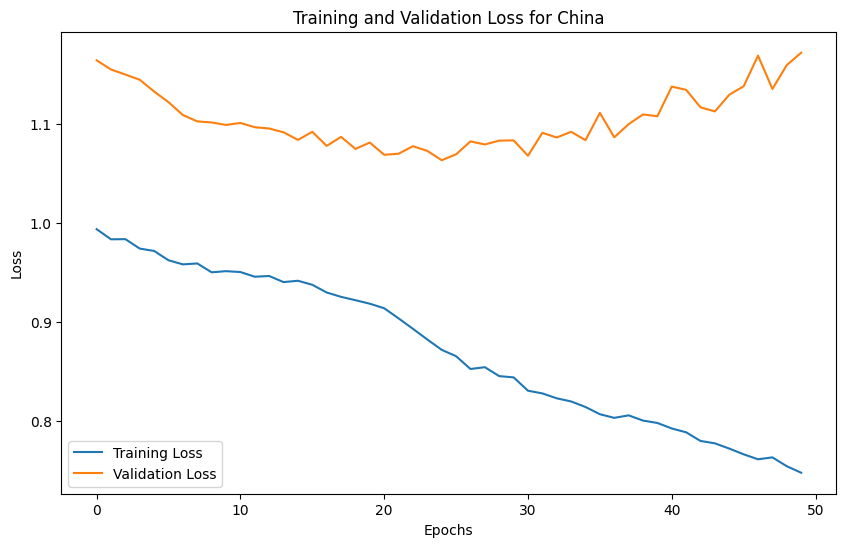


Performance for China:
Training MSE: 5505665387867406336.00, Test MSE: 8630153627832418304.00
Training R²: 0.2235, Test R²: -0.0529


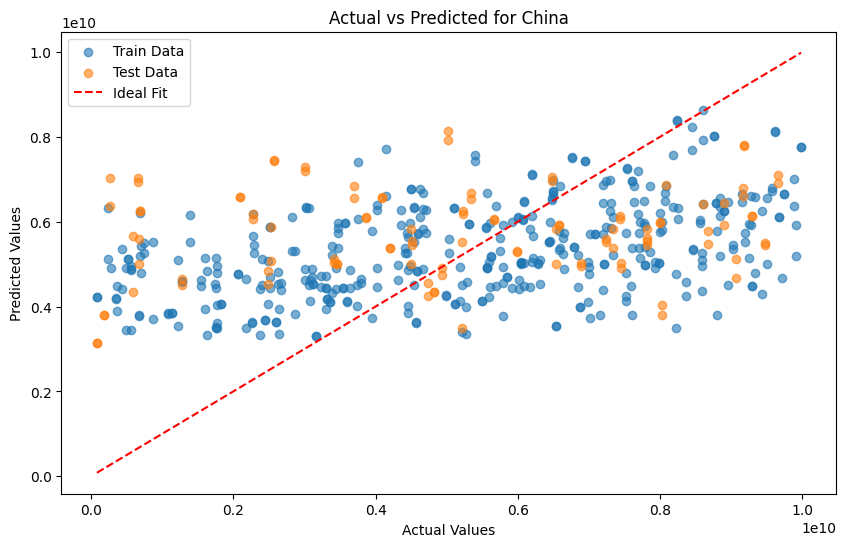

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead 

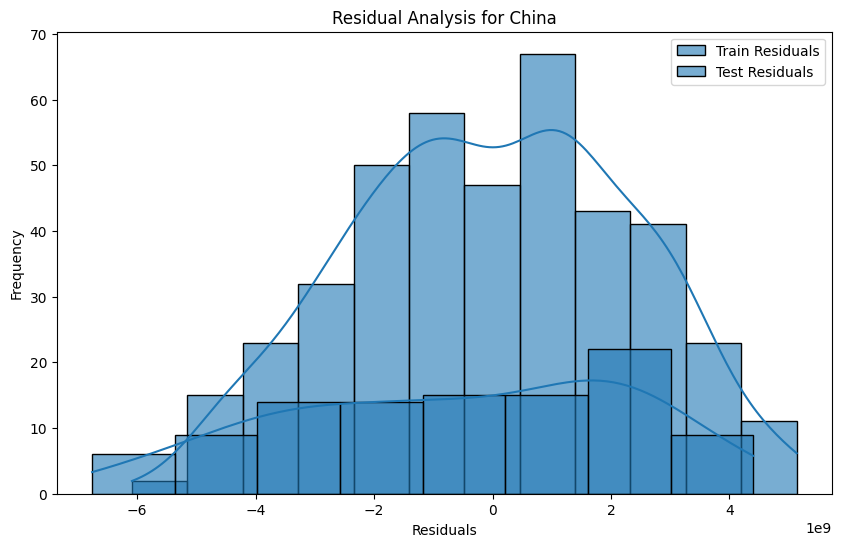

[I 2025-01-25 22:47:09,957] A new study created in memory with name: no-name-e3cefc57-020a-4895-bafa-f9470fa894cd
/var/folders/x1/372gwtfn29x0fxqytxw4dk1r0000gn/T/ipykernel_43892/3967365004.py:76: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/var/folders/x1/372gwtfn29x0fxqytxw4dk1r0000gn/T/ipykernel_43892/3967365004.py:77: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.




Training for country: France


[I 2025-01-25 22:47:18,196] Trial 0 finished with value: 1.3180555899937947 and parameters: {'hidden_size': 60, 'num_layers': 3, 'dropout': 0.4647756884928499, 'batch_size': 8, 'learning_rate': 0.0013513625292061167, 'weight_decay': 7.261117290614234e-05}. Best is trial 0 with value: 1.3180555899937947.
/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning:

dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.24468279914515695 and num_layers=1

[I 2025-01-25 22:47:21,726] Trial 1 finished with value: 1.1358842386139765 and parameters: {'hidden_size': 121, 'num_layers': 1, 'dropout': 0.24468279914515695, 'batch_size': 14, 'learning_rate': 0.00013876640031381193, 'weight_decay': 4.24556283498759e-06}. Best is trial 1 with value: 1.1358842386139765.
[I 2025-01-25 22:47:24,710] Trial 2 finished with value: 1.1529424041509628 and parameters: {'hidden_size': 69

Best parameters for France using optuna: {'hidden_size': 72, 'num_layers': 2, 'dropout': 0.39822109189783783, 'batch_size': 58, 'learning_rate': 1.0687329233361347e-05, 'weight_decay': 2.595062540563643e-05}


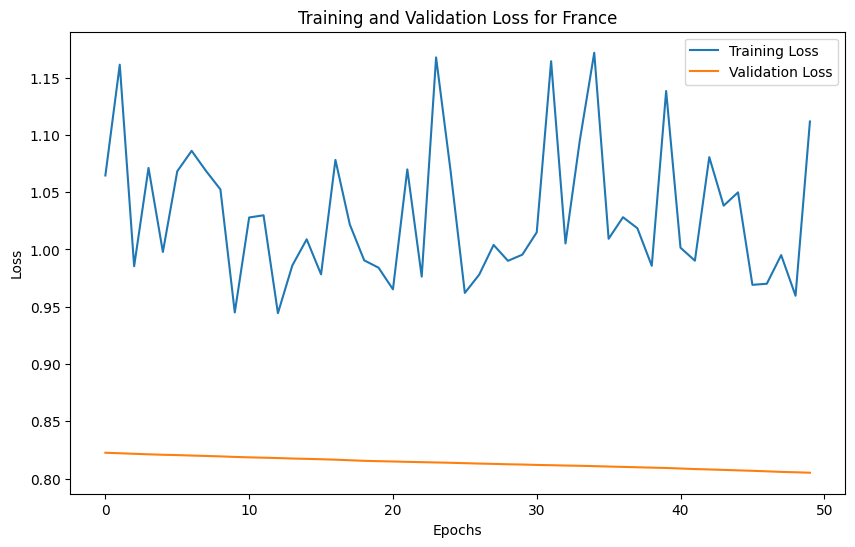


Performance for France:
Training MSE: 7975848002038267904.00, Test MSE: 8678518945315028992.00
Training R²: -0.0294, Test R²: -0.0607


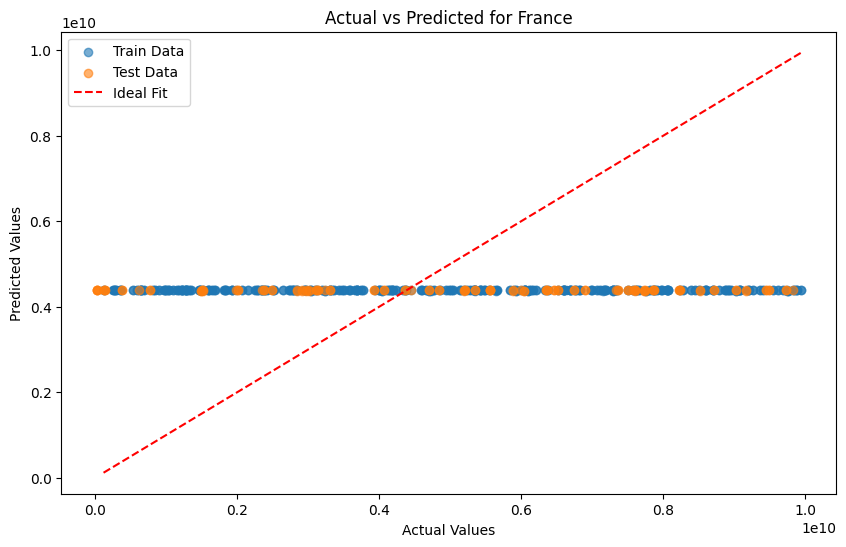

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead 

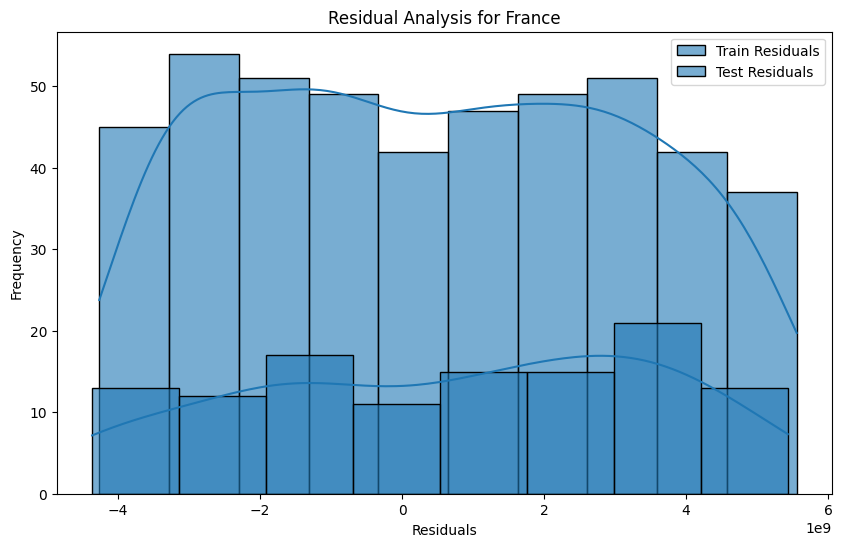

[I 2025-01-25 23:01:31,491] A new study created in memory with name: no-name-28b3080f-8c35-4fc0-a243-40ce7cce5089
/var/folders/x1/372gwtfn29x0fxqytxw4dk1r0000gn/T/ipykernel_43892/3967365004.py:76: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/var/folders/x1/372gwtfn29x0fxqytxw4dk1r0000gn/T/ipykernel_43892/3967365004.py:77: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.




Training for country: Germany


[I 2025-01-25 23:01:32,380] Trial 0 finished with value: 0.7424820959568024 and parameters: {'hidden_size': 23, 'num_layers': 3, 'dropout': 0.2461081173828651, 'batch_size': 61, 'learning_rate': 0.003583553303025462, 'weight_decay': 3.296609971822187e-05}. Best is trial 0 with value: 0.7424820959568024.
/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning:

dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4348737998704517 and num_layers=1

[I 2025-01-25 23:01:32,838] Trial 1 finished with value: 0.74311363697052 and parameters: {'hidden_size': 64, 'num_layers': 1, 'dropout': 0.4348737998704517, 'batch_size': 62, 'learning_rate': 0.0018075440913583878, 'weight_decay': 1.14131803946976e-05}. Best is trial 0 with value: 0.7424820959568024.
/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning:

dropout opti

Best parameters for Germany using optuna: {'hidden_size': 23, 'num_layers': 3, 'dropout': 0.2461081173828651, 'batch_size': 61, 'learning_rate': 0.003583553303025462, 'weight_decay': 3.296609971822187e-05}


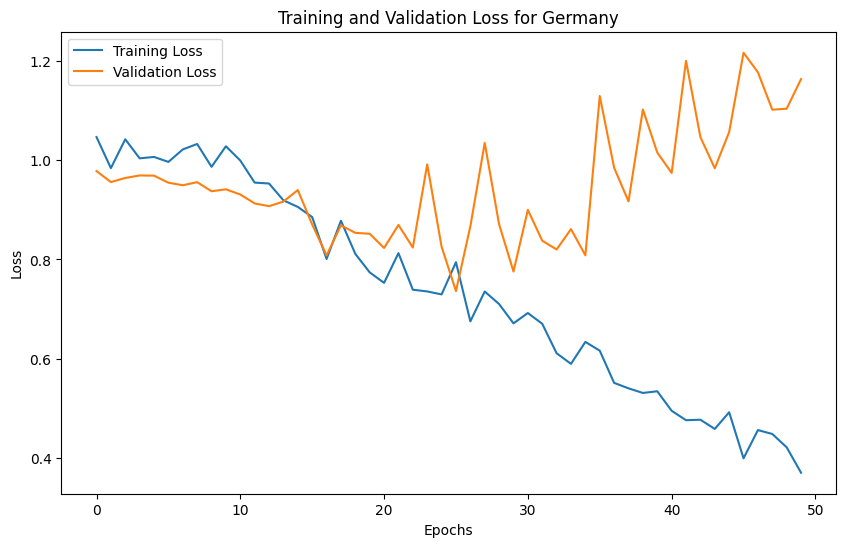


Performance for Germany:
Training MSE: 3253229781583396864.00, Test MSE: 9469419649406861312.00
Training R²: 0.6222, Test R²: -0.1869


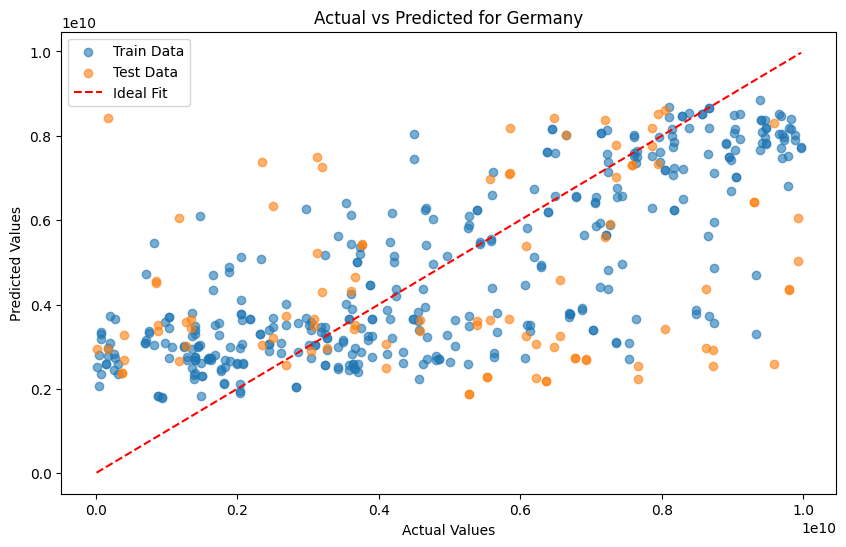

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead 

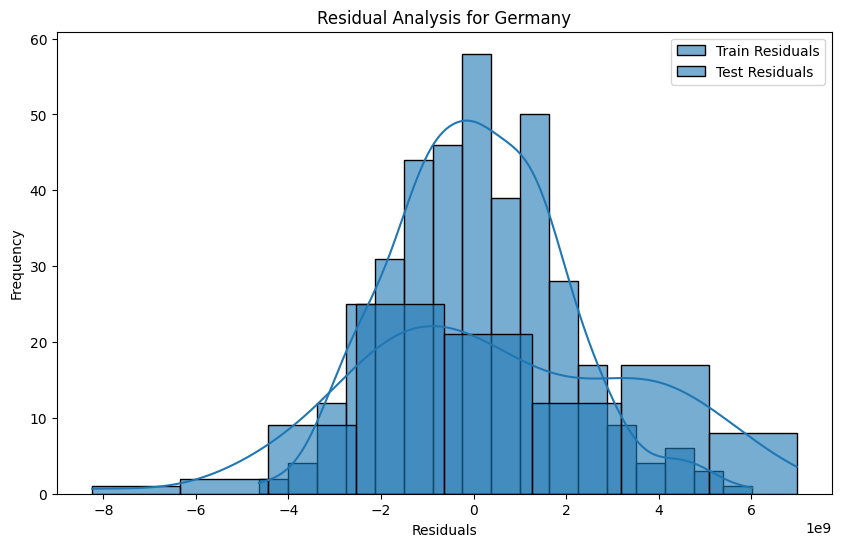

[I 2025-01-25 23:02:34,759] A new study created in memory with name: no-name-6eb023f8-278e-4952-853a-94bff3142a30
/var/folders/x1/372gwtfn29x0fxqytxw4dk1r0000gn/T/ipykernel_43892/3967365004.py:76: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/var/folders/x1/372gwtfn29x0fxqytxw4dk1r0000gn/T/ipykernel_43892/3967365004.py:77: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.




Training for country: India


[I 2025-01-25 23:02:36,064] Trial 0 finished with value: 0.8639584183692932 and parameters: {'hidden_size': 42, 'num_layers': 2, 'dropout': 0.38562737798897345, 'batch_size': 36, 'learning_rate': 0.00043938643753688357, 'weight_decay': 6.861015441242157e-06}. Best is trial 0 with value: 0.8639584183692932.
[I 2025-01-25 23:02:39,593] Trial 1 finished with value: 1.335653156042099 and parameters: {'hidden_size': 109, 'num_layers': 2, 'dropout': 0.4684938133419054, 'batch_size': 26, 'learning_rate': 0.005205947451221591, 'weight_decay': 2.105512281680428e-06}. Best is trial 0 with value: 0.8639584183692932.
/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning:

dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4233127853956789 and num_layers=1

[I 2025-01-25 23:02:40,814] Trial 2 finished with value: 1.047325611114502 and parameters: {'hidden_size': 59, 

Best parameters for India using optuna: {'hidden_size': 118, 'num_layers': 3, 'dropout': 0.3143170682288079, 'batch_size': 48, 'learning_rate': 0.0001107610737281842, 'weight_decay': 1.717599358745887e-05}


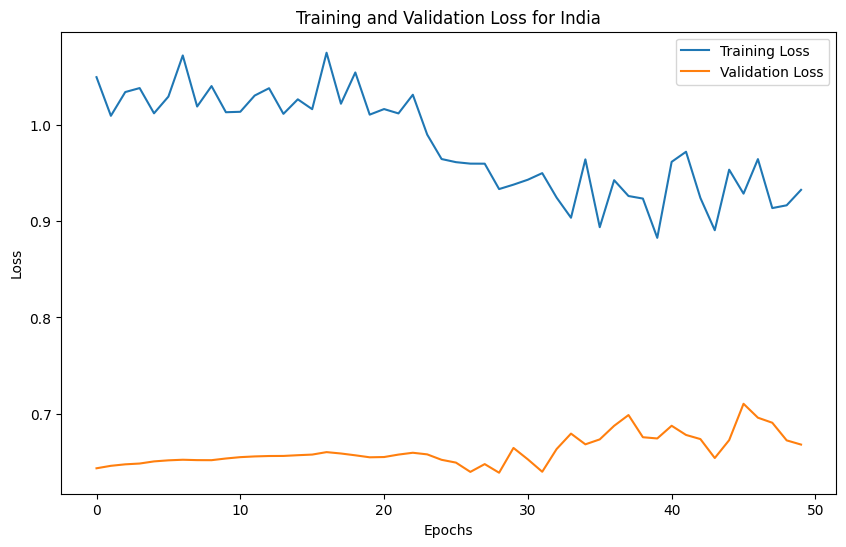


Performance for India:
Training MSE: 7933686678915383296.00, Test MSE: 8069866691573579776.00
Training R²: 0.1082, Test R²: -0.0590


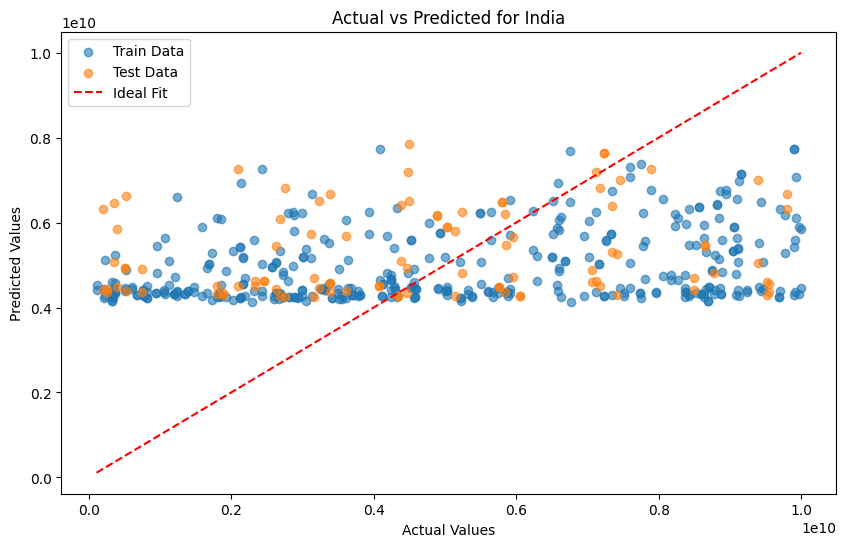

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead 

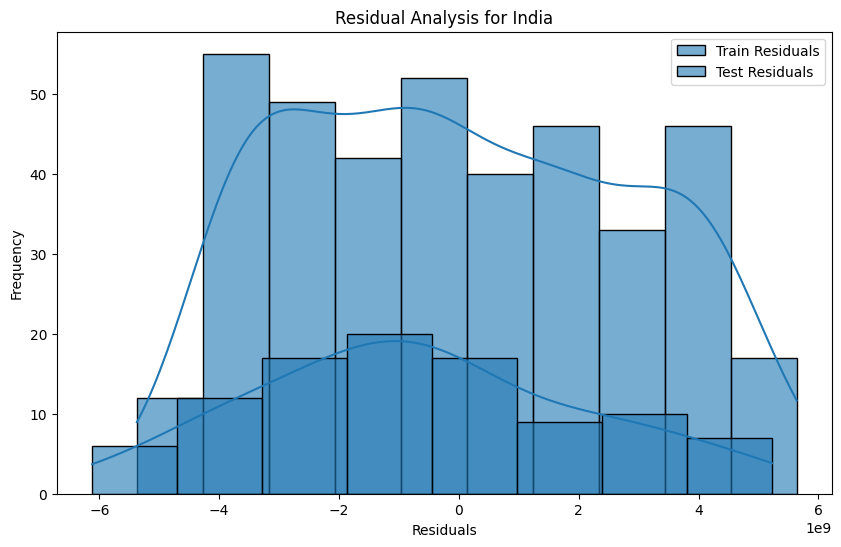

[I 2025-01-25 23:05:03,043] A new study created in memory with name: no-name-207b3566-39aa-49d0-a207-20cf9aa26c42



Training for country: Japan


/var/folders/x1/372gwtfn29x0fxqytxw4dk1r0000gn/T/ipykernel_43892/3967365004.py:76: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/var/folders/x1/372gwtfn29x0fxqytxw4dk1r0000gn/T/ipykernel_43892/3967365004.py:77: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2025-01-25 23:05:07,771] Trial 0 finished with value: 0.8425115346908569 and parameters: {'hidden_size': 106, 'num_layers': 3, 'dropout': 0.08074964182338096, 'batch_size': 52, 'learning_rate': 0.00045464393909934654, 'weight_decay': 2.5647333242682002e-06}. Best is trial 0 with value: 0.8425115346908569.
/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning:

dropou

Best parameters for Japan using optuna: {'hidden_size': 120, 'num_layers': 2, 'dropout': 0.34774085788138986, 'batch_size': 44, 'learning_rate': 0.0001340276120472239, 'weight_decay': 4.4044180057074353e-05}


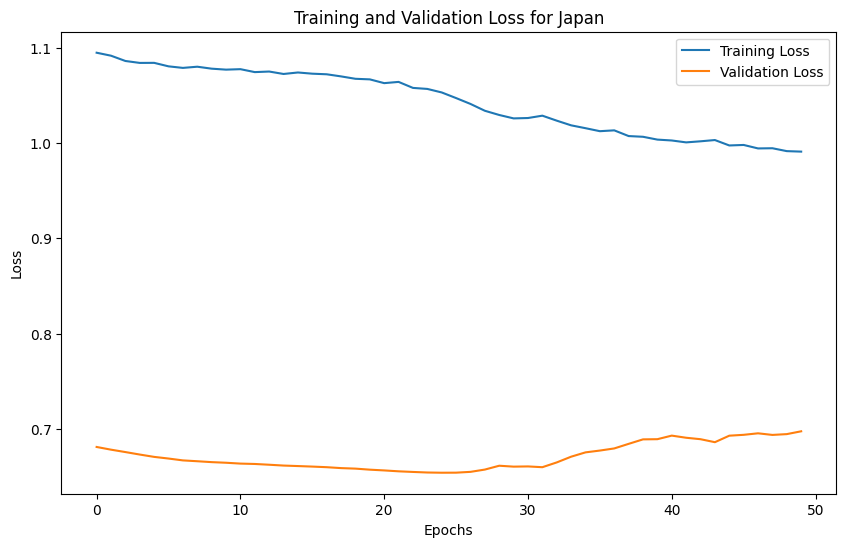


Performance for Japan:
Training MSE: 8668640932851089408.00, Test MSE: 6656437896997765120.00
Training R²: 0.0740, Test R²: -0.0585


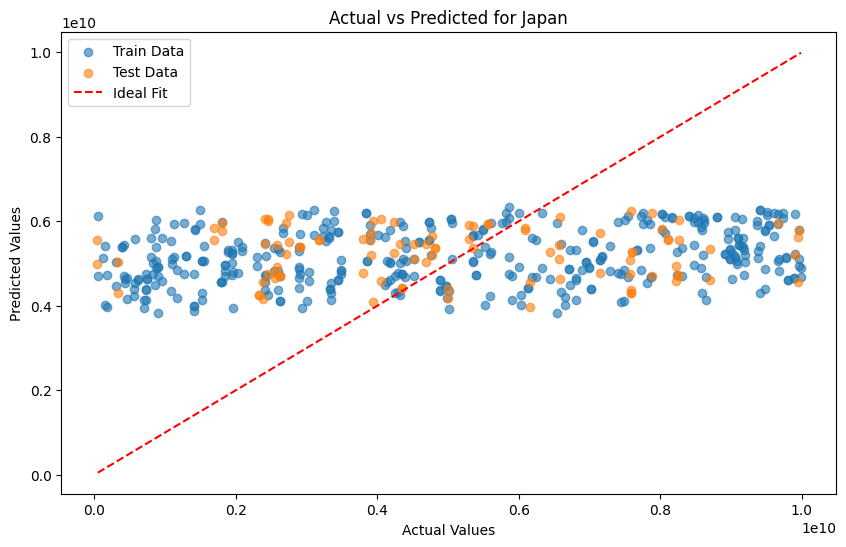

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead 

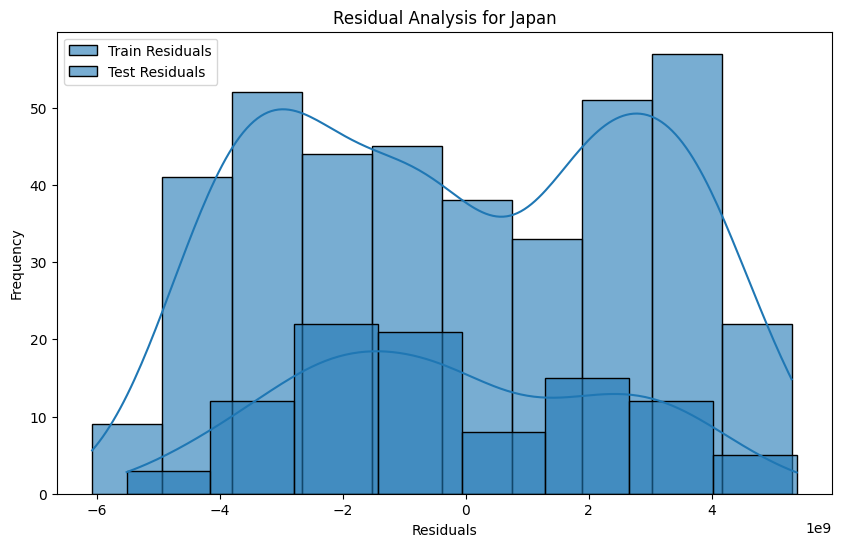

[I 2025-01-25 23:07:53,982] A new study created in memory with name: no-name-0fbd1ae7-3974-4c4b-a89c-a52af60b7b58



Training for country: Russia


/var/folders/x1/372gwtfn29x0fxqytxw4dk1r0000gn/T/ipykernel_43892/3967365004.py:76: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/var/folders/x1/372gwtfn29x0fxqytxw4dk1r0000gn/T/ipykernel_43892/3967365004.py:77: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2025-01-25 23:07:59,457] Trial 0 finished with value: 0.9979602893193563 and parameters: {'hidden_size': 64, 'num_layers': 2, 'dropout': 0.37623287625788826, 'batch_size': 18, 'learning_rate': 0.00035049350319697384, 'weight_decay': 5.234041328424056e-05}. Best is trial 0 with value: 0.9979602893193563.
[I 2025-01-25 23:08:01,167] Trial 1 finished with value: 0.9382369716962179 and parameters: {'hidden_size': 36, 

Best parameters for Russia using optuna: {'hidden_size': 59, 'num_layers': 2, 'dropout': 0.15571617637226484, 'batch_size': 32, 'learning_rate': 7.963872157057782e-05, 'weight_decay': 3.4675149342378536e-06}


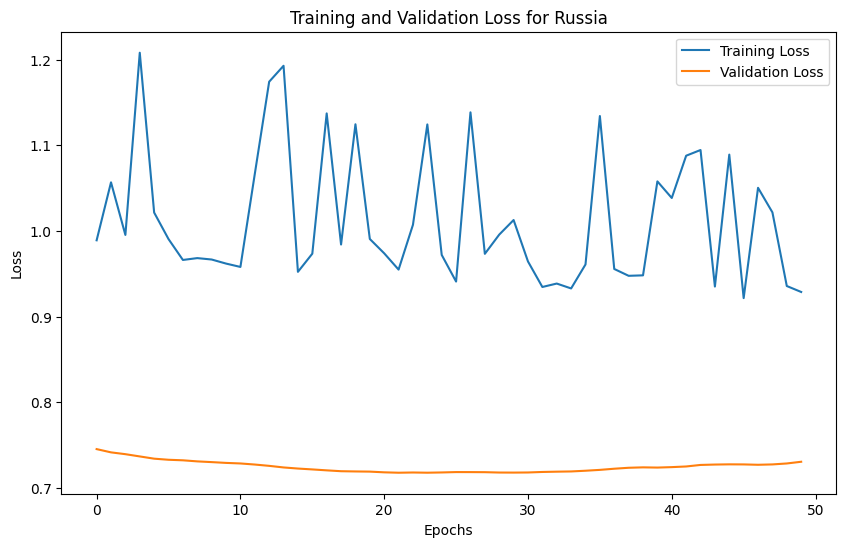


Performance for Russia:
Training MSE: 8704360217346834432.00, Test MSE: 8307997820405678080.00
Training R²: 0.0252, Test R²: -0.0104


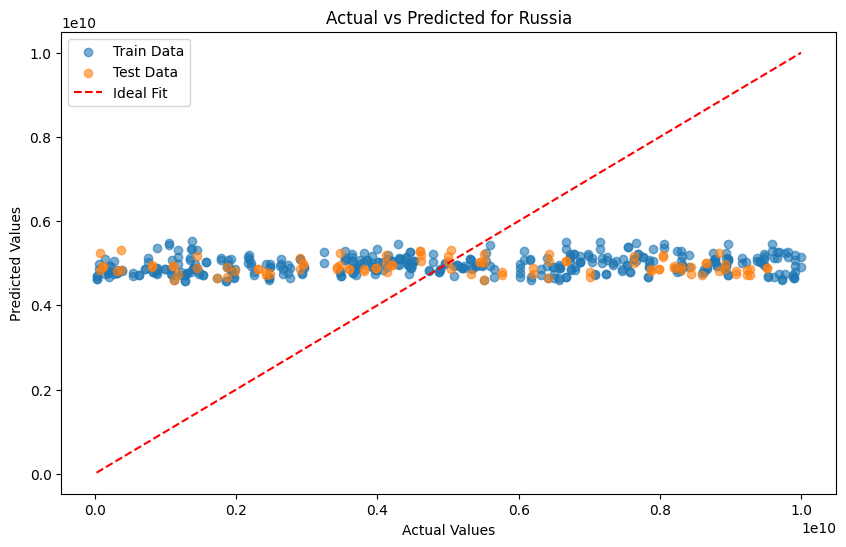

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead 

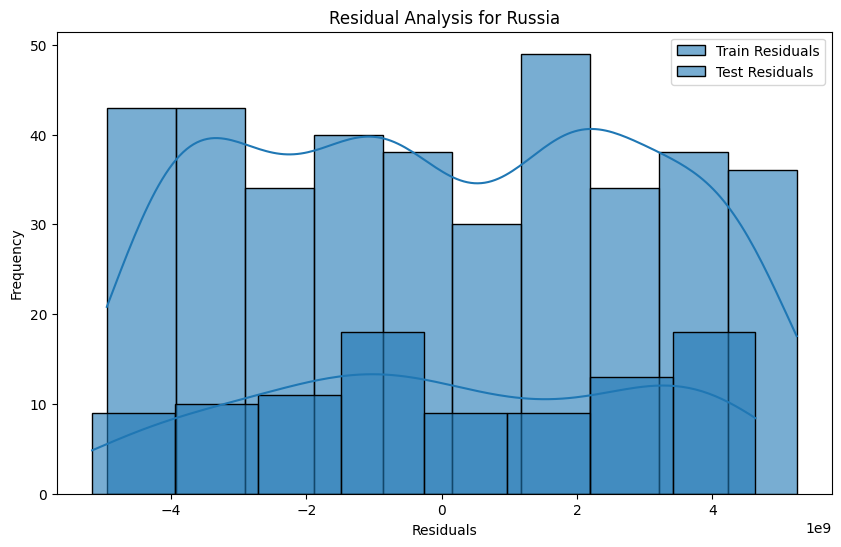

[I 2025-01-25 23:11:04,281] A new study created in memory with name: no-name-54aa5470-77a2-4c5a-91d1-56d5e12c92d1



Training for country: USA


/var/folders/x1/372gwtfn29x0fxqytxw4dk1r0000gn/T/ipykernel_43892/3967365004.py:76: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/var/folders/x1/372gwtfn29x0fxqytxw4dk1r0000gn/T/ipykernel_43892/3967365004.py:77: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2025-01-25 23:11:07,742] Trial 0 finished with value: 0.9869290590286255 and parameters: {'hidden_size': 48, 'num_layers': 3, 'dropout': 0.1974204727482174, 'batch_size': 40, 'learning_rate': 1.493676925827681e-05, 'weight_decay': 3.7263360461243054e-05}. Best is trial 0 with value: 0.9869290590286255.
[I 2025-01-25 23:11:14,429] Trial 1 finished with value: 0.960641473531723 and parameters: {'hidden_size': 61, 'n

Best parameters for USA using optuna: {'hidden_size': 119, 'num_layers': 2, 'dropout': 0.4215009164897089, 'batch_size': 53, 'learning_rate': 1.146976033078489e-05, 'weight_decay': 3.742339428386783e-06}


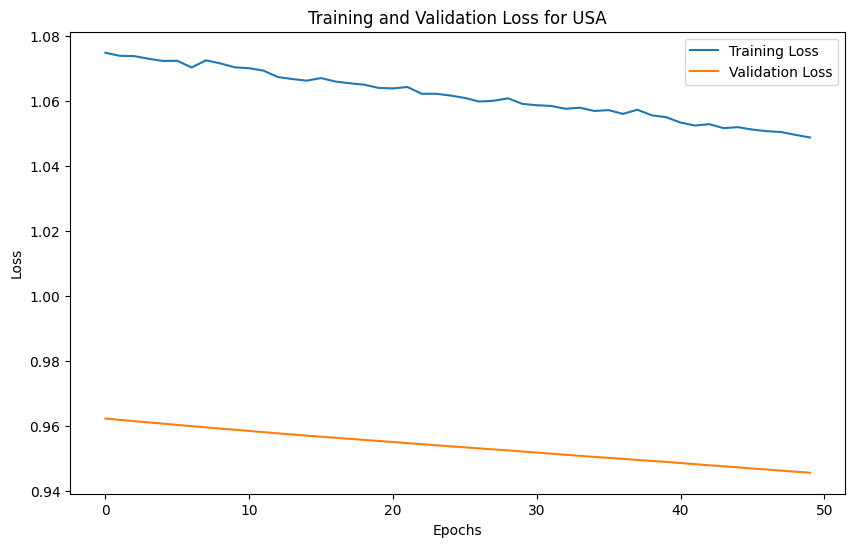


Performance for USA:
Training MSE: 8662008678712344576.00, Test MSE: 7899176857210191872.00
Training R²: -0.0301, Test R²: -0.0091


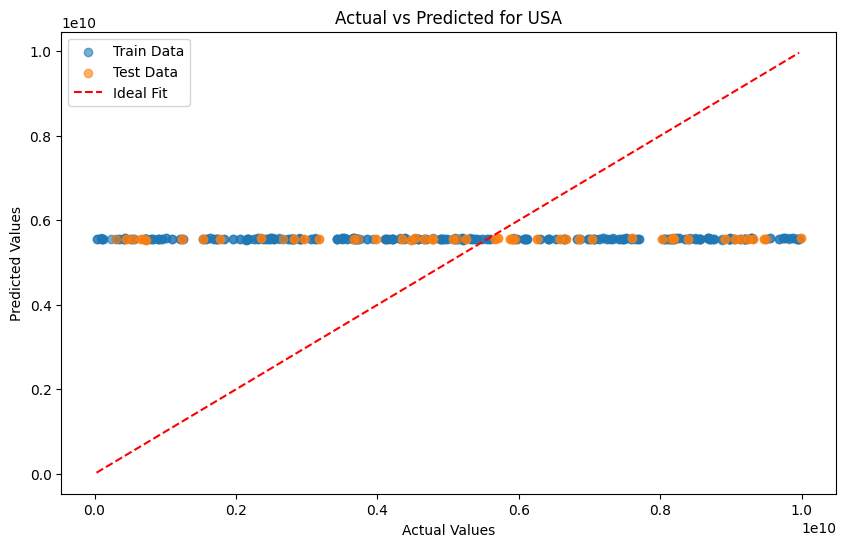

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead 

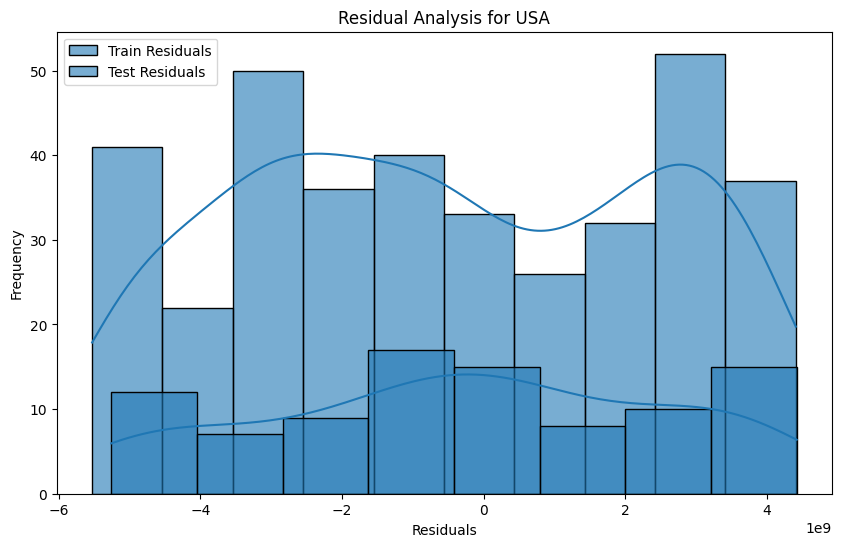

In [36]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (mean_squared_error, mean_absolute_error, r2_score,
                             classification_report, roc_auc_score, precision_recall_curve, auc)
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
import optuna
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
import matplotlib.pyplot as plt
import seaborn as sns

# Set random seeds for reproducibility
np.random.seed(42)
torch.manual_seed(42)

# Load and preprocess the dataset
file_path = '/Users/niloyshowrav/Downloads/nsu/Research/complete_renewable_energy_dataset_augmented_dataset.xlsx'
data = pd.read_excel(file_path)

# Features and target
features = [
    "GDP", "Energy Consumption", "Population", "Renewable Energy Jobs",
    "Government Policies", "Renewable Energy Targets", "Average Annual Temperature",
    "Public Awareness", "Proportion of Energy from Renewables", "Urbanization Rate"
]
target = "R&D Expenditure"

# Ensure data is sorted by Year for time series analysis
data = data.sort_values(by=['Country', 'Year'])

# Scale features and target
scaler_features = StandardScaler()
scaler_target = StandardScaler()

def preprocess_country_data(country_data):
    X_scaled = scaler_features.fit_transform(country_data[features])
    y_scaled = scaler_target.fit_transform(country_data[[target]])
    return X_scaled, y_scaled

def create_sequences(input_data, target_data, seq_length):
    X, y = [], []
    for i in range(len(input_data) - seq_length):
        X.append(input_data[i:(i + seq_length)])
        y.append(target_data[i + seq_length])
    return np.array(X), np.array(y)

# Define LSTM Model
class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size=32, num_layers=2, dropout=0.1):
        super(LSTMModel, self).__init__()
        self.lstm = nn.LSTM(input_size=input_size, hidden_size=hidden_size,
                            num_layers=num_layers, batch_first=True, dropout=dropout)
        self.fc1 = nn.Linear(hidden_size, 16)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(dropout)
        self.fc2 = nn.Linear(16, 1)

    def forward(self, x):
        lstm_out, _ = self.lstm(x)
        last_time_step = lstm_out[:, -1, :]
        x = self.fc1(last_time_step)
        x = self.relu(x)
        x = self.dropout(x)
        x = self.fc2(x)
        return x

# Optuna objective function
def optuna_objective(trial, X_train, y_train, X_test, y_test):
    hidden_size = trial.suggest_int('hidden_size', 16, 128)
    num_layers = trial.suggest_int('num_layers', 1, 3)
    dropout = trial.suggest_float('dropout', 0.0, 0.5)
    batch_size = trial.suggest_int('batch_size', 8, 64)
    learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)
    weight_decay = trial.suggest_loguniform('weight_decay', 1e-6, 1e-4)

    model = LSTMModel(input_size=len(features), hidden_size=hidden_size, num_layers=num_layers, dropout=dropout)
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)
    train_loader = DataLoader(TensorDataset(X_train, y_train), batch_size=batch_size, shuffle=True)
    test_loader = DataLoader(TensorDataset(X_test, y_test), batch_size=batch_size, shuffle=False)

    for epoch in range(20):
        model.train()
        for X_batch, y_batch in train_loader:
            optimizer.zero_grad()
            y_pred = model(X_batch)
            loss = criterion(y_pred, y_batch)
            loss.backward()
            optimizer.step()

    model.eval()
    val_loss = 0
    with torch.no_grad():
        for X_batch, y_batch in test_loader:
            y_pred = model(X_batch)
            val_loss += criterion(y_pred, y_batch).item()

    return val_loss / len(test_loader)

# Random Search
def random_search(X_train, y_train, X_test, y_test):
    param_distributions = {
        'hidden_size': np.arange(16, 129, 16),
        'num_layers': [1, 2, 3],
        'dropout': np.linspace(0.0, 0.5, 6),
        'batch_size': [8, 16, 32, 64],
        'learning_rate': np.logspace(-5, -2, 10),
        'weight_decay': np.logspace(-6, -4, 10)
    }

    best_params = None
    best_loss = float('inf')

    for _ in range(50):  # Number of random samples
        params = {k: np.random.choice(v) for k, v in param_distributions.items()}

        model = LSTMModel(input_size=len(features), hidden_size=params['hidden_size'],
                          num_layers=params['num_layers'], dropout=params['dropout'])
        criterion = nn.MSELoss()
        optimizer = optim.Adam(model.parameters(), lr=params['learning_rate'], weight_decay=params['weight_decay'])
        train_loader = DataLoader(TensorDataset(X_train, y_train), batch_size=params['batch_size'], shuffle=True)

        for epoch in range(20):
            model.train()
            for X_batch, y_batch in train_loader:
                optimizer.zero_grad()
                y_pred = model(X_batch)
                loss = criterion(y_pred, y_batch)
                loss.backward()
                optimizer.step()

        model.eval()
        val_loss = 0
        with torch.no_grad():
            for X_batch, y_batch in DataLoader(TensorDataset(X_test, y_test), batch_size=params['batch_size']):
                y_pred = model(X_batch)
                val_loss += criterion(y_pred, y_batch).item()

        if val_loss < best_loss:
            best_loss = val_loss
            best_params = params

    return best_params

# Grid Search
def grid_search(X_train, y_train, X_test, y_test):
    param_grid = {
        'hidden_size': [32, 64, 128],
        'num_layers': [1, 2],
        'dropout': [0.0, 0.2, 0.4],
        'batch_size': [16, 32],
        'learning_rate': [1e-4, 1e-3],
        'weight_decay': [1e-5, 1e-4]
    }

    best_params = None
    best_loss = float('inf')

    from itertools import product
    for params in product(*param_grid.values()):
        param_dict = dict(zip(param_grid.keys(), params))

        model = LSTMModel(input_size=len(features), hidden_size=param_dict['hidden_size'],
                          num_layers=param_dict['num_layers'], dropout=param_dict['dropout'])
        criterion = nn.MSELoss()
        optimizer = optim.Adam(model.parameters(), lr=param_dict['learning_rate'], weight_decay=param_dict['weight_decay'])
        train_loader = DataLoader(TensorDataset(X_train, y_train), batch_size=param_dict['batch_size'], shuffle=True)

        for epoch in range(20):
            model.train()
            for X_batch, y_batch in train_loader:
                optimizer.zero_grad()
                y_pred = model(X_batch)
                loss = criterion(y_pred, y_batch)
                loss.backward()
                optimizer.step()

        model.eval()
        val_loss = 0
        with torch.no_grad():
            for X_batch, y_batch in DataLoader(TensorDataset(X_test, y_test), batch_size=param_dict['batch_size']):
                y_pred = model(X_batch)
                val_loss += criterion(y_pred, y_batch).item()

        if val_loss < best_loss:
            best_loss = val_loss
            best_params = param_dict

    return best_params

def train_and_evaluate_model(country, country_data, method='optuna'):
    print(f"\nTraining for country: {country}")

    X_scaled, y_scaled = preprocess_country_data(country_data)
    seq_length = 8
    X, y = create_sequences(X_scaled, y_scaled, seq_length)

    X = torch.FloatTensor(X)
    y = torch.FloatTensor(y)

    train_size = int(len(X) * 0.8)
    X_train, X_test = X[:train_size], X[train_size:]
    y_train, y_test = y[:train_size], y[train_size:]

    if method == 'optuna':
        study = optuna.create_study(direction='minimize')
        study.optimize(lambda trial: optuna_objective(trial, X_train, y_train, X_test, y_test), n_trials=50)
        best_params = study.best_params
    elif method == 'random_search':
        best_params = random_search(X_train, y_train, X_test, y_test)
    elif method == 'grid_search':
        best_params = grid_search(X_train, y_train, X_test, y_test)
    else:
        raise ValueError("Invalid method. Choose from 'optuna', 'random_search', or 'grid_search'.")

    print(f"Best parameters for {country} using {method}: {best_params}")

    model = LSTMModel(input_size=len(features), hidden_size=best_params['hidden_size'],
                      num_layers=best_params['num_layers'], dropout=best_params['dropout'])
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=best_params['learning_rate'],
                           weight_decay=best_params['weight_decay'])
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5, verbose=True)

    train_loader = DataLoader(TensorDataset(X_train, y_train), batch_size=best_params['batch_size'], shuffle=True)
    test_loader = DataLoader(TensorDataset(X_test, y_test), batch_size=best_params['batch_size'], shuffle=False)

    train_losses, test_losses = [], []

    for epoch in range(50):
        model.train()
        for X_batch, y_batch in train_loader:
            optimizer.zero_grad()
            y_pred = model(X_batch)
            loss = criterion(y_pred, y_batch)
            loss.backward()
            optimizer.step()

        model.eval()
        train_loss, test_loss = 0, 0
        with torch.no_grad():
            for X_batch, y_batch in train_loader:
                y_pred = model(X_batch)
                train_loss += criterion(y_pred, y_batch).item()

            for X_batch, y_batch in test_loader:
                y_pred = model(X_batch)
                test_loss += criterion(y_pred, y_batch).item()

        train_losses.append(train_loss / len(train_loader))
        test_losses.append(test_loss / len(test_loader))

    # Plot Training and Validation Loss
    plt.figure(figsize=(10, 6))
    plt.plot(train_losses, label='Training Loss')
    plt.plot(test_losses, label='Validation Loss')
    plt.title(f'Training and Validation Loss for {country}')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    # Evaluate the model
    model.eval()
    y_pred_train = model(X_train).detach().numpy()
    y_pred_test = model(X_test).detach().numpy()

    y_train_orig = scaler_target.inverse_transform(y_train.numpy())
    y_test_orig = scaler_target.inverse_transform(y_test.numpy())
    y_pred_train_orig = scaler_target.inverse_transform(y_pred_train)
    y_pred_test_orig = scaler_target.inverse_transform(y_pred_test)

    train_mse = mean_squared_error(y_train_orig, y_pred_train_orig)
    test_mse = mean_squared_error(y_test_orig, y_pred_test_orig)
    train_r2 = r2_score(y_train_orig, y_pred_train_orig)
    test_r2 = r2_score(y_test_orig, y_pred_test_orig)

    print(f"\nPerformance for {country}:")
    print(f"Training MSE: {train_mse:.2f}, Test MSE: {test_mse:.2f}")
    print(f"Training R²: {train_r2:.4f}, Test R²: {test_r2:.4f}")

    # Actual vs Predicted
    plt.figure(figsize=(10, 6))
    plt.scatter(y_train_orig, y_pred_train_orig, label='Train Data', alpha=0.6)
    plt.scatter(y_test_orig, y_pred_test_orig, label='Test Data', alpha=0.6)
    plt.plot([min(y_train_orig), max(y_train_orig)], [min(y_train_orig), max(y_train_orig)], 'r--', label='Ideal Fit')
    plt.title(f'Actual vs Predicted for {country}')
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')
    plt.legend()
    plt.show()

    # Residual Analysis
    train_residuals = y_train_orig - y_pred_train_orig
    test_residuals = y_test_orig - y_pred_test_orig

    plt.figure(figsize=(10, 6))
    sns.histplot(train_residuals, kde=True, label='Train Residuals', color='blue', alpha=0.6)
    sns.histplot(test_residuals, kde=True, label='Test Residuals', color='orange', alpha=0.6)
    plt.title(f'Residual Analysis for {country}')
    plt.xlabel('Residuals')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()

    return model

# Train and evaluate for each country
countries = data['Country'].unique()
models = {}

for country in countries:
    country_data = data[data['Country'] == country]
    model = train_and_evaluate_model(country, country_data, method='optuna')  # Change method here as needed
    models[country] = model


Predictions for Australia: 5
Predicted values for Australia: [2676623600.0, 7242100000.0, 2256876300.0, 2676623600.0, 4462074000.0]
Predictions for Brazil: 5
Predicted values for Brazil: [3493492700.0, 1909190800.0, 3493492700.0, 3493492700.0, 7893687300.0]
Predictions for Canada: 5
Predicted values for Canada: [4595935700.0, 4552093700.0, 4595935700.0, 4595935700.0, 4583019000.0]
Predictions for China: 5
Predicted values for China: [5194928000.0, 5689596400.0, 5194928000.0, 5194928000.0, 5557682700.0]
Predictions for France: 5
Predicted values for France: [4503932000.0, 4519578000.0, 4503932000.0, 4503932000.0, 4555623000.0]
Predictions for Germany: 5
Predicted values for Germany: [3344297500.0, 3899567600.0, 3344297500.0, 3344297500.0, 5305318000.0]
Predictions for India: 5
Predicted values for India: [4867326500.0, 4904621600.0, 4867326500.0, 4867326500.0, 4859394600.0]
Predictions for Japan: 5
Predicted values for Japan: [5464151000.0, 5570031000.0, 5464151000.0, 5464151000.0, 5108

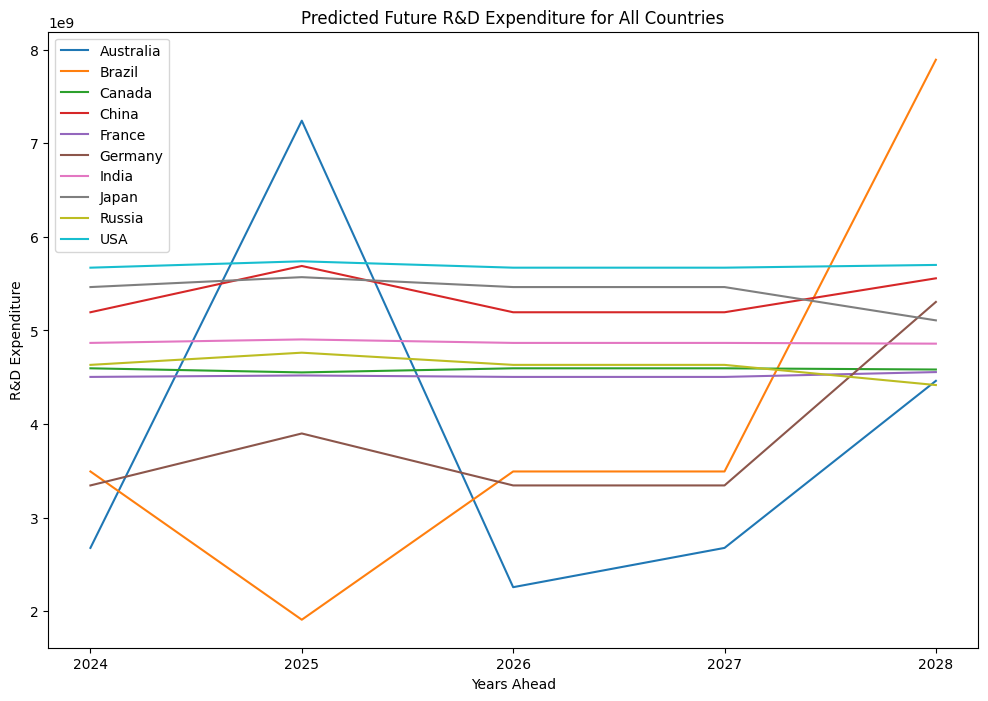

In [39]:
import numpy as np
import matplotlib.pyplot as plt

# Number of future years to predict
future_years = 5

# Placeholder for future predictions for all countries
future_predictions = {}

# Predict future R&D expenditure for all countries
for country, model in models.items():
    country_data = data[data['Country'] == country]
    
    # Get the last available data points for the country
    last_data_point = country_data[features].iloc[-1:].values
    last_target_point = country_data[[target]].iloc[-1:].values

    # Prepare the input data for the LSTM model (use the last available data as a sequence)
    X_input = last_data_point  # Start with the last data point as input
    
    # List to store future predictions for the country
    predictions = []
    
    # Predict future R&D expenditure for multiple years
    for year in range(future_years):
        # Convert to torch tensor for LSTM input
        X_input_tensor = torch.FloatTensor(X_input).unsqueeze(0)  # Add batch dimension
        
        # Get predictions for the next year
        model.eval()
        with torch.no_grad():
            future_pred = model(X_input_tensor).numpy().flatten()
        
        # Inverse transform predictions
        future_pred_original = scaler_target.inverse_transform(future_pred.reshape(-1, 1)).flatten()
        
        # Store the prediction
        predictions.append(future_pred_original[0])  # Keep the first (and only) prediction
        
        # Update the input for the next year (use the current prediction as the input for the next year)
        # Update the sequence (this depends on your model's input format)
        X_input = np.append(X_input[:, 1:], future_pred.reshape(1, -1), axis=1)  # Update the input sequence

    # Store the future predictions
    future_predictions[country] = predictions

# Debug: print the shape of predictions for each country and their values
for country, predictions in future_predictions.items():
    print(f"Predictions for {country}: {len(predictions)}")
    print(f"Predicted values for {country}: {predictions}")

# Plot R&D Expenditure predictions for all countries
plt.figure(figsize=(12, 8))
for country, predictions in future_predictions.items():
    # Plot the predictions for the future years starting from 2024 to 2030
    years = np.arange(2024, 2024 + future_years)  # Ensure integer years
    plt.plot(years, predictions, label=country)

# Set the x-ticks to be integers only
plt.xticks(np.arange(2024, 2024 + future_years, 1))  # Set x-ticks at integer values

plt.title('Predicted Future R&D Expenditure for All Countries')
plt.xlabel('Years Ahead')
plt.ylabel('R&D Expenditure')
plt.legend()
plt.show()


[I 2025-01-26 19:26:06,129] A new study created in memory with name: no-name-69b1b389-9c27-4004-aec5-836f9c4706d8
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
[I 2025-01-26 19:26:38,717] Trial 0 finished with value: 0.9841127519337636 and parameters: {'hidden_size': 54, 'num_layers': 3, 'dropout': 0.12171719122911878, 'batch_size': 19, 'learning_rate': 1.3720367498051446e-05, 'weight_decay': 1.5903624341014955e-06}. Best is trial 0 with value: 0.9841127519337636.
[I 2025-01-26 19:27:01,602] Trial 1 finished with value: 0.9846500399950389 and parameters: {'hidden_size'

Best hyperparameters found:  {'hidden_size': 103, 'num_layers': 3, 'dropout': 0.26311562489121, 'batch_size': 55, 'learning_rate': 0.00047924903134967053, 'weight_decay': 9.338870547150318e-05}
Epoch 1/100, Train Loss: 1.0076, Validation Loss: 0.9854
Epoch 2/100, Train Loss: 1.0049, Validation Loss: 0.9842
Epoch 3/100, Train Loss: 1.0114, Validation Loss: 0.9841
Epoch 4/100, Train Loss: 1.0080, Validation Loss: 0.9845
Epoch 5/100, Train Loss: 1.0051, Validation Loss: 0.9905
Epoch 6/100, Train Loss: 1.0023, Validation Loss: 0.9874
Epoch 7/100, Train Loss: 1.0006, Validation Loss: 0.9935
Epoch 8/100, Train Loss: 1.0007, Validation Loss: 0.9878
Epoch 9/100, Train Loss: 0.9973, Validation Loss: 0.9939
Epoch 10/100, Train Loss: 0.9972, Validation Loss: 0.9956
Epoch 11/100, Train Loss: 0.9942, Validation Loss: 0.9963
Epoch 12/100, Train Loss: 0.9922, Validation Loss: 0.9949
Epoch 13/100, Train Loss: 0.9948, Validation Loss: 0.9948
Epoch 14/100, Train Loss: 0.9898, Validation Loss: 0.9984
Epo

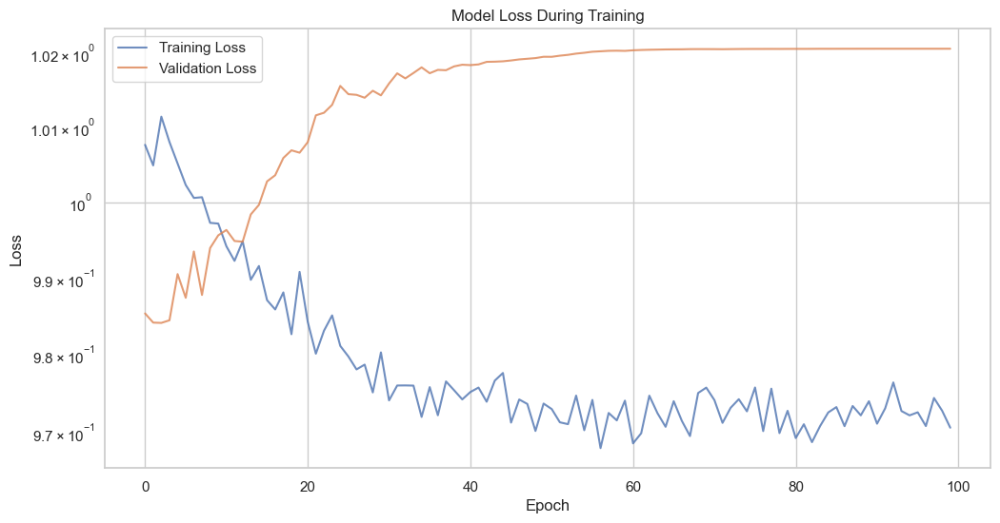


Model Performance Metrics:
Training MSE: 8,024,580,556,404,555,776.00
Test MSE: 8,456,993,740,597,231,616.00
Training MAE: 2,447,154,688.00
Test MAE: 2,478,230,016.00
Training R²: 0.0344
Test R²: -0.0367


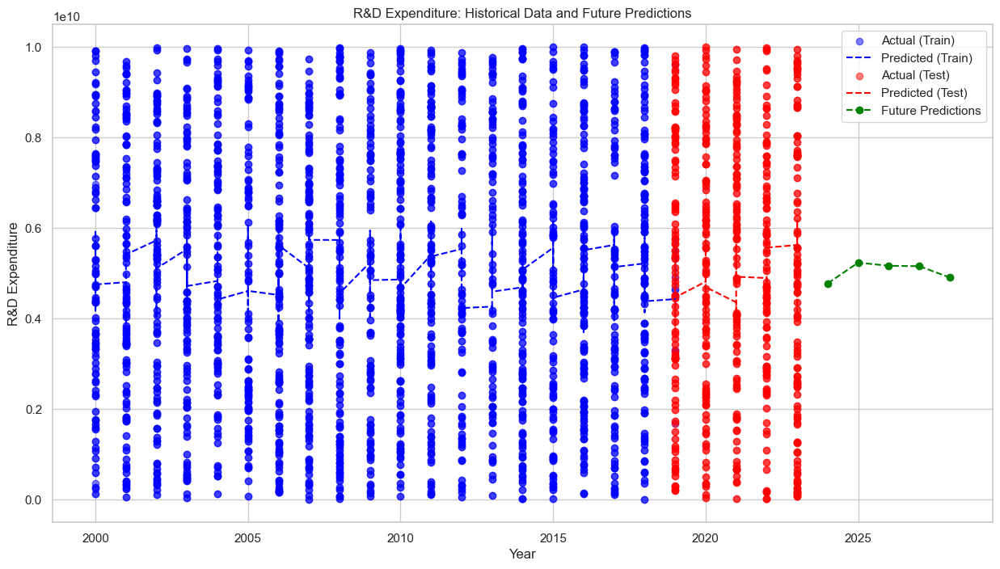


Future R&D Predictions and Growth Rates:
Year 2024: R&D Expenditure = 4,779,716,501.41
Growth Rate: 9.59%
Year 2025: R&D Expenditure = 5,238,174,034.52
Growth Rate: -1.34%
Year 2026: R&D Expenditure = 5,168,076,506.83
Growth Rate: -0.17%
Year 2027: R&D Expenditure = 5,159,212,731.94
Growth Rate: -4.85%
Year 2028: R&D Expenditure = 4,909,061,505.37

Average Predicted R&D Growth Rate: 0.81%


In [114]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import optuna
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform, randint

# Set random seeds for reproducibility
np.random.seed(42)
torch.manual_seed(42)

# Load and preprocess the dataset
file_path = '/Users/niloyshowrav/Downloads/nsu/Research/complete_renewable_energy_dataset_augmented_dataset.xlsx'
data = pd.read_excel(file_path)

# Select features and target
features = [
    "Year", "GDP", "Energy Consumption", "Population", "Renewable Energy Jobs",
    "Government Policies", "Renewable Energy Targets", "Average Annual Temperature",
    "Public Awareness", "Proportion of Energy from Renewables", "Urbanization Rate"
]
target = "R&D Expenditure"

# Sort by year for sequential data
data = data.sort_values(by='Year')

# Scale features and target
scaler_features = StandardScaler()
scaler_target = StandardScaler()

X_scaled = scaler_features.fit_transform(data[features])
y_scaled = scaler_target.fit_transform(data[[target]])

# Create sequences for LSTM
def create_sequences(input_data, target_data, seq_length):
    X, y = [], []
    for i in range(len(input_data) - seq_length):
        X.append(input_data[i:(i + seq_length)])
        y.append(target_data[i + seq_length])
    return np.array(X), np.array(y)

sequence_length = 8
X, y = create_sequences(X_scaled, y_scaled, sequence_length)

# Convert to PyTorch tensors
X = torch.FloatTensor(X)
y = torch.FloatTensor(y)

# Train-test split
train_size = int(len(X) * 0.8)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# Create DataLoader
batch_size = 8
train_dataset = TensorDataset(X_train, y_train)
test_dataset = TensorDataset(X_test, y_test)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Define LSTM Model
class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size=32, num_layers=2, dropout=0.1):
        super(LSTMModel, self).__init__()
        self.lstm = nn.LSTM(input_size=input_size, hidden_size=hidden_size, num_layers=num_layers, batch_first=True, dropout=dropout)
        self.fc1 = nn.Linear(hidden_size, 16)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(dropout)
        self.fc2 = nn.Linear(16, 1)

    def forward(self, x):
        lstm_out, _ = self.lstm(x)
        last_time_step = lstm_out[:, -1, :]
        x = self.fc1(last_time_step)
        x = self.relu(x)
        x = self.dropout(x)
        x = self.fc2(x)
        return x

# Hyperparameter tuning using Optuna
def objective(trial):
    hidden_size = trial.suggest_int('hidden_size', 16, 128)
    num_layers = trial.suggest_int('num_layers', 1, 3)
    dropout = trial.suggest_float('dropout', 0.0, 0.5)
    batch_size = trial.suggest_int('batch_size', 8, 64)
    learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)
    weight_decay = trial.suggest_loguniform('weight_decay', 1e-6, 1e-4)

    model = LSTMModel(input_size=len(features), hidden_size=hidden_size, num_layers=num_layers, dropout=dropout)
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5, verbose=True)

    train_dataset = TensorDataset(X_train, y_train)
    test_dataset = TensorDataset(X_test, y_test)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    best_loss = float('inf')
    for epoch in range(50):
        model.train()
        train_loss = 0
        for X_batch, y_batch in train_loader:
            optimizer.zero_grad()
            y_pred = model(X_batch)
            loss = criterion(y_pred, y_batch)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step()
            train_loss += loss.item()

        model.eval()
        val_loss = 0
        with torch.no_grad():
            for X_batch, y_batch in test_loader:
                y_pred = model(X_batch)
                val_loss += criterion(y_pred, y_batch).item()

        avg_train_loss = train_loss / len(train_loader)
        avg_val_loss = val_loss / len(test_loader)
        scheduler.step(avg_val_loss)

        if avg_val_loss < best_loss:
            best_loss = avg_val_loss

    return best_loss
def train_model(model, train_loader, test_loader, criterion, optimizer, scheduler, n_epochs=100):
    train_losses = []
    val_losses = []

    for epoch in range(n_epochs):
        model.train()
        train_loss = 0.0

        for X_batch, y_batch in train_loader:
            optimizer.zero_grad()
            y_pred = model(X_batch)
            loss = criterion(y_pred, y_batch)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step()
            train_loss += loss.item()

        train_losses.append(train_loss / len(train_loader))

        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for X_batch, y_batch in test_loader:
                y_pred = model(X_batch)
                loss = criterion(y_pred, y_batch)
                val_loss += loss.item()

        val_losses.append(val_loss / len(test_loader))

        scheduler.step(val_losses[-1])

        print(f"Epoch {epoch + 1}/{n_epochs}, Train Loss: {train_losses[-1]:.4f}, Validation Loss: {val_losses[-1]:.4f}")

    return train_losses, val_losses

# Set up the Optuna study
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=50)

# Best hyperparameters found by Optuna
best_params = study.best_params
print("Best hyperparameters found: ", best_params)

# Re-train model with best parameters
best_model = LSTMModel(input_size=len(features), 
                       hidden_size=best_params['hidden_size'], 
                       num_layers=best_params['num_layers'], 
                       dropout=best_params['dropout'])

criterion = nn.MSELoss()
optimizer = optim.Adam(best_model.parameters(), lr=best_params['learning_rate'], weight_decay=best_params['weight_decay'])
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5, verbose=True)

# Train the best model
train_losses, val_losses = train_model(best_model, train_loader, test_loader, criterion, optimizer, scheduler, n_epochs=100)

# Plot Training and Validation Losses
plt.figure(figsize=(12, 6))
plt.plot(train_losses, label='Training Loss', alpha=0.8)
plt.plot(val_losses, label='Validation Loss', alpha=0.8)
plt.title('Model Loss During Training')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.yscale('log')
plt.legend()
plt.grid(True)
plt.savefig('training_loss_rd_optuna.png', dpi=300, bbox_inches='tight')
plt.show()

# Evaluate Model Performance
best_model.eval()
with torch.no_grad():
    y_pred_train = best_model(X_train).numpy()
    y_pred_test = best_model(X_test).numpy()

y_pred_train = scaler_target.inverse_transform(y_pred_train)
y_pred_test = scaler_target.inverse_transform(y_pred_test)
y_train_orig = scaler_target.inverse_transform(y_train.numpy())
y_test_orig = scaler_target.inverse_transform(y_test.numpy())

train_mse = mean_squared_error(y_train_orig, y_pred_train)
test_mse = mean_squared_error(y_test_orig, y_pred_test)
train_mae = mean_absolute_error(y_train_orig, y_pred_train)
test_mae = mean_absolute_error(y_test_orig, y_pred_test)
train_r2 = r2_score(y_train_orig, y_pred_train)
test_r2 = r2_score(y_test_orig, y_pred_test)

print("\nModel Performance Metrics:")
print(f"Training MSE: {train_mse:,.2f}")
print(f"Test MSE: {test_mse:,.2f}")
print(f"Training MAE: {train_mae:,.2f}")
print(f"Test MAE: {test_mae:,.2f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")

# Future Predictions
last_sequence = X_scaled[-sequence_length:].reshape(1, sequence_length, -1)
last_sequence = torch.FloatTensor(last_sequence)
future_steps = 5
predictions = []

with torch.no_grad():
    current_sequence = last_sequence
    for _ in range(future_steps):
        output = best_model(current_sequence)
        predictions.append(output.item())
        current_sequence = current_sequence.squeeze(0)
        current_sequence = torch.roll(current_sequence, -1, dims=0)
        current_sequence[-1] = output
        current_sequence = current_sequence.unsqueeze(0)

future_predictions = np.array(predictions).reshape(-1, 1)
future_rd = scaler_target.inverse_transform(future_predictions)

# Plot Future Predictions
last_year = data['Year'].max()
future_years = np.arange(last_year + 1, last_year + future_steps + 1)

plt.figure(figsize=(15, 8))
train_years = data['Year'].values[sequence_length:train_size+sequence_length]
test_years = data['Year'].values[train_size+sequence_length:]

plt.scatter(train_years, y_train_orig, color='blue', alpha=0.5, label='Actual (Train)')
plt.plot(train_years, y_pred_train, color='blue', linestyle='--', label='Predicted (Train)')
plt.scatter(test_years, y_test_orig, color='red', alpha=0.5, label='Actual (Test)')
plt.plot(test_years, y_pred_test, color='red', linestyle='--', label='Predicted (Test)')
plt.plot(future_years, future_rd, color='green', linestyle='--', marker='o', label='Future Predictions')

plt.title('R&D Expenditure: Historical Data and Future Predictions')
plt.xlabel('Year')
plt.ylabel('R&D Expenditure')
plt.legend()
plt.grid(True)
plt.savefig('rd_predictions_optuna.png', dpi=300, bbox_inches='tight')
plt.show()

# Calculate growth rates
growth_rates = [(future_rd[i+1][0] / future_rd[i][0] - 1) * 100 for i in range(len(future_rd)-1)]
print("\nFuture R&D Predictions and Growth Rates:")
for i, (year, rd) in enumerate(zip(future_years, future_rd)):
    print(f"Year {year}: R&D Expenditure = {rd[0]:,.2f}")
    if i < len(growth_rates):
        print(f"Growth Rate: {growth_rates[i]:.2f}%")

print(f"\nAverage Predicted R&D Growth Rate: {np.mean(growth_rates):.2f}%")



Pearson Correlation between Installed Capacity and Proportion of Renewables: 0.02 (p-value: 0.1645)


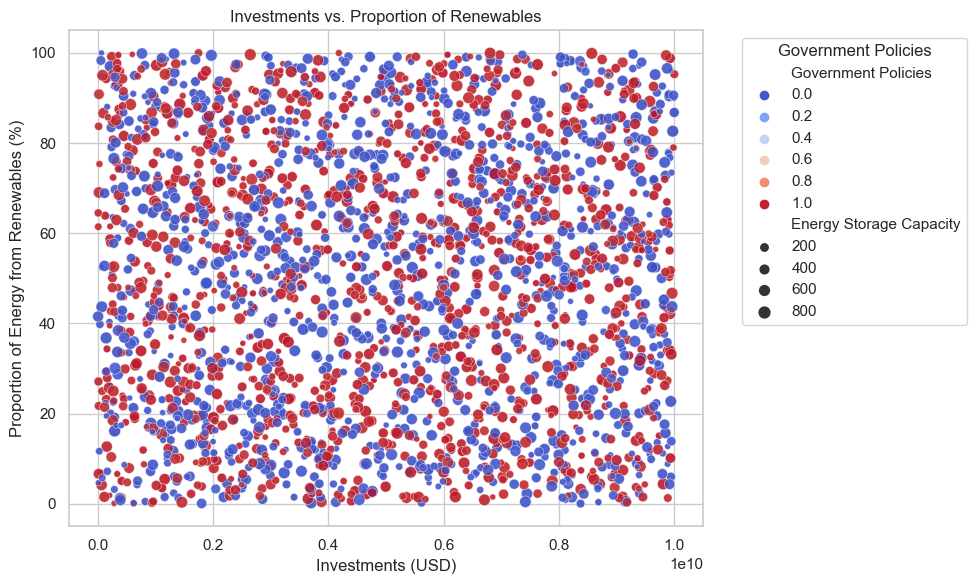

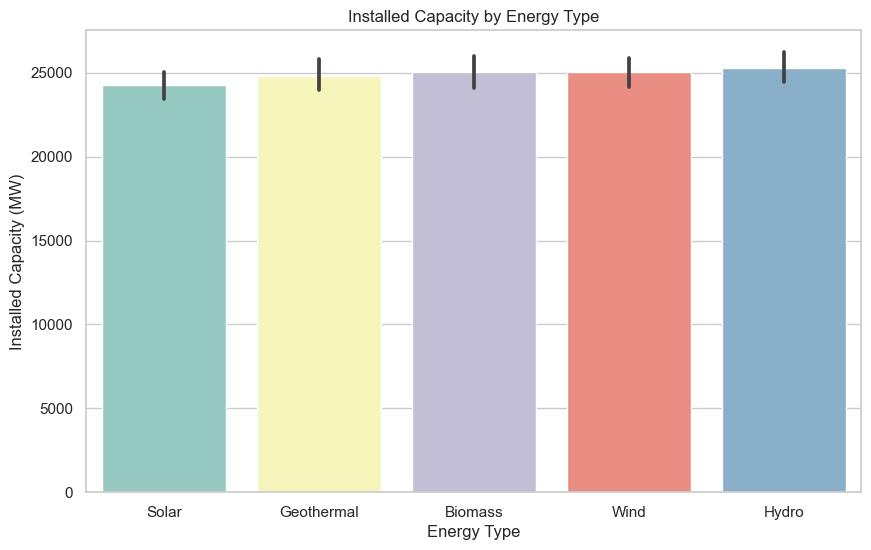


Regression Analysis Summary:
                                     OLS Regression Results                                     
Dep. Variable:     Proportion of Energy from Renewables   R-squared:                       0.002
Model:                                              OLS   Adj. R-squared:                  0.001
Method:                                   Least Squares   F-statistic:                     2.937
Date:                                  Sun, 26 Jan 2025   Prob (F-statistic):             0.0320
Time:                                          19:48:40   Log-Likelihood:                -23913.
No. Observations:                                  5000   AIC:                         4.783e+04
Df Residuals:                                      4996   BIC:                         4.786e+04
Df Model:                                             3                                         
Covariance Type:                              nonrobust                                         


In [115]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
import statsmodels.api as sm

df = pd.read_excel('/Users/niloyshowrav/Downloads/nsu/Research/complete_renewable_energy_dataset_augmented_dataset.xlsx')
critical_columns = ['Installed Capacity (MW)', 'Investments (USD)', 'Local Manufacturing Capacity', 'Proportion of Energy from Renewables', 'Government Policies', 'Energy Storage Capacity']
df_clean = df.dropna(subset=critical_columns)
descriptive_stats = df_clean[['Installed Capacity (MW)', 'Investments (USD)', 'Local Manufacturing Capacity', 'Proportion of Energy from Renewables', 'Government Policies', 'Energy Storage Capacity']].describe()


corr_installed, p_installed = pearsonr(df_clean['Installed Capacity (MW)'], df_clean['Proportion of Energy from Renewables'])
print(f"\nPearson Correlation between Installed Capacity and Proportion of Renewables: {corr_installed:.2f} (p-value: {p_installed:.4f})")

plt.figure(figsize=(10,6))
sns.scatterplot(x='Investments (USD)', y='Proportion of Energy from Renewables', hue='Government Policies', size='Energy Storage Capacity', data=df_clean, palette='coolwarm', alpha=0.7)
plt.title('Investments vs. Proportion of Renewables')
plt.xlabel('Investments (USD)')
plt.ylabel('Proportion of Energy from Renewables (%)')
plt.legend(title='Government Policies', bbox_to_anchor=(1.05,1), loc='upper left')
plt.tight_layout()
plt.show()

plt.figure(figsize=(10,6))
sns.barplot(x='Energy Type', y='Installed Capacity (MW)', data=df_clean, palette='Set3')
plt.title('Installed Capacity by Energy Type')
plt.xlabel('Energy Type')
plt.ylabel('Installed Capacity (MW)')
plt.show()

X = df_clean[['Investments (USD)', 'Local Manufacturing Capacity', 'Energy Storage Capacity']]
y = df_clean['Proportion of Energy from Renewables']
X = sm.add_constant(X)
model = sm.OLS(y, X).fit()
print("\nRegression Analysis Summary:")
print(model.summary())
